# Background

- Copied from: `01-09-22_SmarAct_Rotations_v3.ipynb`

- Using as starter for exploring new scan data.

- Starting a new notebook for the new angular dataset after epoxy to fix the loose screws.

# Imports

In [2453]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2454]:
import numpy as np
import pandas as pd
from copy import deepcopy
import pickle as pkl
from collections.abc import Iterable
# from datetime import datetime
from datetime import datetime, timedelta
# from pandas.api.types import is_numeric_dtype
from scipy.interpolate import interp1d
from scipy.spatial.transform import Rotation
import lmfit as lm
# from copy import deepcopy
#from dateutil import parser
from plotly import graph_objects as go
from plotly.offline import plot
import matplotlib.pyplot as plt
# from matplotlib.ticker import AutoMinorLocator
%matplotlib inline

# local imports
# from plotting import config_plots, datetime_plt, get_label
from plotting import config_plots, get_label
from load_slow import *
from Zaber_Magnet_Convert import *
# hallprobecalib package
from hallprobecalib.hpcplots import scatter3d, scatter2d, histo, spherical_scatter3d
from mu2e.mu2eplots import mu2e_plot3d
# V vs. B, T (2021 results)
from V_vs_B_T import V_forward, inv_B_v2, invert_row, calc_B_column

config_plots()
# plt.rcParams.update({"text.usetex": True})

# Functions

## Processing

In [2235]:
def get_probe_IDs(df):
    probes = [c[:-6] for c in df.columns if "Raw_X" in c]
    return sorted(probes)

def Hall_probe_basic_calcs(df, probes):
    # magnitudes and angles
    for p in probes:
        for t in ['Raw', 'Cal']:
            df[f'{p}_{t}_Bmag'] = (df[f'{p}_{t}_X']**2 + df[f'{p}_{t}_Y']**2 + df[f'{p}_{t}_Z']**2)**(1/2)
            df[f'{p}_{t}_Theta'] = np.arccos(df[f'{p}_{t}_Z']/df[f'{p}_{t}_Bmag'])
            df[f'{p}_{t}_Phi'] = np.arctan2(df[f'{p}_{t}_Y'],df[f'{p}_{t}_X'])
    # again using theta redefining Cal components
    for p in probes:
        for t in ['Cal']:
            df[f'{p}_{t}_Theta2'] = np.arccos(df[f'{p}_{t}_X']/df[f'{p}_{t}_Bmag'])
            df[f'{p}_{t}_Phi2'] = np.arctan2(df[f'{p}_{t}_Z'],df[f'{p}_{t}_Y'])
        ### flip phi when theta < 0 (-2)
        '''
        #inds = np.where(df.loc[:, f'{p}_Cal_Theta2'] < -2.0)
        inds = np.where((df.loc[:, 'SmarAct_Meas_Angle_1'] >= 349) & (df.loc[:, 'SmarAct_Meas_Angle_1'] <= 358))
        print(df.iloc[inds][f'{p}_Cal_Phi2'].iloc[0])
        df.loc[df.index[inds], f'{p}_Cal_Phi2'] = df.loc[df.index[inds], f'{p}_Cal_Phi2'] - np.pi
        print(df.iloc[inds][f'{p}_Cal_Phi2'].iloc[0])
        inds2 = np.where(df.loc[:, f'{p}_Cal_Phi2'] < -np.pi)
        print(df.iloc[inds2][f'{p}_Cal_Phi2'].iloc[0])
        df.loc[df.index[inds2], f'{p}_Cal_Phi2'] = df.loc[df.index[inds2], f'{p}_Cal_Phi2'] + 2*np.pi
        print(df.iloc[inds2][f'{p}_Cal_Phi2'].iloc[0])
        '''
    # magnet slow controls
    df['Magnet Resistance [Ohm]'] = df['Magnet Voltage [V]'] / df['Magnet Current [A]']
    df['Coil Resistance [Ohm]'] = 2*df['Magnet Resistance [Ohm]']
    df['Magnet Power [W]'] = df['Magnet Voltage [V]'] * df['Magnet Current [A]']
    # center smaract measured values around zero
    a1 = df.loc[:, 'SmarAct_Meas_Angle_1'].copy().values
    a2 = df.loc[:, 'SmarAct_Meas_Angle_2'].copy().values
    a1[a1 > 180.] = a1[a1 > 180.] - 360.
    a2[a2 > 180.] = a2[a2 > 180.] - 360.
    df.loc[:, 'SmarAct_Meas_Angle_1_Centered'] = a1
    df.loc[:, 'SmarAct_Meas_Angle_2_Centered'] = a2
    ### INTERPOLATE NMR VALUES TO SCAN TIMES
    #### STOPPED HERE 2022-11-29 17:41:36 
    return df

def match_temp_scan_dfs(df_temp, df):
    # assumes scan df is a subset of temp df.
    t0 = df.index[0]
    tf = df.index[-1]
    df_t = df_temp.query(f'"{t0}" <= Datetime <= "{tf}"').copy()
    return df_t

def interp_temp_col(df_temp, df, col='NMR [T]'):
    interp_func = interp1d(df_temp.seconds_delta, df_temp[col].values, kind='linear', fill_value='extrapolate')
    df.loc[:, col] = interp_func(df.seconds_delta)
    return df

# File Info

In [2857]:
#dir_old = '/home/ckampa/Dropbox/LogFiles/temp_rotate_07-06-22/' # old scans
#ddir = '/home/ckampa/Dropbox/LogFiles/temp_rotate_01-09-23/' # new scans
ddir = '/home/ckampa/Dropbox/LogFiles/' # new scans

In [2237]:
"""
#### BEFORE FIX!
# 7-7-22 12:04, probe ##, rotating in magnet, finer scan
# PGC @ 15 deg C
# 0.25 deg steps -10 -- +6 angle 0 (theta)
# 1 deg steps full 360 deg, centered on 0 deg angle 1 (phi)
######
plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2022-07-07_12:04/'
scanfile = ddir_old+'2022-07-07 120406.txt'
slowfile = ddir_old+'2022-07-06 133626slow.txt'
t0 = '07-07-22 12:00' # finer scan started
tf = '07-09-22 18:42' # finer scan finished
""";

In [2789]:
# 01-09-22 12:00, probe ##, rotating in magnet, coarse scan
# PGC @ 20 deg C
# 2 deg steps -9 -- +5 angle 0 (theta)
# 45 deg steps full 360 deg, centered on -16 deg angle 1 (phi)
######
# plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2023-01-09_12:00/'
#scanfile = ddir+'2023-01-09 120012.txt'
#slowfile = ddir+'2023-01-09 104334slow.txt'

In [3287]:
# """
# 04-17-25 16:14, probe ##, rotating in magnet, "quick" scan
# PGC @ 20 deg C
# 1 deg steps 0 -- +14 angle 0 (theta)
# 15 deg steps full 360 deg, centered on +180 deg angle 1 (phi)
######
plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/hall_probe_rotate/2025-04-17/'
# scans
# 1: 20 deg
# scanfile = ddir+'2025-04-16 161436.txt'
# 2: repeat 1 after system has equilibrated
#scanfile = ddir+'2025-04-17 110915.txt'
# 3: 15 deg
#scanfile = ddir+'2025-04-17 135437.txt'
# 4: 25 deg
#scanfile = ddir+'2025-04-17 163125.txt'
# 5: 30 deg
#scanfile = ddir+'2025-04-17 221013.txt'
# 6: 35 deg
#scanfile = ddir+'2025-04-18 004731.txt'
# 7: 15 deg, validation
#scanfile = ddir+'2025-04-18 110400.txt'
# 8: 15 deg, wider range (engineering) -- -3 to 11 deg with 1 deg steps (angle 1), full 360 with 30 deg steps (angle 2)
#scanfile = ddir+'2025-04-18 150308.txt'
# 0.9 T, after updates to LabView all scans for a field strength will be in the same file
#scanfile = ddir+'2025-04-21 111443.txt'
# validation scans after main scans
#scanfile = ddir+'2025-04-22 120255.txt'
# 0.98 T: repeat 15 deg scans 3 times before equilibration (2 hr period)
# scanfile = ddir+'2025-04-22 172233.txt' # 3 scans (first)
# scanfile = ddir+'2025-04-23 012221.txt' # main scans
# 1.11 T:
# scanfile = ddir+'2025-04-23 181230.txt'
# 1.21 T:
#scanfile = ddir+'2025-04-24 165010.txt'
# validations
# scanfile = ddir+'2025-04-26 212116.txt'
# 1.31 T:
#scanfile = ddir+'2025-04-28 132340.txt'
# -1.31 T:
#scanfile = ddir+'2025-04-29 095241.txt'
# -1.21 T:
#scanfile = ddir+'2025-04-30 094727.txt'
# -1.11 T:
#scanfile = ddir+'2025-05-01 163047.txt'
# -0.98 T:
#scanfile = ddir+'2025-05-02 141516.txt'
# validation
#scanfile = ddir+'2025-05-03 215505.txt'
# -0.91
#scanfile = ddir+'2025-05-05 102821.txt'
# -0.75
#scanfile = ddir+'2025-05-06 123746.txt'
# validations (no current change until Monday 5/12
# 0.61
### ADD THIS
# 0.46
# scanfile = ddir+'2025-05-12 173045.txt'
# 0.31
#scanfile = ddir+'2025-05-13 095342.txt'
# -0.61
#scanfile = ddir+'2025-05-14 103326.txt'
# -0.46
#scanfile = ddir+'2025-05-15 101738.txt'
# 0.75 (validation)
# test file (before equilibration, single scan to understand timing)
#scanfile = ddir+'2025-05-20 165814.txt'
# validations
#scanfile = ddir+'2025-05-20 184824.txt'
#### NEW PROBE
scanfile = ddir+'2025-05-23 143544.txt'
###
# slow scan
# slowfile = ddir+'2025-04-16 160730slow.txt' # 0.7 T
# slowfile = ddir+'2025-04-21 103520slow.txt' # 0.9 T
# slowfile = ddir+'2025-04-23 012031slow.txt' # 0.98 T right before starting nominal scans (I did 3 scans at 15 deg before equil.)
# slowfile = ddir+'2025-04-23 181127slow.txt' # 1.11 T right after magnet current change
#slowfile = ddir+'2025-04-28 132017slow.txt' # 1.31 T, after computer shutdown (a few hours after current change)
#slowfile = ddir+'2025-05-09 122556slow.txt' # starting at +0.61 T, swap to low-field probe (not in slow controls!)
#### -0.3
#slowfile = ddir+'2025-05-20 165340slow.txt' # 0.75 T validation
# 0.75 validation (after unbinding motor)
#slowfile = ddir+'2025-05-20 165340slow.txt'
#### NEW PROBE
slowfile = ddir+'2025-05-22 160240slow.txt'
#### slow scan cuts
#### entire file
# t0 = '04-16-25 16:00' # magnet on / entire file
# tf = '01-01-26 00:00' # entire file
#### scan 1
# t0 = '04-16-25 16:08'
# tf = '04-16-25 17:40'
#### scan 2
#t0 = '04-17-25 11:00'
#tf = '04-17-25 12:30'
#### scan 3
# t0 = '04-17-25 13:50'
# tf = '04-17-25 15:10'
#### scan 4
#t0 = '04-17-25 16:25'
#tf = '04-17-25 17:55'
#### scan 5
#t0 = '04-17-25 22:05'
#tf = '04-17-25 23:35'
#### scan 6
#t0 = '04-18-25 00:40'
#tf = '04-18-25 02:10'
##### OVERNIGHT
#t0 = '
#tf = '
#####
#### scan 7
#t0 = '04-18-25 10:55'
#tf = '04-18-25 12:25' # UPDATE
#### scan 8
#t0 = '04-18-25 14:55'
#tf = '04-18-25 15:45' # UPDATE NOTE CURRENT CHANGE HAPPENED BEFORE THE END
# tf = '04-18-25 15:42:45'
#### 0.9 T
# 1 (15 deg)
#t0 = '04-21-25 11:10'
#tf = '04-21-25 12:15'
# 2 (20 deg)
#t0 = '04-21-25 14:10'
#tf = '04-21-25 15:15'
# 3 (25 deg)
# t0 = '04-21-25 17:10'
# tf = '04-21-25 18:15'
# 4 (30 deg)
# t0 = '04-21-25 20:10'
# tf = '04-21-25 21:15'
# 5 (35 deg)
#t0 = '04-21-25 23:10'
#tf = '04-22-25 00:15'
# 6 (15 deg, validation) -- 3 measurements at each point (2 repetitions)
#t0 = '04-22-25 11:55'
#tf = '04-22-25 13:25'
#### 0.98 T
# test scans before equilibration
# 1a: 15 deg
# t0 = '04-22-25 17:19'
# tf = '04-22-25 19:00' # UPDATE
# FILL IN 2 and 3
# main scans
# 1: 15 deg
# t0 = '04-23-25 01:15'
# tf = '04-23-25 02:40' # UPDATE
# 2: 20 deg - overnight
# 3: 25 deg - early morning
### FILL IN
#### 1.11 T
# 1: 15 deg
# t0 = '04-24-25 02:00' # UPDATE
# tf = '04-24-25 03:35' # UPDATE
# 2: 20 deg
# t0 = '04-24-25 05:00' # UPDATE
# tf = '04-24-25 06:35' # UPDATE
# 3: 25 deg
# t0 = '04-24-25 08:00' # UPDATE
# tf = '04-24-25 09:35' # UPDATE
# 4: 30 deg
# t0 = '04-24-25 11:00' # UPDATE
# tf = '04-24-25 12:35' # UPDATE
# 5: 35 deg
# t0 = '04-24-25 14:00' # UPDATE
# tf = '04-24-25 15:35' # UPDATE
#### 1.21 T
# 1: 15 deg
# t0 = '04-25-25 00:45'
# tf = '04-25-25 02:15'
# 2: 20 deg
# t0 = '04-25-25 03:45'
# tf = '04-25-25 05:15'
# 3: 25 deg
# t0 = '04-25-25 06:45'
# tf = '04-25-25 08:15'
# 4: 30 deg
# t0 = '04-25-25 09:45'
# tf = '04-25-25 11:15'
# 5: 35 deg
#t0 = '04-25-25 12:45'
#tf = '04-25-25 14:15'
## validations
# 1: 15 deg
# t0 = '04-26-25 21:15'
# tf = '04-26-25 22:45' # UPDATE
# 2: 20 deg
# t0 = '04-25-25 03:45' # UPDATE
# tf = '04-25-25 05:15' # UPDATE
# 3: 25 deg
# t0 = '04-25-25 06:45' # UPDATE
# tf = '04-25-25 08:15' # UPDATE
# 4: 30 deg
# t0 = '04-25-25 09:45' # UPDATE
# tf = '04-25-25 11:15' # UPDATE
# 5: 35 deg
#t0 = '04-25-25 12:45' # UPDATE
#tf = '04-25-25 14:15' # UPDATE
#### 1.31 T
# 1: 15 deg
# t0 = '04-28-25 17:00'
# tf = '04-28-25 18:30'
# 2: 20 deg
# t0 = '04-28-25 20:00'
# tf = '04-28-25 21:30'
# 3: 25 deg
# t0 = '04-28-25 23:00'
# tf = '04-29-25 00:30'
# 4: 30 deg
# t0 = '04-29-25 02:00'
# tf = '04-29-25 03:30'
# 5: 35 deg
# t0 = '04-29-25 05:00'
# tf = '04-29-25 06:30'
#### -1.31 T
# 1: 15 deg
# t0 = '04-29-25 17:45'
# tf = '04-29-25 19:15'
# 2: 20 deg
# t0 = '04-29-25 20:45'
# tf = '04-29-25 22:15'
# 3: 25 deg
# t0 = '04-29-25 23:45'
# tf = '04-30-25 01:15'
# 4: 30 deg
# t0 = '04-30-25 02:45'
# tf = '04-30-25 04:15'
# 5: 35 deg
# t0 = '04-30-25 05:45'
# tf = '04-30-25 07:15'
#### -1.21 T
# 1: 15 deg
# t0 = '04-30-25 17:45' # UPDATE
# tf = '04-30-25 19:15' # UPDATE
# 2: 20 deg
# t0 = '04-30-25 20:45' # UPDATE
# tf = '04-30-25 22:15' # UPDATE
# 3: 25 deg
# t0 = '04-30-25 23:45' # UPDATE
# tf = '05-01-25 01:15' # UPDATE
# 4: 30 deg
# t0 = '05-01-25 02:45' # UPDATE
# tf = '05-01-25 04:15' # UPDATE
# 5: 35 deg
#t0 = '05-01-25 05:40'
#tf = '05-01-25 07:10'
#### -1.11 T
# 1: 15 deg
# t0 = '05-02-25 00:25'
# tf = '05-02-25 01:50'
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
# t0 = '05-02-25 12:25' # UPDATE
# tf = '05-02-25 13:50' # UPDATE
#### -0.98 T
# 1: 15 deg
# t0 = '05-02-25 22:10'
# tf = '05-02-25 23:40'
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
# t0 = '05-02-25 12:25' # UPDATE
# tf = '05-02-25 13:50' # UPDATE
## validations, -0.98 T
# 1: 15 deg
# t0 = '05-03-25 21:50'
# tf = '05-03-25 23:20'
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
# t0 = '05-04-25 09:45'
# tf = '05-04-25 11:15'
#### -0.91 T
# 1: 15 deg
# t0 = '05-05-25 18:20'
# tf = '05-05-25 19:50'
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
# t0 = '05-06-25 06:15'
# tf = '05-06-25 07:45'
#### -0.75 T
# 1: 15 deg
# t0 = '05-05-25 18:20'
# tf = '05-05-25 19:50'
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
#t0 = '05-07-25 08:25'
#tf = '05-07-25 09:55'
#### 0.61 T FILL IN
# 1: 15 deg
# t0 = '05-05-25 18:20' # UPDATE
# tf = '05-05-25 19:50' # UPDATE
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
#t0 = '05-07-25 08:25' # UPDATE
#tf = '05-07-25 09:55' # UPDATE
#### 0.46 T
# 1: 15 deg
# t0 = '05-05-25 18:20' # UPDATE
# tf = '05-05-25 19:50' # UPDATE
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
# t0 = '05-13-25 05:25'
# tf = '05-13-25 06:55'
#### 0.31 T
# 1: 15 deg
#t0 = '05-13-25 17:45'
#tf = '05-13-25 19:15'
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
# t0 = '05-13-25 05:25' # UPDATE
# tf = '05-13-25 06:55' # UPDATE
#### -0.61 T
# 1: 15 deg
#t0 = '05-14-25 18:25'
#tf = '05-14-25 19:55'
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
# t0 = '05-13-25 05:25' # UPDATE
# tf = '05-13-25 06:55' # UPDATE
#### -0.46 T
# 1: 15 deg
# t0 = '05-14-25 18:25' # UPDATE
# tf = '05-14-25 19:55' # UPDATE
# 2: 20 deg
# t0 = '05-02-25 03:25' # UPDATE
# tf = '05-02-25 04:50' # UPDATE
# 3: 25 deg
# t0 = '05-02-25 06:25' # UPDATE
# tf = '05-02-25 07:50' # UPDATE
# 4: 30 deg
# t0 = '05-02-25 09:25' # UPDATE
# tf = '05-02-25 10:50' # UPDATE
# 5: 35 deg
#t0 = '05-16-25 06:10'
#tf = '05-16-25 07:40'
#### 0.75 T validation (after motor unbind and slow down)
# test scan (15 deg, no equilibration time)
#t0 = '05-20-25 16:55'
#tf = '05-20-25 18:45' # UPDATE
# 1: 15 deg
# t0 = '05-21-25 00:25'
# tf = '05-21-25 02:20'
# 2: 20 deg -- bad behavior
#t0 = '05-21-25 03:25'
#tf = '05-21-25 05:20'
# 3: 25 deg
#t0 = '05-21-25 06:25'
#tf = '05-21-25 08:20'
# 4: 30 deg
# t0 = '05-21-25 09:25'
# tf = '05-21-25 11:20'
# 5: 35 deg
#t0 = '05-21-25 12:25'
#tf = '05-21-25 14:20'

In [3546]:
### NEW PROBE
#### 0.75 T
# 1: 15 deg -- one bad scan
# t0 = '05-23-25 15:40'
# tf = '05-23-25 17:35'
# 2: 20 deg -- 3 bad scans
# t0 = '05-23-25 18:40'
# tf = '05-23-25 20:35'
# 3: 25 deg -- good
# t0 = '05-23-25 21:40'
# tf = '05-23-25 23:35'
# 4: 30 deg
#t0 = '05-24-25 00:40'
#tf = '05-24-25 02:35'
# 5: 35 deg
t0 = '05-24-25 03:40'
tf = '05-24-25 05:35'

- Note the above files include one partial scan (magnet off at -5.25 deg angle 1).
- Magnet restarted 01-13-23 10:25am.
- Second scan started 01-13-23 ##:##pm.

# Load and Process Data

In [3547]:
# temperature
df_temp = load_data(slowfile)
df_temp0 = df_temp.copy()
# only include times with NMR?
#df_temp = df_temp.query('`NMR [T]` > 0.9').copy()
# scan data
df = load_data(scanfile).iloc[1:]
df0 = df.copy()
# interpolations from temp to scan
for col in ['NMR [T]']:
    df = interp_temp_col(df_temp, df, col=col)
# time slices?
df = df.query(f'"{t0}" <= Datetime <= "{tf}"').copy()
df_temp = df_temp.query(f'"{t0}" <= Datetime <= "{tf}"').copy()

In [3548]:
df_temp0.tail()

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-27 11:53:09,5/27/2025 11:53:09 AM,131.238073,15.143645,21.845121,21.274872,12.821273,14.180261,13.405633,14.485005,15.906916,...,14.763229,27.392334,13.324476,18.031832,31.235283,0.0,0.0,417028.0,115.841111,4.826713
2025-05-27 11:58:25,5/27/2025 11:58:25 AM,131.238130,15.142940,21.858738,21.268410,12.449141,13.889127,13.157269,14.168146,15.905072,...,14.473713,27.508802,12.968201,18.020941,31.185060,0.0,0.0,417344.0,115.928889,4.830370
2025-05-27 12:03:09,5/27/2025 12:03:09 PM,131.237960,15.145040,21.880684,21.309191,11.903733,13.564073,12.857974,13.775538,15.906132,...,14.180966,28.889551,12.400491,18.022608,31.221039,0.0,0.0,417628.0,116.007778,4.833657
2025-05-27 12:08:25,5/27/2025 12:08:25 PM,131.238187,15.147250,21.925678,21.324160,11.837304,13.658995,12.913979,13.788730,15.909427,...,14.486142,29.588253,12.144952,18.048023,31.198084,0.0,0.0,417944.0,116.095556,4.837315
2025-05-27 12:13:08,5/27/2025 12:13:08 PM,131.237960,15.147802,21.883436,21.297424,13.606016,14.827128,13.959223,15.149795,15.907955,...,15.449117,32.075913,13.722539,18.025906,31.176510,0.0,0.0,418227.0,116.174167,4.840590


In [3549]:
probe

'C50000000D5E473A'

In [3550]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],C50000000D5E473A_Raw_X,C50000000D5E473A_Raw_Y,C50000000D5E473A_Raw_Z,C50000000D5E473A_Raw_T,C50000000D5E473A_Cal_X,...,C50000000D5E473A_Cal_T,SmarAct_Pattern_Angle_1,SmarAct_Pattern_Angle_2,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-24 03:48:58,5/24/2025 3:48:58 AM,0.0,0.0,0.752417,0.0,17538.0,-41100.0,2138159.0,32724.0,-0.751807,...,32.724,-7.5,-165.0,-0.999998,0.0,15.000007,0.0,47593.0,13.220278,0.550845
2025-05-24 03:49:00,5/24/2025 3:49:00 AM,0.0,0.0,0.752417,0.0,17616.0,-41112.0,2138194.0,32749.0,-0.751826,...,32.749,-7.5,-165.0,-1.000003,0.0,15.000000,0.0,47595.0,13.220833,0.550868
2025-05-24 03:49:02,5/24/2025 3:49:02 AM,0.0,0.0,0.752417,0.0,17461.0,-41202.0,2138075.0,32769.0,-0.751791,...,32.769,-7.5,-165.0,-1.000005,0.0,14.999999,0.0,47597.0,13.221389,0.550891
2025-05-24 03:49:09,5/24/2025 3:49:09 AM,0.0,0.0,0.752417,0.0,7045.0,-35980.0,2138101.0,32769.0,-0.751848,...,32.769,-7.5,-150.0,-0.999999,0.0,30.000004,0.0,47604.0,13.223333,0.550972
2025-05-24 03:49:11,5/24/2025 3:49:11 AM,0.0,0.0,0.752417,0.0,7052.0,-36016.0,2138038.0,32752.0,-0.751821,...,32.752,-7.5,-150.0,-1.000000,0.0,30.000000,0.0,47606.0,13.223889,0.550995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-24 05:28:54,5/24/2025 5:28:54 AM,0.0,0.0,0.752389,0.0,-280412.0,379996.0,2067537.0,32967.0,-0.730176,...,32.967,7.5,165.0,13.999999,0.0,344.999998,0.0,53589.0,14.885833,0.620243
2025-05-24 05:28:56,5/24/2025 5:28:56 AM,0.0,0.0,0.752389,0.0,-280464.0,379949.0,2067537.0,32974.0,-0.730178,...,32.974,7.5,165.0,14.000000,0.0,345.000000,0.0,53591.0,14.886389,0.620266
2025-05-24 05:29:03,5/24/2025 5:29:03 AM,0.0,0.0,0.752389,0.0,-175074.0,447457.0,2065787.0,32942.0,-0.729671,...,32.942,7.5,180.0,13.999998,0.0,360.000005,0.0,53598.0,14.888333,0.620347


In [3551]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],C50000000D5E473A_Raw_X,C50000000D5E473A_Raw_Y,C50000000D5E473A_Raw_Z,C50000000D5E473A_Raw_T,C50000000D5E473A_Cal_X,...,C50000000D5E473A_Cal_T,SmarAct_Pattern_Angle_1,SmarAct_Pattern_Angle_2,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-24 03:48:58,5/24/2025 3:48:58 AM,0.0,0.0,0.752417,0.0,17538.0,-41100.0,2138159.0,32724.0,-0.751807,...,32.724,-7.5,-165.0,-0.999998,0.0,15.000007,0.0,47593.0,13.220278,0.550845
2025-05-24 03:49:00,5/24/2025 3:49:00 AM,0.0,0.0,0.752417,0.0,17616.0,-41112.0,2138194.0,32749.0,-0.751826,...,32.749,-7.5,-165.0,-1.000003,0.0,15.000000,0.0,47595.0,13.220833,0.550868
2025-05-24 03:49:02,5/24/2025 3:49:02 AM,0.0,0.0,0.752417,0.0,17461.0,-41202.0,2138075.0,32769.0,-0.751791,...,32.769,-7.5,-165.0,-1.000005,0.0,14.999999,0.0,47597.0,13.221389,0.550891
2025-05-24 03:49:09,5/24/2025 3:49:09 AM,0.0,0.0,0.752417,0.0,7045.0,-35980.0,2138101.0,32769.0,-0.751848,...,32.769,-7.5,-150.0,-0.999999,0.0,30.000004,0.0,47604.0,13.223333,0.550972
2025-05-24 03:49:11,5/24/2025 3:49:11 AM,0.0,0.0,0.752417,0.0,7052.0,-36016.0,2138038.0,32752.0,-0.751821,...,32.752,-7.5,-150.0,-1.000000,0.0,30.000000,0.0,47606.0,13.223889,0.550995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-24 05:28:54,5/24/2025 5:28:54 AM,0.0,0.0,0.752389,0.0,-280412.0,379996.0,2067537.0,32967.0,-0.730176,...,32.967,7.5,165.0,13.999999,0.0,344.999998,0.0,53589.0,14.885833,0.620243
2025-05-24 05:28:56,5/24/2025 5:28:56 AM,0.0,0.0,0.752389,0.0,-280464.0,379949.0,2067537.0,32974.0,-0.730178,...,32.974,7.5,165.0,14.000000,0.0,345.000000,0.0,53591.0,14.886389,0.620266
2025-05-24 05:29:03,5/24/2025 5:29:03 AM,0.0,0.0,0.752389,0.0,-175074.0,447457.0,2065787.0,32942.0,-0.729671,...,32.942,7.5,180.0,13.999998,0.0,360.000005,0.0,53598.0,14.888333,0.620347


In [3552]:
df_temp

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-24 03:43:16,5/24/2025 3:43:16 AM,131.237620,15.224873,25.926096,25.108738,13.929937,16.454659,18.238575,15.994431,24.687715,...,15.462079,26.148552,13.637866,18.739801,31.028686,0.752336,0.0,128435.0,35.676389,1.486516
2025-05-24 03:48:16,5/24/2025 3:48:16 AM,131.237677,15.225457,25.958122,25.129919,13.686807,16.285355,18.043137,15.808714,24.783993,...,15.258743,26.774034,13.332884,18.752422,30.972181,0.752333,0.0,128735.0,35.759722,1.489988
2025-05-24 03:53:16,5/24/2025 3:53:16 AM,131.237620,15.226438,25.975000,25.148878,13.435247,16.115940,17.763620,15.585765,24.874258,...,14.996594,28.189993,13.103965,18.724411,30.936424,0.752331,0.0,129035.0,35.843056,1.493461
2025-05-24 03:58:16,5/24/2025 3:58:16 AM,131.237847,15.227700,26.019184,25.171240,13.166696,15.978936,17.584772,15.378558,24.969086,...,14.801463,28.141962,12.746420,18.651135,30.980476,0.752330,0.0,129335.0,35.926389,1.496933
2025-05-24 04:03:16,5/24/2025 4:03:16 AM,131.237677,15.229202,26.041866,25.240646,12.957854,15.844233,17.677805,15.216485,25.039373,...,14.731291,28.617735,12.503747,18.592287,30.936602,0.752327,0.0,129635.0,36.009722,1.500405
2025-05-24 04:08:16,5/24/2025 4:08:16 AM,131.237677,15.231582,26.068621,25.251011,12.804499,15.799594,17.594896,15.142657,25.129723,...,14.733055,29.472635,12.254744,18.532871,30.881557,0.752324,0.0,129935.0,36.093056,1.503877
2025-05-24 04:13:17,5/24/2025 4:13:17 AM,131.237620,15.233400,26.073717,25.284172,12.963634,16.086342,17.830931,15.338083,25.196276,...,15.271038,30.214930,12.052325,18.439442,30.885673,0.752323,0.0,130236.0,36.176667,1.507361
2025-05-24 04:18:17,5/24/2025 4:18:17 AM,131.231897,15.234487,26.088903,25.281162,13.957399,16.803692,18.373158,16.148441,25.280907,...,15.947653,30.811148,12.578046,18.386661,30.871410,0.752321,0.0,130536.0,36.260000,1.510833
2025-05-24 04:23:16,5/24/2025 4:23:16 AM,131.234673,15.234402,26.072575,25.258268,14.621183,17.030901,18.804422,16.641354,25.352163,...,15.942298,32.527096,13.786417,18.338142,30.855690,0.752319,0.0,130835.0,36.343056,1.514294


In [3553]:
df_temp0.tail(6)

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-27 11:48:26,5/27/2025 11:48:26 AM,131.233370,15.145953,21.858423,21.285440,13.384486,14.626634,13.791474,14.954536,15.907485,...,15.195483,26.637953,13.864762,18.033186,31.210459,0.0,0.0,416745.0,115.762500,4.823437
2025-05-27 11:53:09,5/27/2025 11:53:09 AM,131.238073,15.143645,21.845121,21.274872,12.821273,14.180261,13.405633,14.485005,15.906916,...,14.763229,27.392334,13.324476,18.031832,31.235283,0.0,0.0,417028.0,115.841111,4.826713
2025-05-27 11:58:25,5/27/2025 11:58:25 AM,131.238130,15.142940,21.858738,21.268410,12.449141,13.889127,13.157269,14.168146,15.905072,...,14.473713,27.508802,12.968201,18.020941,31.185060,0.0,0.0,417344.0,115.928889,4.830370
2025-05-27 12:03:09,5/27/2025 12:03:09 PM,131.237960,15.145040,21.880684,21.309191,11.903733,13.564073,12.857974,13.775538,15.906132,...,14.180966,28.889551,12.400491,18.022608,31.221039,0.0,0.0,417628.0,116.007778,4.833657
2025-05-27 12:08:25,5/27/2025 12:08:25 PM,131.238187,15.147250,21.925678,21.324160,11.837304,13.658995,12.913979,13.788730,15.909427,...,14.486142,29.588253,12.144952,18.048023,31.198084,0.0,0.0,417944.0,116.095556,4.837315
2025-05-27 12:13:08,5/27/2025 12:13:08 PM,131.237960,15.147802,21.883436,21.297424,13.606016,14.827128,13.959223,15.149795,15.907955,...,15.449117,32.075913,13.722539,18.025906,31.176510,0.0,0.0,418227.0,116.174167,4.840590


In [3554]:
df_temp0.tail(6)['Magnet Current [A]'].describe()

count      6.000000
mean     131.237280
std        0.001918
min      131.233370
25%      131.237960
50%      131.238017
75%      131.238116
max      131.238187
Name: Magnet Current [A], dtype: float64

In [3555]:
df_temp0.tail(6)['NMR [T]'].describe()

count    6.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: NMR [T], dtype: float64

In [3556]:
probes = get_probe_IDs(df)
probe = probes[0]
probes

['C50000000D5E473A']

In [3557]:
df = Hall_probe_basic_calcs(df, probes)

In [3558]:
df_t = match_temp_scan_dfs(df_temp, df)

In [3559]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],C50000000D5E473A_Raw_X,C50000000D5E473A_Raw_Y,C50000000D5E473A_Raw_Z,C50000000D5E473A_Raw_T,C50000000D5E473A_Cal_X,...,C50000000D5E473A_Cal_Bmag,C50000000D5E473A_Cal_Theta,C50000000D5E473A_Cal_Phi,C50000000D5E473A_Cal_Theta2,C50000000D5E473A_Cal_Phi2,Magnet Resistance [Ohm],Coil Resistance [Ohm],Magnet Power [W],SmarAct_Meas_Angle_1_Centered,SmarAct_Meas_Angle_2_Centered
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-24 03:48:58,5/24/2025 3:48:58 AM,0.0,0.0,0.752417,0.0,17538.0,-41100.0,2138159.0,32724.0,-0.751807,...,0.751876,1.571358,-3.128013,3.128002,-3.100266,NaN,NaN,0.0,-0.999998,15.000007
2025-05-24 03:49:00,5/24/2025 3:49:00 AM,0.0,0.0,0.752417,0.0,17616.0,-41112.0,2138194.0,32749.0,-0.751826,...,0.751896,1.571396,-3.128008,3.127995,-3.097491,NaN,NaN,0.0,-1.000003,15.000000
2025-05-24 03:49:02,5/24/2025 3:49:02 AM,0.0,0.0,0.752417,0.0,17461.0,-41202.0,2138075.0,32769.0,-0.751791,...,0.751861,1.571319,-3.127962,3.127952,-3.103266,NaN,NaN,0.0,-1.000005,14.999999
2025-05-24 03:49:09,5/24/2025 3:49:09 AM,0.0,0.0,0.752417,0.0,7045.0,-35980.0,2138101.0,32769.0,-0.751848,...,0.751902,1.566185,-3.130451,3.129535,2.749123,NaN,NaN,0.0,-0.999999,30.000004
2025-05-24 03:49:11,5/24/2025 3:49:11 AM,0.0,0.0,0.752417,0.0,7052.0,-36016.0,2138038.0,32752.0,-0.751821,...,0.751875,1.566188,-3.130433,3.129520,2.749974,NaN,NaN,0.0,-1.000000,30.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-24 05:28:54,5/24/2025 5:28:54 AM,0.0,0.0,0.752389,0.0,-280412.0,379996.0,2067537.0,32967.0,-0.730176,...,0.751887,1.425309,2.948908,2.900696,0.653129,NaN,NaN,0.0,13.999999,-15.000002
2025-05-24 05:28:56,5/24/2025 5:28:56 AM,0.0,0.0,0.752389,0.0,-280464.0,379949.0,2067537.0,32974.0,-0.730178,...,0.751889,1.425282,2.948931,2.900698,0.653275,NaN,NaN,0.0,14.000000,-15.000000
2025-05-24 05:29:03,5/24/2025 5:29:03 AM,0.0,0.0,0.752389,0.0,-175074.0,447457.0,2065787.0,32942.0,-0.729671,...,0.751880,1.478057,2.915950,2.897935,0.393970,NaN,NaN,0.0,13.999998,0.000005


In [3560]:
smar_cols = [c for c in df.columns if "SmarAct" in c]

In [3561]:
df[smar_cols]

,SmarAct_Pattern_Angle_1,SmarAct_Pattern_Angle_2,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,SmarAct_Meas_Angle_1_Centered,SmarAct_Meas_Angle_2_Centered
Datetime,,,,,,,,
2025-05-24 03:48:58,-7.5,-165.0,-0.999998,0.0,15.000007,0.0,-0.999998,15.000007
2025-05-24 03:49:00,-7.5,-165.0,-1.000003,0.0,15.000000,0.0,-1.000003,15.000000
2025-05-24 03:49:02,-7.5,-165.0,-1.000005,0.0,14.999999,0.0,-1.000005,14.999999
2025-05-24 03:49:09,-7.5,-150.0,-0.999999,0.0,30.000004,0.0,-0.999999,30.000004
2025-05-24 03:49:11,-7.5,-150.0,-1.000000,0.0,30.000000,0.0,-1.000000,30.000000
...,...,...,...,...,...,...,...,...
2025-05-24 05:28:54,7.5,165.0,13.999999,0.0,344.999998,0.0,13.999999,-15.000002
2025-05-24 05:28:56,7.5,165.0,14.000000,0.0,345.000000,0.0,14.000000,-15.000000
2025-05-24 05:29:03,7.5,180.0,13.999998,0.0,360.000005,0.0,13.999998,0.000005


In [3562]:
df_t

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-24 03:53:16,5/24/2025 3:53:16 AM,131.237620,15.226438,25.975000,25.148878,13.435247,16.115940,17.763620,15.585765,24.874258,...,14.996594,28.189993,13.103965,18.724411,30.936424,0.752331,0.0,129035.0,35.843056,1.493461
2025-05-24 03:58:16,5/24/2025 3:58:16 AM,131.237847,15.227700,26.019184,25.171240,13.166696,15.978936,17.584772,15.378558,24.969086,...,14.801463,28.141962,12.746420,18.651135,30.980476,0.752330,0.0,129335.0,35.926389,1.496933
2025-05-24 04:03:16,5/24/2025 4:03:16 AM,131.237677,15.229202,26.041866,25.240646,12.957854,15.844233,17.677805,15.216485,25.039373,...,14.731291,28.617735,12.503747,18.592287,30.936602,0.752327,0.0,129635.0,36.009722,1.500405
2025-05-24 04:08:16,5/24/2025 4:08:16 AM,131.237677,15.231582,26.068621,25.251011,12.804499,15.799594,17.594896,15.142657,25.129723,...,14.733055,29.472635,12.254744,18.532871,30.881557,0.752324,0.0,129935.0,36.093056,1.503877
2025-05-24 04:13:17,5/24/2025 4:13:17 AM,131.237620,15.233400,26.073717,25.284172,12.963634,16.086342,17.830931,15.338083,25.196276,...,15.271038,30.214930,12.052325,18.439442,30.885673,0.752323,0.0,130236.0,36.176667,1.507361
2025-05-24 04:18:17,5/24/2025 4:18:17 AM,131.231897,15.234487,26.088903,25.281162,13.957399,16.803692,18.373158,16.148441,25.280907,...,15.947653,30.811148,12.578046,18.386661,30.871410,0.752321,0.0,130536.0,36.260000,1.510833
2025-05-24 04:23:16,5/24/2025 4:23:16 AM,131.234673,15.234402,26.072575,25.258268,14.621183,17.030901,18.804422,16.641354,25.352163,...,15.942298,32.527096,13.786417,18.338142,30.855690,0.752319,0.0,130835.0,36.343056,1.514294
2025-05-24 04:28:17,5/24/2025 4:28:17 AM,131.237790,15.233043,26.048122,25.256754,14.493906,16.905336,18.677870,16.466566,25.422421,...,15.716320,26.429337,13.980334,18.271292,30.893417,0.752316,0.0,131136.0,36.426667,1.517778
2025-05-24 04:33:17,5/24/2025 4:33:17 AM,131.237847,15.231763,26.030220,25.273117,14.225760,16.679607,18.440519,16.265936,25.487524,...,15.474649,26.599192,13.726087,18.171686,30.858763,0.752315,0.0,131436.0,36.510000,1.521250


In [3563]:
df.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'NMR [T]',
       'NMR [FFT]', 'C50000000D5E473A_Raw_X', 'C50000000D5E473A_Raw_Y',
       'C50000000D5E473A_Raw_Z', 'C50000000D5E473A_Raw_T',
       'C50000000D5E473A_Cal_X', 'C50000000D5E473A_Cal_Y',
       'C50000000D5E473A_Cal_Z', 'C50000000D5E473A_Cal_T',
       'SmarAct_Pattern_Angle_1', 'SmarAct_Pattern_Angle_2',
       'SmarAct_Meas_Angle_1', 'SmarAct_Meas_Rotation_Angle_1',
       'SmarAct_Meas_Angle_2', 'SmarAct_Meas_Rotation_Angle_2',
       'seconds_delta', 'hours_delta', 'days_delta',
       'C50000000D5E473A_Raw_Bmag', 'C50000000D5E473A_Raw_Theta',
       'C50000000D5E473A_Raw_Phi', 'C50000000D5E473A_Cal_Bmag',
       'C50000000D5E473A_Cal_Theta', 'C50000000D5E473A_Cal_Phi',
       'C50000000D5E473A_Cal_Theta2', 'C50000000D5E473A_Cal_Phi2',
       'Magnet Resistance [Ohm]', 'Coil Resistance [Ohm]', 'Magnet Power [W]',
       'SmarAct_Meas_Angle_1_Centered', 'SmarAct_Meas_Angle_2_Centered'],
      dtype='object')

# Exploratory Plotting

## Basics

In [3564]:
df_t['NMR [T]'].mean()

0.7523132709

In [3565]:
df[f'{probe}_Cal_Bmag'].mean()

0.7519159710918177

In [3566]:
df[f'{probe}_Cal_Bmag'].tail()

Datetime
2025-05-24 05:28:54    0.751887
2025-05-24 05:28:56    0.751889
2025-05-24 05:29:03    0.751880
2025-05-24 05:29:05    0.751861
2025-05-24 05:29:06    0.751879
Name: C50000000D5E473A_Cal_Bmag, dtype: float64

In [3567]:
df[f'{probe}_Cal_T'].mean()

32.949752715121136

In [3568]:
df_t['Magnet Current [A]'].mean()

131.23688333334997

In [3569]:
df_t.index

DatetimeIndex(['2025-05-24 03:53:16', '2025-05-24 03:58:16',
               '2025-05-24 04:03:16', '2025-05-24 04:08:16',
               '2025-05-24 04:13:17', '2025-05-24 04:18:17',
               '2025-05-24 04:23:16', '2025-05-24 04:28:17',
               '2025-05-24 04:33:17', '2025-05-24 04:38:16',
               '2025-05-24 04:43:17', '2025-05-24 04:48:17',
               '2025-05-24 04:53:17', '2025-05-24 04:58:17',
               '2025-05-24 05:03:17', '2025-05-24 05:08:17',
               '2025-05-24 05:13:17', '2025-05-24 05:18:16',
               '2025-05-24 05:23:17', '2025-05-24 05:28:16'],
              dtype='datetime64[ns]', name='Datetime', freq=None)

In [3570]:
probe

'C50000000D5E473A'

In [3571]:
#df_[f'{probe}_Cal_Bmag']

/home/ckampa/anaconda3/envs/mu2eBFit/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:981: UserWarning:

This axis already has a converter set and is updating to a potentially incompatible converter



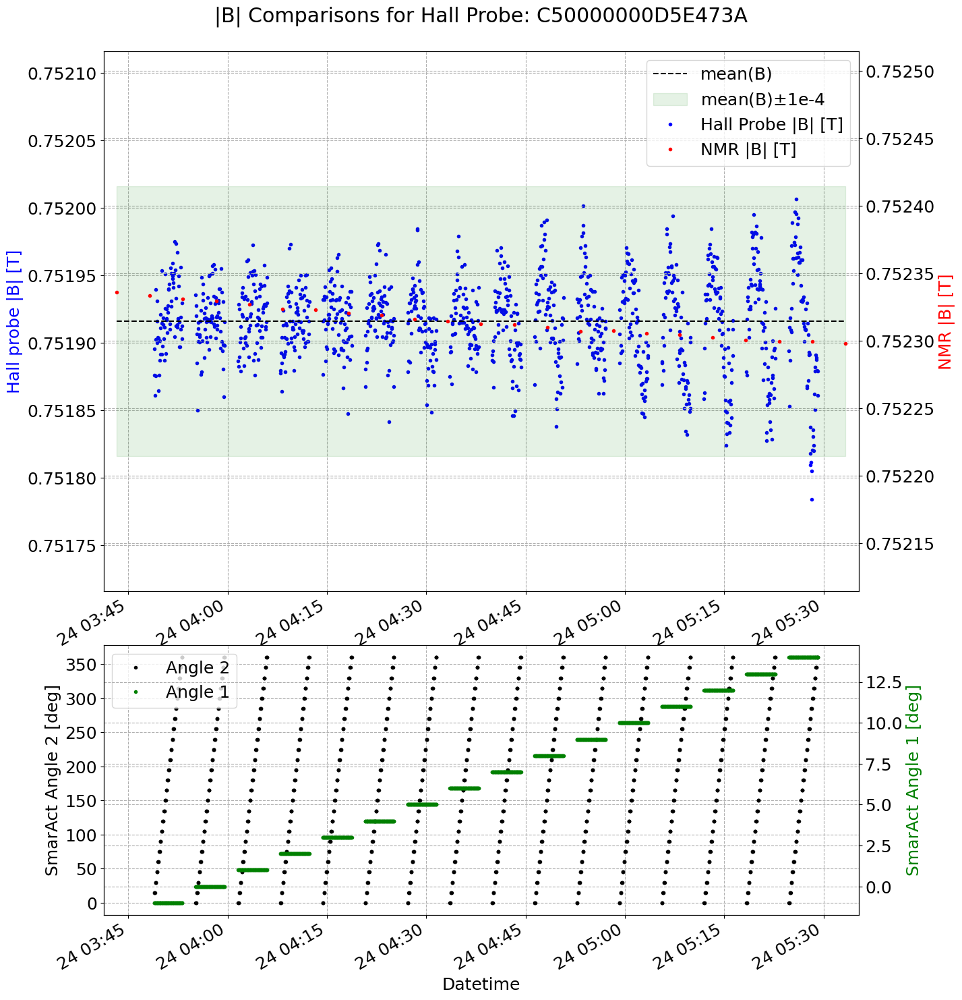

In [3572]:
'''
#t0_ = '01-09-23 11:50' # magnet on
#tf_ = '01-09-23 12:20' # coarse scan end
t0_ = '01-09-23 20:29' # finer scan start
#tf_ = '01-11-23 00:00' # PLACEHOLDER
##tf_ = '01-10-23 11:45:22' # magnet tripped during finer scan
tf_ = '01-10-23 11:45:10' # magnet tripped during finer scan
df_ = df.query(f"'{t0_}' <= Datetime <= '{tf_}'").copy()
# df_t_ = df_t.query(f"'{t0_}' <= Datetime <= '{tf_}'").copy()
df_t_ = df_temp.query(f"'{t0_}' <= Datetime <= '{tf_}'").copy()
'''

df_ = df.copy()
df_t_ = df_temp.copy()

fig = plt.figure(figsize=(14, 16))
##ax = plt.subplot(211)
ax = plt.axes([0.1, 0.4, 0.8, 0.5])
#ax2 = plt.subplot(212, sharex=ax)
ax2 = ax.twinx()
ax3 = plt.axes([0.1, 0.1, 0.8, 0.25])
##ax3 = plt.subplot(212, sharex=ax)
ax4 = ax3.twinx()
# mean lines
l1, = ax2.plot([df_t_.index.min(), df_t_.index.max()], 2*[df_t_['NMR [T]'].mean()], 'k--', label='mean(B)')
#ax.plot([df_t_.index.min(), df_t_.index.max()], 2*[df_t_['NMR [T]'].mean()], 'k--', label='mean(B)')
l2 = ax2.fill_between([df_t_.index.min(), df_t_.index.max()], df_t_['NMR [T]'].mean() - 1e-4, df_t_['NMR [T]'].mean() + 1e-4,
                        color='green', alpha=0.1, label=r'mean(B)$\pm$1e-4')
# main data
a3 = df_[f'{probe}_Cal_Bmag'].plot(ax=ax, color='blue', linestyle='None', marker='.', label='Hall Probe |B| [T]')
l3 = a3.get_legend_handles_labels()[0][-1]
# df_[f'{probe}_Raw_Bmag'].plot(ax=ax, color='blue')
a4 = df_t_['NMR [T]'].plot(ax=ax2, color='red', linestyle='None', marker='.', label='NMR |B| [T]')
l4 = a4.get_legend_handles_labels()[0][-1]
#df_['SmarAct_Meas_Angle_2_Centered'].plot(ax=ax3, color='black', linestyle='None', marker='.')
#df_['SmarAct_Meas_Angle_1_Centered'].plot(ax=ax4, color='green', linestyle='None', marker='.')
aa1 = df_['SmarAct_Meas_Angle_2'].plot(ax=ax3, color='black', linestyle='None', marker='.', label='Angle 2')
ll1 = aa1.get_legend_handles_labels()[0][-1]
aa2 = df_['SmarAct_Meas_Angle_1'].plot(ax=ax4, color='green', linestyle='None', marker='.', label='Angle 1')
ll2 = aa2.get_legend_handles_labels()[0][-1]
ax.set_ylabel(f'Hall probe |B| [T]')
ax.yaxis.label.set_color('blue')
ax2.set_ylabel(f'NMR |B| [T]')
ax2.yaxis.label.set_color('red')
#ax3.set_ylabel('SmarAct Angle 2 [Rad], centered')
#ax4.set_ylabel('SmarAct Angle 1 [Rad], centered')
ax3.set_ylabel('SmarAct Angle 2 [deg]')
ax4.set_ylabel('SmarAct Angle 1 [deg]')
ax3.yaxis.label.set_color('black')
ax4.yaxis.label.set_color('green')
ax.set_title(f"|B| Comparisons for Hall Probe: {probe}\n")
ax.set_xlim([df_t_.index.min() - timedelta(seconds=120), df_t_.index.max() + timedelta(seconds=120)])
ax3.set_xlim([df_t_.index.min() - timedelta(seconds=120), df_t_.index.max() + timedelta(seconds=120)])
ax.set_ylim([df_[f'{probe}_Cal_Bmag'].mean() - 2e-4, df_[f'{probe}_Cal_Bmag'].mean() + 2e-4])
ax2.set_ylim([df_t_['NMR [T]'].mean() - 2e-4, df_t_['NMR [T]'].mean() + 2e-4])
ls = [l1, l2, l3, l4]
lbs = [l.get_label() for l in ls]
ax2.legend(ls, lbs)
lls = [ll1, ll2]
llbs = [l.get_label() for l in lls]
#ax3.legend(lls, llbs).set_zorder(100)
ax3.legend(lls, llbs, loc='upper left').set_zorder(100)

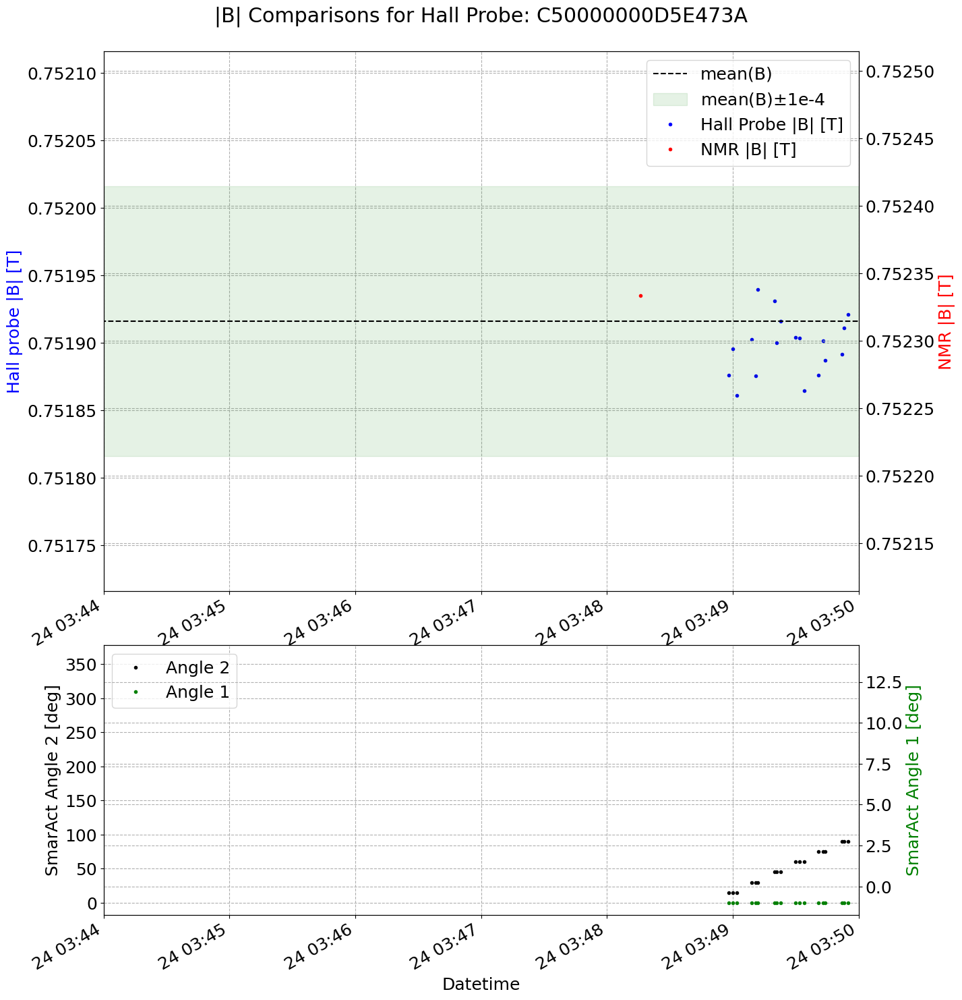

In [3573]:
# dissect a scan (update t0 tf if I use a different run
#t0_ = '04-17-25 11:13:15'
#tf_ = '04-17-25 11:20:15'
t0_dt = datetime.strptime(t0, '%m-%d-%y %H:%M')
# t0_ = t0_dt + timedelta(minutes=3)
t0_ = t0_dt + timedelta(minutes=4)
#t0_ = t0_dt + timedelta(minutes=7)
# t0_ = t0_dt + timedelta(minutes=12)
tf_ = t0_ + timedelta(minutes=6)
ax.set_xlim([t0_, tf_])
ax3.set_xlim([t0_, tf_])
fig

/home/ckampa/anaconda3/envs/mu2eBFit/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:981: UserWarning:

This axis already has a converter set and is updating to a potentially incompatible converter



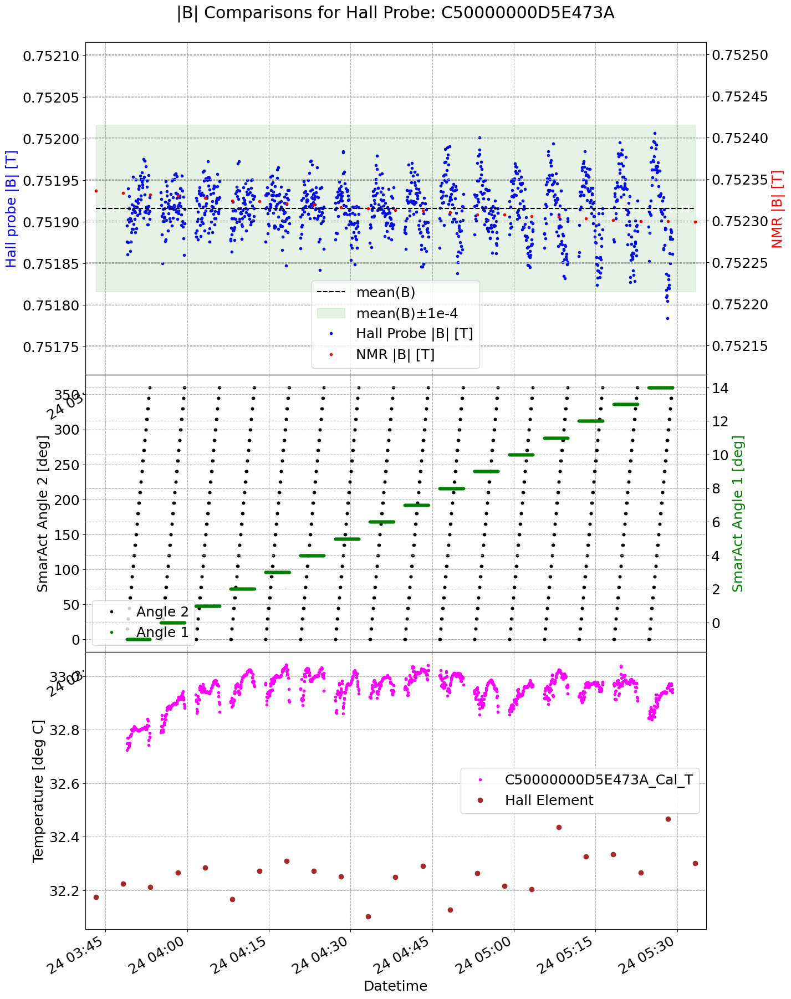

In [3574]:
# add temperature
'''
#t0_ = '01-09-23 11:50' # magnet on
#tf_ = '01-09-23 12:20' # coarse scan end
t0_ = '01-09-23 20:29' # finer scan start
#tf_ = '01-11-23 00:00' # PLACEHOLDER
##tf_ = '01-10-23 11:45:22' # magnet tripped during finer scan
tf_ = '01-10-23 11:45:10' # magnet tripped during finer scan
df_ = df.query(f"'{t0_}' <= Datetime <= '{tf_}'").copy()
# df_t_ = df_t.query(f"'{t0_}' <= Datetime <= '{tf_}'").copy()
df_t_ = df_temp.query(f"'{t0_}' <= Datetime <= '{tf_}'").copy()
'''

df_ = df.copy()
df_t_ = df_temp.copy()

#fig = plt.figure(figsize=(14, 16))
fig = plt.figure(figsize=(14, 20))
# original
# ax = plt.axes([0.1, 0.4, 0.8, 0.5])
# ax2 = ax.twinx()
# ax3 = plt.axes([0.1, 0.1, 0.8, 0.25])
# ax4 = ax3.twinx()
ax = plt.axes([0.1, 0.6, 0.8, 0.3])
ax2 = ax.twinx()
ax3 = plt.axes([0.1, 0.35, 0.8, 0.25])
ax4 = ax3.twinx()
ax5 = plt.axes([0.1, 0.1, 0.8, 0.25])
# mean lines
l1, = ax2.plot([df_t_.index.min(), df_t_.index.max()], 2*[df_t_['NMR [T]'].mean()], 'k--', label='mean(B)')
#ax.plot([df_t_.index.min(), df_t_.index.max()], 2*[df_t_['NMR [T]'].mean()], 'k--', label='mean(B)')
l2 = ax2.fill_between([df_t_.index.min(), df_t_.index.max()], df_t_['NMR [T]'].mean() - 1e-4, df_t_['NMR [T]'].mean() + 1e-4,
                        color='green', alpha=0.1, label=r'mean(B)$\pm$1e-4')
# main data
a3 = df_[f'{probe}_Cal_Bmag'].plot(ax=ax, color='blue', linestyle='None', marker='.', label='Hall Probe |B| [T]')
l3 = a3.get_legend_handles_labels()[0][-1]
# df_[f'{probe}_Raw_Bmag'].plot(ax=ax, color='blue')
a4 = df_t_['NMR [T]'].plot(ax=ax2, color='red', linestyle='None', marker='.', label='NMR |B| [T]')
l4 = a4.get_legend_handles_labels()[0][-1]
#df_['SmarAct_Meas_Angle_2_Centered'].plot(ax=ax3, color='black', linestyle='None', marker='.')
#df_['SmarAct_Meas_Angle_1_Centered'].plot(ax=ax4, color='green', linestyle='None', marker='.')
aa1 = df_['SmarAct_Meas_Angle_2'].plot(ax=ax3, color='black', linestyle='None', marker='.', label='Angle 2')
ll1 = aa1.get_legend_handles_labels()[0][-1]
aa2 = df_['SmarAct_Meas_Angle_1'].plot(ax=ax4, color='green', linestyle='None', marker='.', label='Angle 1')
ll2 = aa2.get_legend_handles_labels()[0][-1]
tt1 = df_[f'{probe}_Cal_T'].plot(ax=ax5, color='magenta', linestyle='None', marker='.', label=f'{probe}_Cal_T')
lll1 = tt1.get_legend_handles_labels()[0][-1]
#tt2 = df_t_[f'Parameter HVAC sensor'].plot(ax=ax5, color='cyan', linestyle='None', marker='.', 
#                                           markersize=12, label=f'Parameter HVAC sensor')
#lll2 = tt2.get_legend_handles_labels()[0][-1]
tt3 = df_t_[f'Hall Element'].plot(ax=ax5, color='brown', linestyle='None', marker='.', 
                                           markersize=12, label=f'Hall Element')
lll3 = tt3.get_legend_handles_labels()[0][-1]

ax.set_ylabel(f'Hall probe |B| [T]')
ax.yaxis.label.set_color('blue')
ax2.set_ylabel(f'NMR |B| [T]')
ax2.yaxis.label.set_color('red')
#ax3.set_ylabel('SmarAct Angle 2 [Rad], centered')
#ax4.set_ylabel('SmarAct Angle 1 [Rad], centered')
ax3.set_ylabel('SmarAct Angle 2 [deg]')
ax4.set_ylabel('SmarAct Angle 1 [deg]')
ax3.yaxis.label.set_color('black')
ax4.yaxis.label.set_color('green')
#ax5.set_ylabel(f'{probe}_Cal_T [deg C]')
ax5.set_ylabel(f'Temperature [deg C]')
ax.set_title(f"|B| Comparisons for Hall Probe: {probe}\n")
ax.set_xlim([df_t_.index.min() - timedelta(seconds=120), df_t_.index.max() + timedelta(seconds=120)])
ax3.set_xlim([df_t_.index.min() - timedelta(seconds=120), df_t_.index.max() + timedelta(seconds=120)])
ax5.set_xlim([df_t_.index.min() - timedelta(seconds=120), df_t_.index.max() + timedelta(seconds=120)])
ax.set_ylim([df_[f'{probe}_Cal_Bmag'].mean() - 2e-4, df_[f'{probe}_Cal_Bmag'].mean() + 2e-4])
ax2.set_ylim([df_t_['NMR [T]'].mean() - 2e-4, df_t_['NMR [T]'].mean() + 2e-4])
ls = [l1, l2, l3, l4]
lbs = [l.get_label() for l in ls]
ax2.legend(ls, lbs)
lls = [ll1, ll2]
llbs = [l.get_label() for l in lls]
ax3.legend(lls, llbs).set_zorder(100)
#llls = [lll1, lll2, lll3]
llls = [lll1, lll3]
lllbs = [l.get_label() for l in llls]
ax5.legend(llls, lllbs).set_zorder(100);

In [2944]:
lll1.get_label()

'8E0000000D51483A_Cal_T'

In [2945]:
df_t_.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Coil 1', 'Coil 2',
       'LCW in Coil1', 'LCW out Coil 1', 'LCW in Coil 2', 'LCW out Coil 2',
       'Yoke (near pole)', 'Hall Element', 'Floor', 'Roof',
       'Yoke (center magnet)', 'Parameter HVAC sensor', 'Chamber Wall CH13',
       'Chamber Wall CH14', 'Chamber Wall CH15', 'Chamber Wall CH16',
       'Chamber Wall CH17', 'Chamber Wall CH18', 'Chamber Wall CH19',
       'Chamber Wall CH20', 'Desk Ambient', 'Outlet Strip Ambient',
       'Top fo Orange PS Ambient', 'Spare Ambient on desk',
       'TrippLite Ambient 3ft high', 'TrippLite Ambient Floor', 'PS internal',
       'PS Vent1', 'PS Vent2', 'TrippLite HVAC supply',
       'Tripplite HVAC exhaust', 'NaN (NWC-R)', 'EvapCoil (NWC)',
       'Barrel/Reservoir (FNAL)', 'Return PS (FNAL)', 'Return Magnet (NWC-R)',
       'Chiller Exhaust (NW)', 'Supply Magnet (NWC-S)', 'NaN (NWC-S)',
       'Supply PS (FNAL)', 'NMR [T]', 'NMR [FFT]', 'seconds_delta',
       'hours_delta',

In [2946]:
datetime.strptime(t0, '%m-%d-%y %H:%M')

datetime.datetime(2025, 5, 14, 18, 25)

In [2947]:
df_temp.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Coil 1', 'Coil 2',
       'LCW in Coil1', 'LCW out Coil 1', 'LCW in Coil 2', 'LCW out Coil 2',
       'Yoke (near pole)', 'Hall Element', 'Floor', 'Roof',
       'Yoke (center magnet)', 'Parameter HVAC sensor', 'Chamber Wall CH13',
       'Chamber Wall CH14', 'Chamber Wall CH15', 'Chamber Wall CH16',
       'Chamber Wall CH17', 'Chamber Wall CH18', 'Chamber Wall CH19',
       'Chamber Wall CH20', 'Desk Ambient', 'Outlet Strip Ambient',
       'Top fo Orange PS Ambient', 'Spare Ambient on desk',
       'TrippLite Ambient 3ft high', 'TrippLite Ambient Floor', 'PS internal',
       'PS Vent1', 'PS Vent2', 'TrippLite HVAC supply',
       'Tripplite HVAC exhaust', 'NaN (NWC-R)', 'EvapCoil (NWC)',
       'Barrel/Reservoir (FNAL)', 'Return PS (FNAL)', 'Return Magnet (NWC-R)',
       'Chiller Exhaust (NW)', 'Supply Magnet (NWC-S)', 'NaN (NWC-S)',
       'Supply PS (FNAL)', 'NMR [T]', 'NMR [FFT]', 'seconds_delta',
       'hours_delta',

<Axes: xlabel='Datetime'>

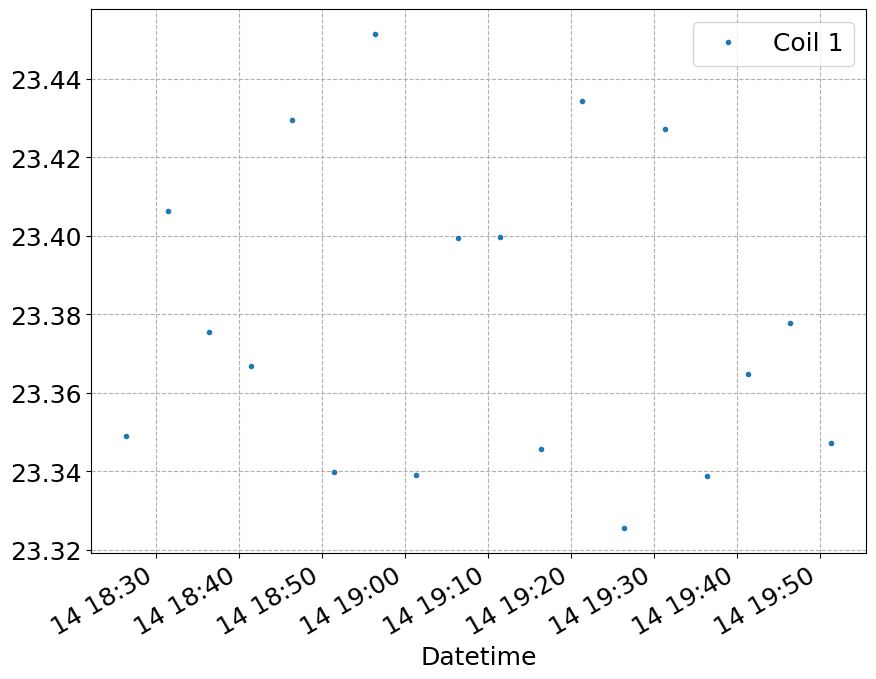

In [2948]:
df_temp.plot(y='Coil 1', use_index=True, marker='.', linestyle='')

In [2949]:
# coil temperatures

In [2950]:
df_temp0.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Coil 1', 'Coil 2',
       'LCW in Coil1', 'LCW out Coil 1', 'LCW in Coil 2', 'LCW out Coil 2',
       'Yoke (near pole)', 'Hall Element', 'Floor', 'Roof',
       'Yoke (center magnet)', 'Parameter HVAC sensor', 'Chamber Wall CH13',
       'Chamber Wall CH14', 'Chamber Wall CH15', 'Chamber Wall CH16',
       'Chamber Wall CH17', 'Chamber Wall CH18', 'Chamber Wall CH19',
       'Chamber Wall CH20', 'Desk Ambient', 'Outlet Strip Ambient',
       'Top fo Orange PS Ambient', 'Spare Ambient on desk',
       'TrippLite Ambient 3ft high', 'TrippLite Ambient Floor', 'PS internal',
       'PS Vent1', 'PS Vent2', 'TrippLite HVAC supply',
       'Tripplite HVAC exhaust', 'NaN (NWC-R)', 'EvapCoil (NWC)',
       'Barrel/Reservoir (FNAL)', 'Return PS (FNAL)', 'Return Magnet (NWC-R)',
       'Chiller Exhaust (NW)', 'Supply Magnet (NWC-S)', 'NaN (NWC-S)',
       'Supply PS (FNAL)', 'NMR [T]', 'NMR [FFT]', 'seconds_delta',
       'hours_delta',

Text(0.5, 1.0, '2025-05-22 160240slow.txt')

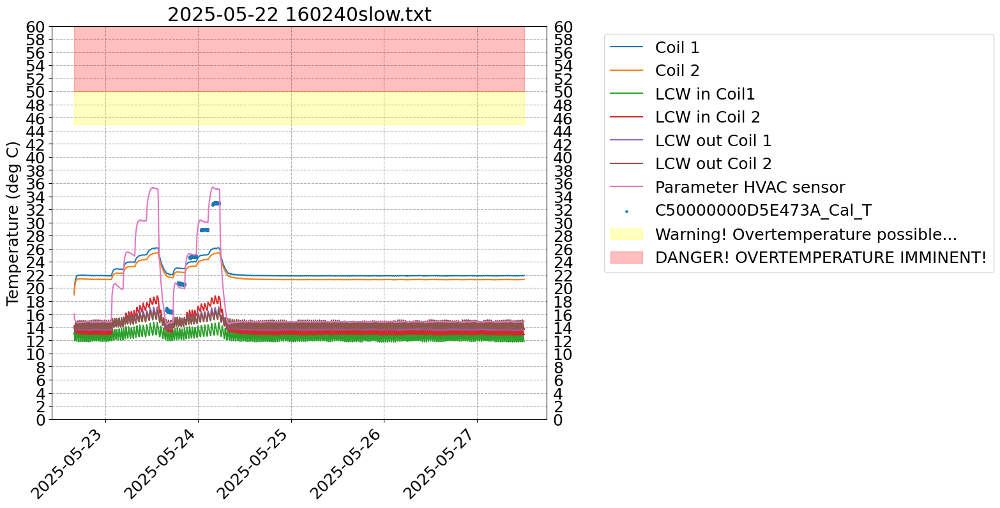

In [3455]:
# temps = ['Coil 1', 'Coil 2']
temps = ['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2']
fig, ax = plt.subplots()
for t in temps:
    vals = df_temp0.loc[:, t]
    ax.plot(df_temp0.index, vals, label=t)

ax.plot(df_temp0.index, df_temp0['Parameter HVAC sensor'], label='Parameter HVAC sensor')
# Hall probe temp
# FIXME! Only use times with NMR
ax.scatter(df0.index, df0[f'{probe}_Cal_T'], label=f'{probe}_Cal_T', s=5)

ax.fill_between([df_temp0.index[0], df_temp0.index[-1]], 45, 50, color='yellow', alpha=0.25, label='Warning! Overtemperature possible...')
ax.fill_between([df_temp0.index[0], df_temp0.index[-1]], 50, 60, color='red', alpha=0.25, label='DANGER! OVERTEMPERATURE IMMINENT!')

ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1.0))
#ax.set_ylim([10.0, 40.0])
#ax.set_ylim([10.0, 60.0])
ax.set_ylim([0.0, 60.0])
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')
#ax.set_yticks(np.arange(10, 42, 2))
###ax.set_yticks(np.arange(10, 62, 2))
ax.set_yticks(np.arange(0, 62, 2))
ax.tick_params(labelleft=True, labelright=True)
ax.set_ylabel("Temperature (deg C)")
ax.set_title(slowfile.split('/')[-1])

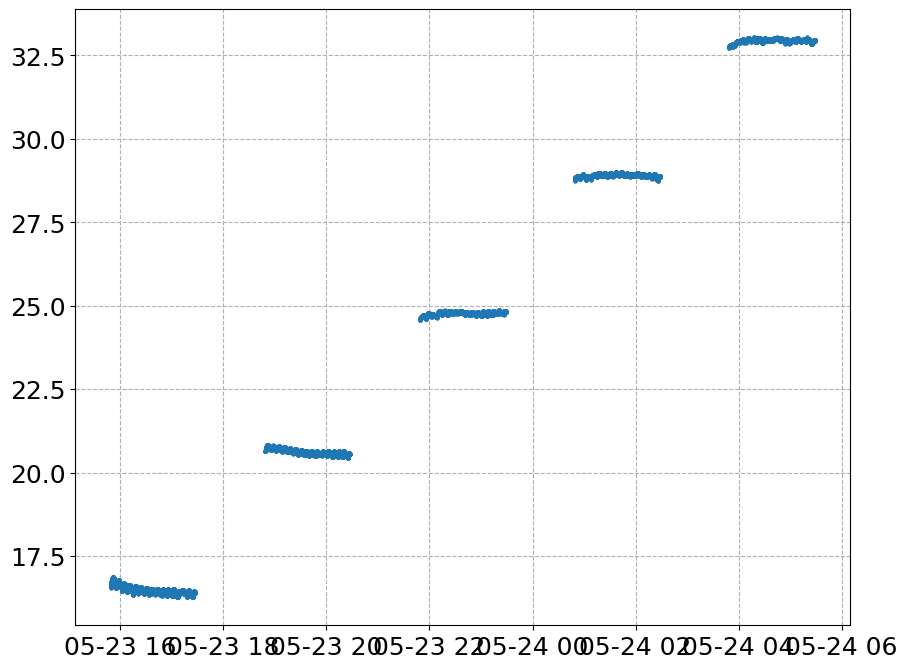

In [3456]:
fig, ax = plt.subplots()

ax.scatter(df0.index, df0[f'{probe}_Cal_T'], label=f'{probe}_Cal_T', s=5)

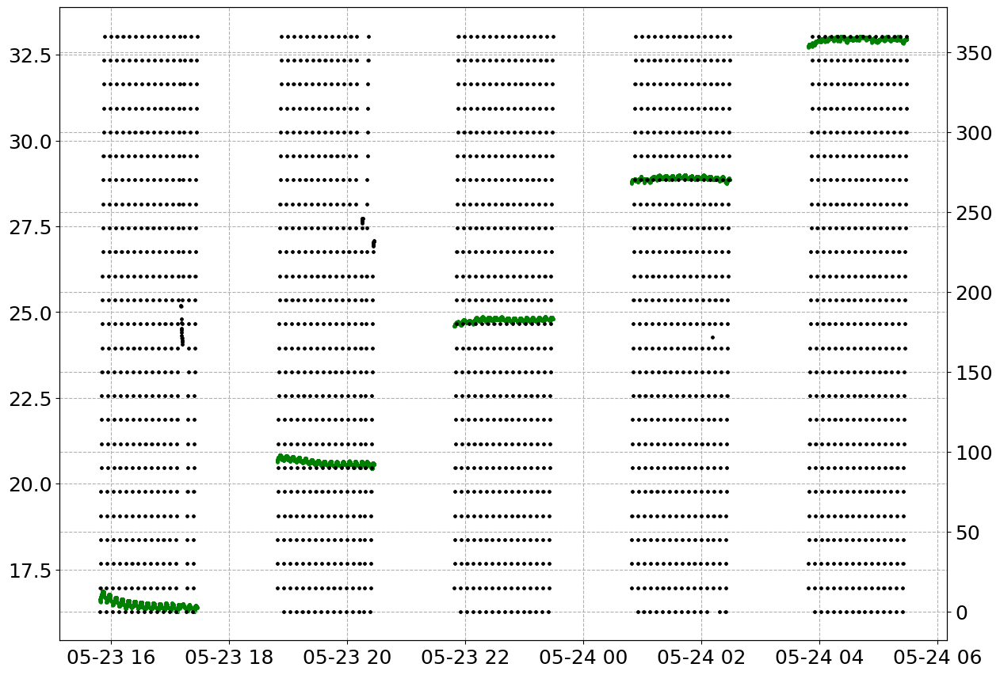

In [3457]:
fig = plt.figure(figsize=(14, 16))
##ax = plt.subplot(211)
ax = plt.axes([0.1, 0.4, 0.8, 0.5])
#ax2 = plt.subplot(212, sharex=ax)
ax2 = ax.twinx()

ax.scatter(df0.index, df0[f'{probe}_Cal_T'], c='green', s=5, label=f'{probe}_Cal_T')
ax2.scatter(df0.index, df0['SmarAct_Meas_Angle_2'], s=4, c='black', label='SmarAct_Meas_Angle_2')

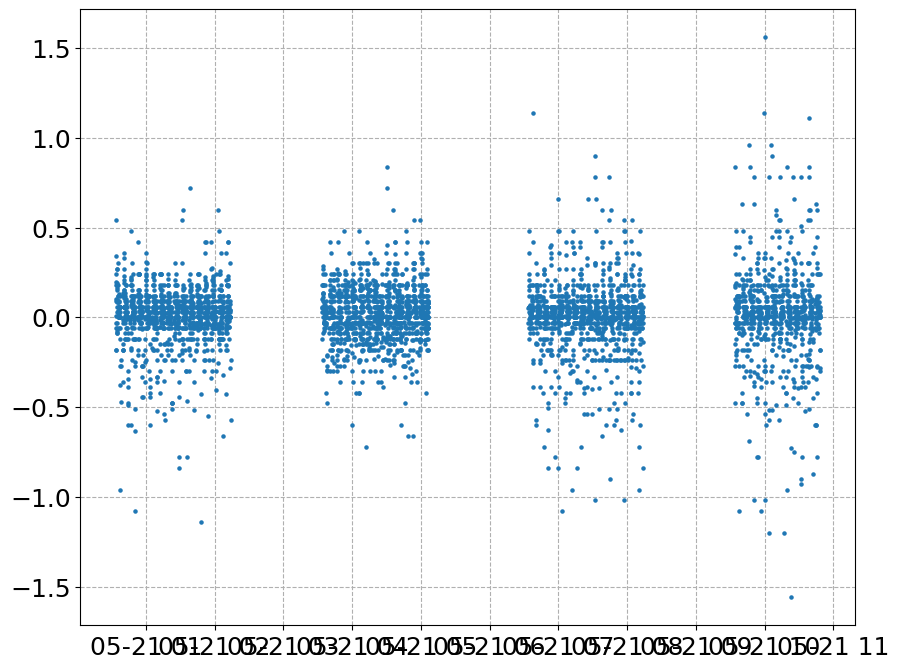

In [3138]:
fig, ax = plt.subplots()

ax.scatter(df0.index[1:], np.diff(df0[f'{probe}_Cal_T']) / np.diff((df0.index - df0.index[0]).total_seconds()/60.), label=f'{probe}_Cal_T', s=5)

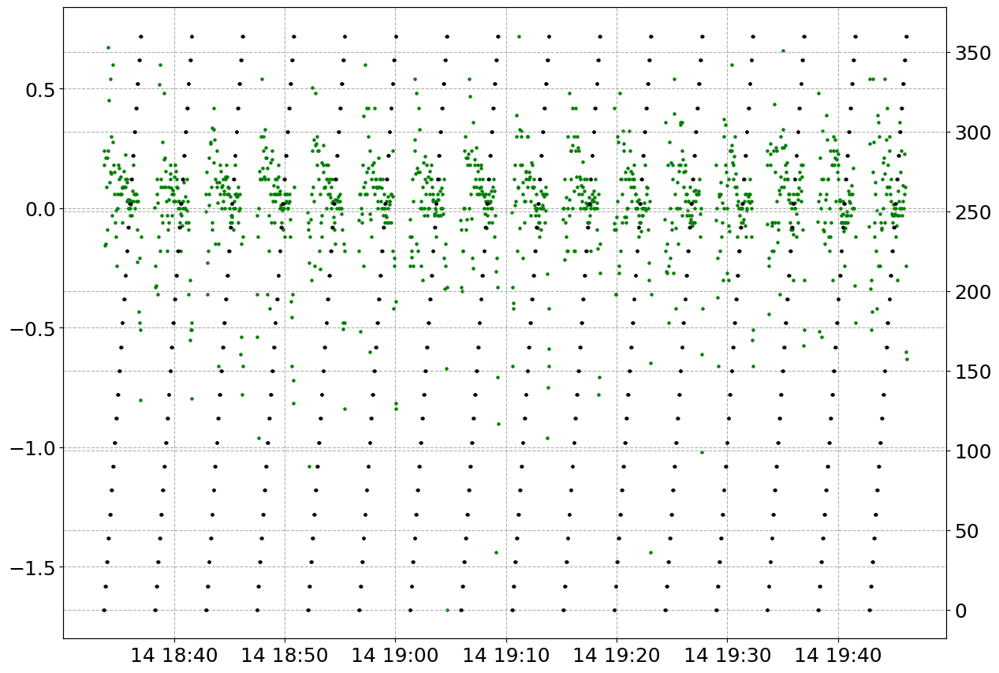

In [2955]:
fig = plt.figure(figsize=(14, 16))
##ax = plt.subplot(211)
ax = plt.axes([0.1, 0.4, 0.8, 0.5])
#ax2 = plt.subplot(212, sharex=ax)
ax2 = ax.twinx()

#ax.scatter(df0.index, df0[f'{probe}_Cal_T'], c='green', s=5, label=f'{probe}_Cal_T')
ax.scatter(df0.index[1:], np.diff(df0[f'{probe}_Cal_T']) / np.diff((df0.index - df0.index[0]).total_seconds()/60.),
           c='green', label=f'{probe}_Cal_T', s=5)
ax2.scatter(df0.index, df0['SmarAct_Meas_Angle_2'], s=4, c='black', label='SmarAct_Meas_Angle_2')

Text(0.5, 1.0, '2025-05-09 122556slow.txt')

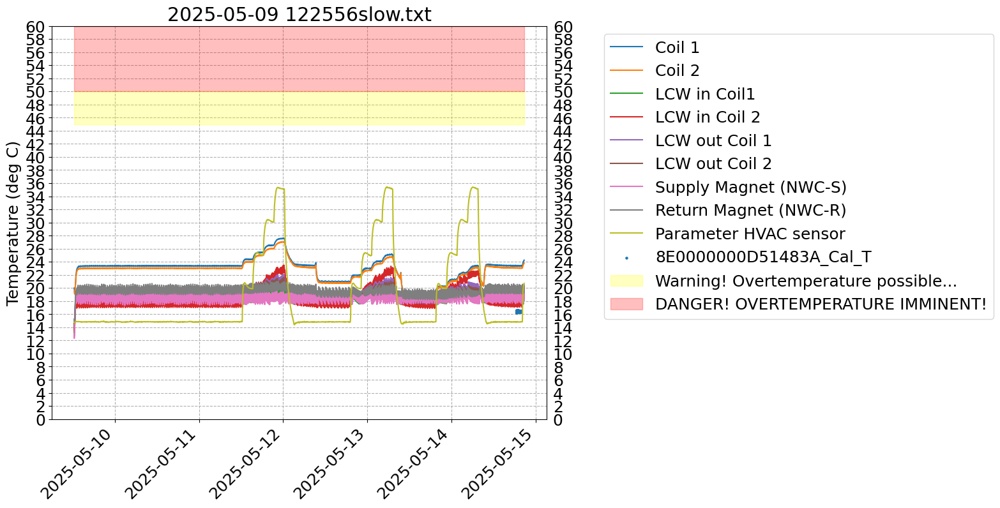

In [2956]:
# with NU chiller
# temps = ['Coil 1', 'Coil 2']
temps = ['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2',
         'Supply Magnet (NWC-S)', 'Return Magnet (NWC-R)']
fig, ax = plt.subplots()
for t in temps:
    vals = df_temp0.loc[:, t]
    ax.plot(df_temp0.index, vals, label=t)

ax.plot(df_temp0.index, df_temp0['Parameter HVAC sensor'], label='Parameter HVAC sensor')
# Hall probe temp
# FIXME! Only use times with NMR
ax.scatter(df0.index, df0[f'{probe}_Cal_T'], label=f'{probe}_Cal_T', s=5)

ax.fill_between([df_temp0.index[0], df_temp0.index[-1]], 45, 50, color='yellow', alpha=0.25, label='Warning! Overtemperature possible...')
ax.fill_between([df_temp0.index[0], df_temp0.index[-1]], 50, 60, color='red', alpha=0.25, label='DANGER! OVERTEMPERATURE IMMINENT!')

ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1.0))
#ax.set_ylim([10.0, 40.0])
#ax.set_ylim([10.0, 60.0])
ax.set_ylim([0.0, 60.0])
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')
#ax.set_yticks(np.arange(10, 42, 2))
# ax.set_yticks(np.arange(10, 62, 2))
ax.set_yticks(np.arange(0, 62, 2))
ax.tick_params(labelleft=True, labelright=True)
ax.set_ylabel("Temperature (deg C)")
ax.set_title(slowfile.split('/')[-1])

In [2957]:
df_temp0['Coil 2']

Datetime
2025-05-09 12:25:57    19.487619
2025-05-09 12:26:20    19.463293
2025-05-09 12:31:20    19.080570
2025-05-09 12:36:20    19.168600
2025-05-09 12:41:20    19.597002
                         ...    
2025-05-14 20:26:23    23.365816
2025-05-14 20:31:22    23.599836
2025-05-14 20:36:22    23.608271
2025-05-14 20:41:23    23.719458
2025-05-14 20:46:22    23.801987
Name: Coil 2, Length: 1542, dtype: float64

In [2958]:
datetime.now() - timedelta(hours=2)

datetime.datetime(2025, 5, 14, 18, 52, 17, 434423)

Text(0.5, 1.0, '2025-05-09 122556slow.txt')

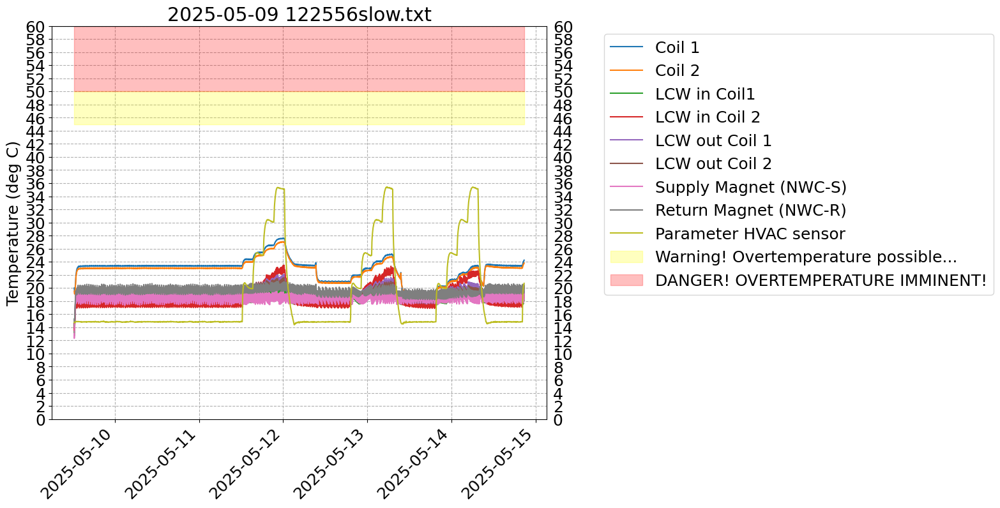

In [2959]:
# last few hours only
# with NU chiller
####
# delta time
# dt = timedelta(hours=2.0)
# now = datetime.now()
# cut_time = now - dt
####
# specific time
cut_time = '2025-04-28 08:00'
####
df_temp0_ = df_temp0.query(f'Datetime >= "{cut_time}"')
# temps = ['Coil 1', 'Coil 2']
temps = ['Coil 1', 'Coil 2', 'LCW in Coil1', 'LCW in Coil 2', 'LCW out Coil 1', 'LCW out Coil 2',
         'Supply Magnet (NWC-S)', 'Return Magnet (NWC-R)']
fig, ax = plt.subplots()
for t in temps:
    vals = df_temp0_.loc[:, t]
    ax.plot(df_temp0_.index, vals, label=t)

ax.plot(df_temp0_.index, df_temp0_['Parameter HVAC sensor'], label='Parameter HVAC sensor')
# Hall probe temp
# FIXME! Only use times with NMR
##ax.scatter(df0.index, df0[f'{probe}_Cal_T'], label=f'{probe}_Cal_T', s=5)

ax.fill_between([df_temp0_.index[0], df_temp0_.index[-1]], 45, 50, color='yellow', alpha=0.25, label='Warning! Overtemperature possible...')
ax.fill_between([df_temp0_.index[0], df_temp0_.index[-1]], 50, 60, color='red', alpha=0.25, label='DANGER! OVERTEMPERATURE IMMINENT!')

ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1.0))
#ax.set_ylim([10.0, 40.0])
#ax.set_ylim([10.0, 60.0])
ax.set_ylim([0.0, 60.0])
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')
#ax.set_yticks(np.arange(10, 42, 2))
# ax.set_yticks(np.arange(10, 62, 2))
ax.set_yticks(np.arange(0, 62, 2))
ax.tick_params(labelleft=True, labelright=True)
ax.set_ylabel("Temperature (deg C)")
ax.set_title(slowfile.split('/')[-1])

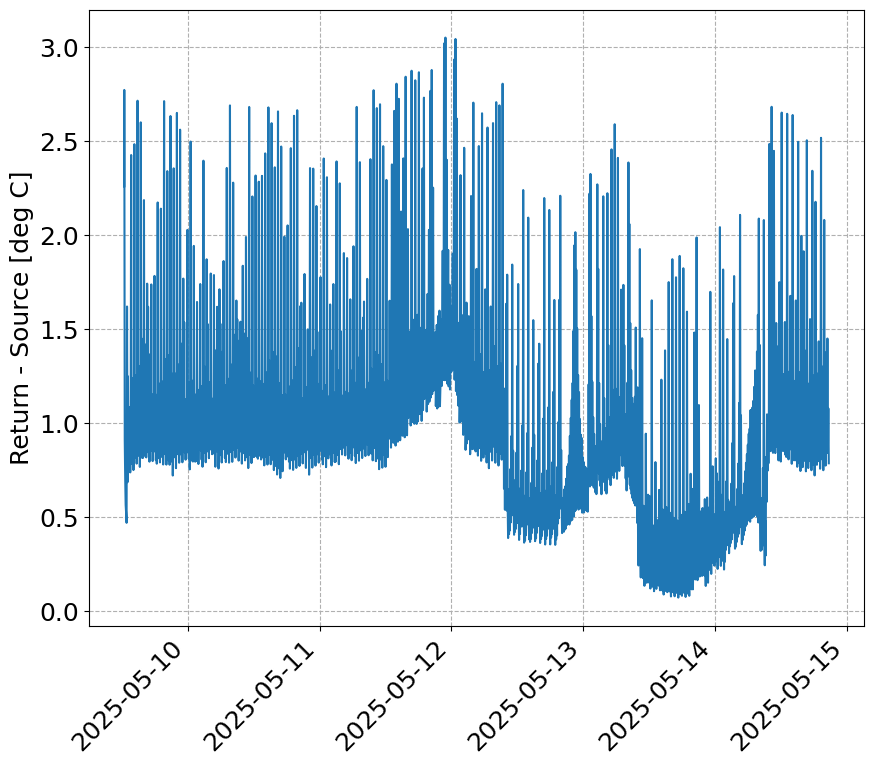

In [2960]:
# delta temp, chiller side
fig, ax = plt.subplots()

ax.plot(df_temp0.index, df_temp0['Return Magnet (NWC-R)'] - df_temp0['Supply Magnet (NWC-S)'], label='NWU Chiller')

ax.set_ylabel('Return - Source [deg C]')
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')

In [2961]:
np.mean(df_temp0['Return Magnet (NWC-R)'] - df_temp0['Supply Magnet (NWC-S)'])

1.0049078708819714

In [2962]:
# recent mean
# i = 10 # 50 minutes
i = 5 # 25 minutes
np.mean(df_temp0['Return Magnet (NWC-R)'].tail(i) - df_temp0['Supply Magnet (NWC-S)'].tail(i))

1.013031799999999

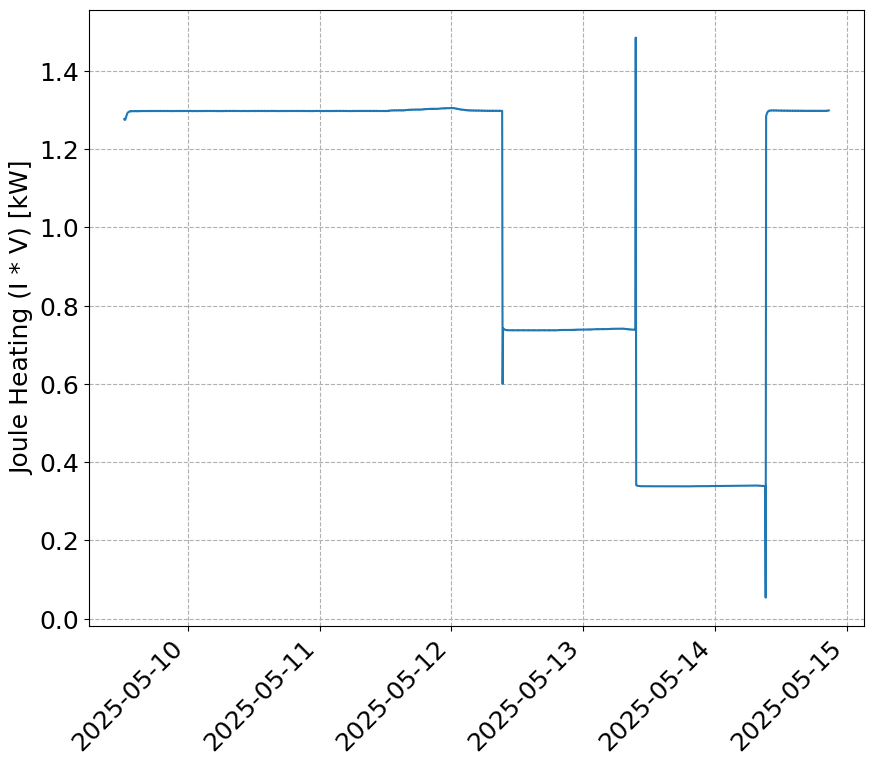

In [2963]:
## magnet power
I = df_temp0['Magnet Current [A]'].values
V = df_temp0['Magnet Voltage [V]'].values
P = I * V
P_coil_approx = P / 2.

fig, ax = plt.subplots()

ax.plot(df_temp0.index, P / 1000.)

ax.set_ylabel('Joule Heating (I * V) [kW]')
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')

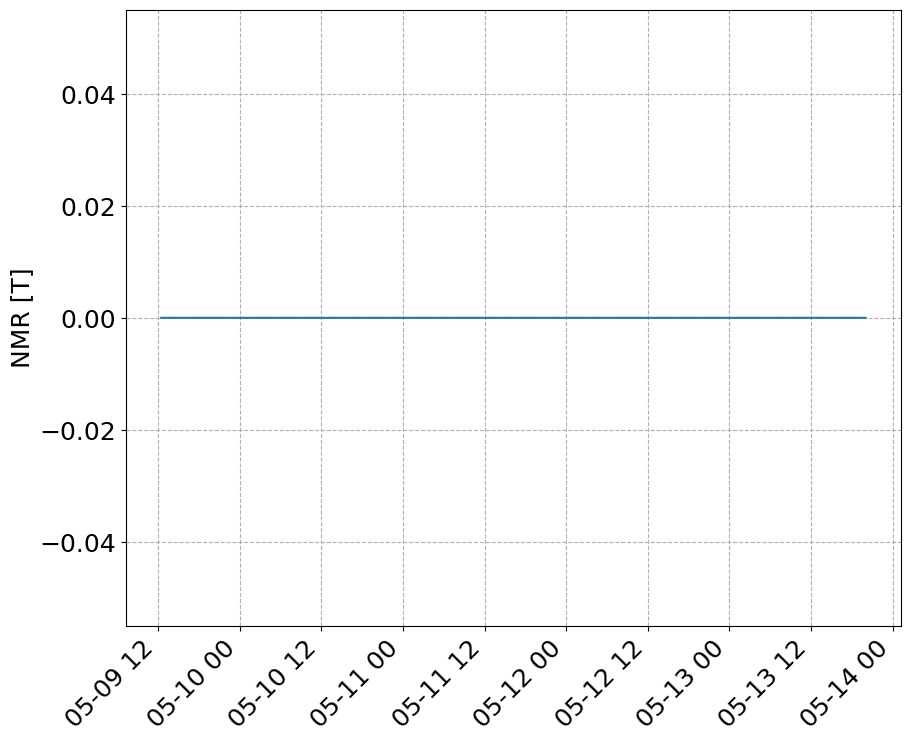

In [2909]:
# NMR
# delta temp, chiller side
####
# delta time
# dt = timedelta(hours=2.0)
# now = datetime.now()
# cut_time = now - dt
####
# specific time
#cut_time = '2025-04-28 09:05'
cut_time = '2020-01-01 00:00'
####
df_temp0_ = df_temp0.query(f'Datetime >= "{cut_time}"')
fig, ax = plt.subplots()

ax.plot(df_temp0_.index, df_temp0_['NMR [T]'], label='NMR')

ax.set_ylabel('NMR [T]')
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')

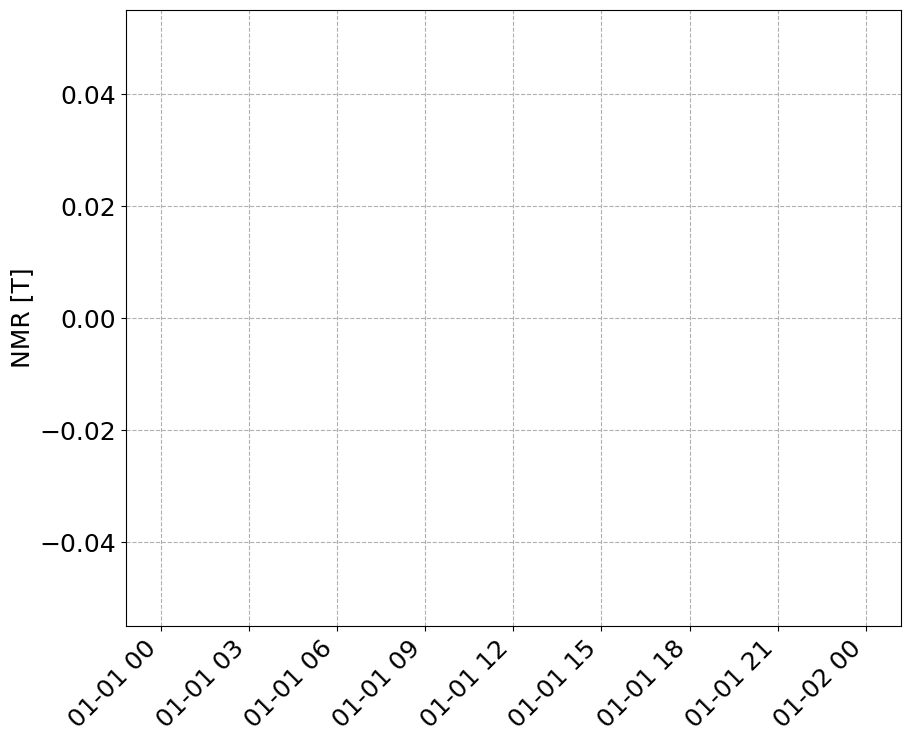

In [2910]:
# NMR
# delta temp, chiller side
####
# delta time
# dt = timedelta(hours=2.0)
# now = datetime.now()
# cut_time = now - dt
####
# specific time
#cut_time = '2025-04-28 09:05'
####
#df_temp0_ = df_temp0.query(f'Datetime >= "{cut_time}"')
# df_temp0_ = df_temp0.query(f'`NMR [T]` >= 0.2')
df_temp0_ = df_temp0.query(f'(`NMR [T]` >= 0.2) & (`NMR [T]` <= 0.78)')
fig, ax = plt.subplots()

#ax.plot(df_temp0_.index, df_temp0_['NMR [T]'], label='NMR')
ax.scatter(df_temp0_.index, df_temp0_['NMR [T]'], s=2, label='NMR')

ax.set_ylabel('NMR [T]')
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')

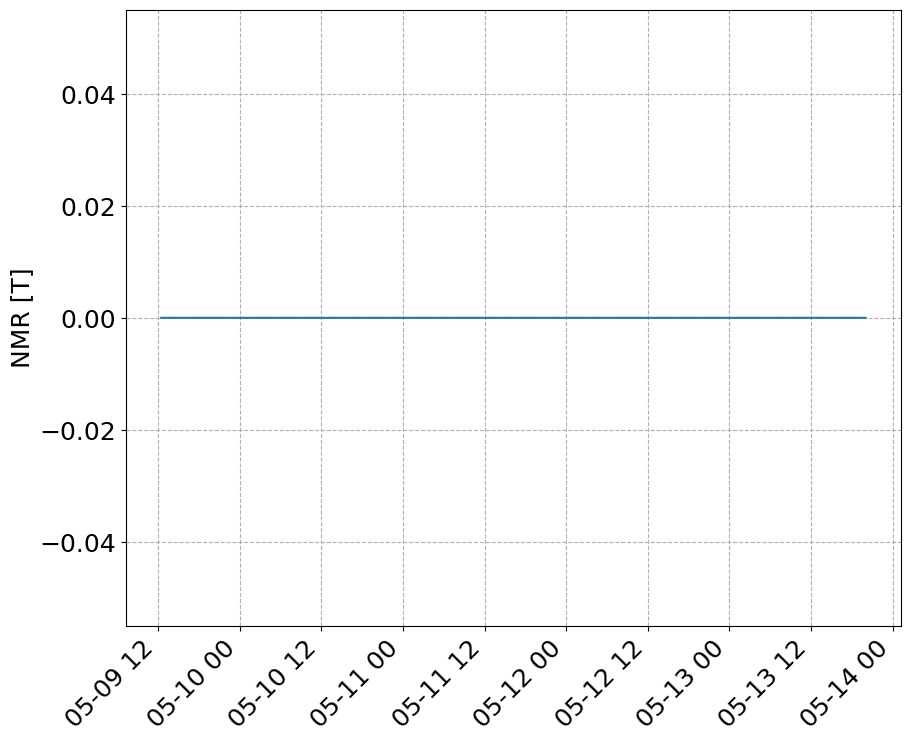

In [2911]:
# NMR
# delta temp, chiller side
fig, ax = plt.subplots()

ax.plot(df_temp0.index, df_temp0['NMR [T]'], label='NMR')

ax.set_ylabel('NMR [T]')
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')

In [2912]:
V

array([12.08716667, 12.08491333, 12.06418167, ...,  6.21934   ,
        6.21579   ,  6.22050833])

In [2913]:
df_temp0[['NMR [T]', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Hall Element']].tail(20)

,NMR [T],Magnet Current [A],Magnet Voltage [V],Hall Element
Datetime,,,,
2025-05-13 18:26:22,0.0,54.417034,6.215522,15.937120
2025-05-13 18:31:22,0.0,54.416705,6.217120,15.936061
2025-05-13 18:36:22,0.0,54.416915,6.213333,15.919586
2025-05-13 18:41:22,0.0,54.417006,6.217410,15.958970
2025-05-13 18:46:22,0.0,54.416983,6.214872,15.891991
2025-05-13 18:51:22,0.0,54.417000,6.214075,15.921959
2025-05-13 18:56:22,0.0,54.416966,6.219603,16.002806
2025-05-13 19:01:22,0.0,54.417062,6.213542,15.915173
2025-05-13 19:06:22,0.0,54.417108,6.215328,15.960617


In [2914]:
df_temp0[['NMR [T]', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Hall Element']].tail(20).describe()

,NMR [T],Magnet Current [A],Magnet Voltage [V],Hall Element
count,20.0,20.000000,20.000000,20.000000
mean,0.0,54.417091,6.216091,16.671793
std,0.0,0.000144,0.002289,1.363655
min,0.0,54.416705,6.213255,15.891991
25%,0.0,54.417004,6.214001,15.921160
50%,0.0,54.417085,6.215656,15.948045
75%,0.0,54.417210,6.217348,16.373124
max,0.0,54.417295,6.220508,19.773739


In [2783]:
df_temp0['Parameter HVAC sensor'].mean()

21.113920503585344

In [2784]:
df_temp0.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Coil 1', 'Coil 2',
       'LCW in Coil1', 'LCW out Coil 1', 'LCW in Coil 2', 'LCW out Coil 2',
       'Yoke (near pole)', 'Hall Element', 'Floor', 'Roof',
       'Yoke (center magnet)', 'Parameter HVAC sensor', 'Chamber Wall CH13',
       'Chamber Wall CH14', 'Chamber Wall CH15', 'Chamber Wall CH16',
       'Chamber Wall CH17', 'Chamber Wall CH18', 'Chamber Wall CH19',
       'Chamber Wall CH20', 'Desk Ambient', 'Outlet Strip Ambient',
       'Top fo Orange PS Ambient', 'Spare Ambient on desk',
       'TrippLite Ambient 3ft high', 'TrippLite Ambient Floor', 'PS internal',
       'PS Vent1', 'PS Vent2', 'TrippLite HVAC supply',
       'Tripplite HVAC exhaust', 'NaN (NWC-R)', 'EvapCoil (NWC)',
       'Barrel/Reservoir (FNAL)', 'Return PS (FNAL)', 'Return Magnet (NWC-R)',
       'Chiller Exhaust (NW)', 'Supply Magnet (NWC-S)', 'NaN (NWC-S)',
       'Supply PS (FNAL)', 'NMR [T]', 'NMR [FFT]', 'seconds_delta',
       'hours_delta',

In [2785]:
df0['8E0000000D51483A_Cal_T']

Datetime
2025-05-06 20:38:00    15.813
2025-05-06 20:38:02    15.811
2025-05-06 20:38:04    15.809
2025-05-06 20:38:09    15.797
2025-05-06 20:38:10    15.795
                        ...  
2025-05-07 09:50:49    33.044
2025-05-07 09:50:50    33.037
2025-05-07 09:50:55    33.001
2025-05-07 09:50:57    33.014
2025-05-07 09:50:59    33.005
Name: 8E0000000D51483A_Cal_T, Length: 5988, dtype: float64

In [2786]:
df0.index

DatetimeIndex(['2025-05-06 20:38:00', '2025-05-06 20:38:02',
               '2025-05-06 20:38:04', '2025-05-06 20:38:09',
               '2025-05-06 20:38:10', '2025-05-06 20:38:12',
               '2025-05-06 20:38:17', '2025-05-06 20:38:19',
               '2025-05-06 20:38:20', '2025-05-06 20:38:25',
               ...
               '2025-05-07 09:50:34', '2025-05-07 09:50:39',
               '2025-05-07 09:50:40', '2025-05-07 09:50:42',
               '2025-05-07 09:50:47', '2025-05-07 09:50:49',
               '2025-05-07 09:50:50', '2025-05-07 09:50:55',
               '2025-05-07 09:50:57', '2025-05-07 09:50:59'],
              dtype='datetime64[ns]', name='Datetime', length=5988, freq=None)

In [2787]:
t0

'05-07-25 08:25'

In [2788]:
datetime.strptime(

SyntaxError: incomplete input (2167977234.py, line 1)

In [ ]:
timedelta(

In [81]:
l3.get_legend_handles_labels()[0][0]

AttributeError: 'Line2D' object has no attribute 'get_legend_handles_labels'

In [32]:
(df_[f'{probe}_Cal_Bmag'].mean() - df_t_['NMR [T]'].mean())

-0.00037087526039814023

In [33]:
(df_[f'{probe}_Cal_Bmag'].mean() - df_t_['NMR [T]'].mean()) / df_t_['NMR [T]'].mean()

-0.0004936200505904199

In [ ]:
df_.tail()

In [ ]:
temps_list = list(df_temp.columns)
[temps_list.remove(i) for i in ['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'NMR [T]', 'NMR [FFT]', 'seconds_delta', 'hours_delta', 'days_delta']]

In [ ]:
#temps_list

In [ ]:
len(temps_list)

In [ ]:
fig, ax = plt.subplots(figsize=(18, 8))

for c in temps_list[:20]:
    ax.plot(df_temp.index, df_temp[c], label=c)
    
ax.set_xlabel('Datetime')
ax.set_ylabel('Temp [deg C]')
ax.legend(ncol=3, bbox_to_anchor=(1., 1.), loc='upper left');

In [ ]:
fig, ax = plt.subplots(figsize=(18, 8))

for c in temps_list[20:]:
    ax.plot(df_temp.index, df_temp[c], label=c)
    
ax.set_xlabel('Datetime')
ax.set_ylabel('Temp [deg C]')
ax.legend(ncol=3, bbox_to_anchor=(1., 1.), loc='upper left');

In [ ]:
#temps_list

In [ ]:
# only in the chamber
temps_ch = [a for a in df.columns if ("CH" in a) and int(a[-2:])<21]# or "HVAC" in a]
temps_ch.append("Hall Element")
temps_ch.append("Floor")
temps_ch.append("Roof")
temps_ch.append("Yoke (center magnet)")
temps_ch.append("Yoke (near pole)")

In [ ]:
fig, ax = plt.subplots(figsize=(18, 8))

for c in temps_ch:
    ax.plot(df_temp.index, df_temp[c], label=c)

ax.plot(df.index, df[f'{probe}_Cal_T'], label=f'{probe}')
    
ax.set_xlabel('Datetime')
ax.set_ylabel('Temp [deg C]')
ax.legend(ncol=1, bbox_to_anchor=(1., 1.), loc='upper left');

In [ ]:
for a in ['1', '2']:
    fig, ax = plt.subplots()

    ax.scatter(df[f'SmarAct_Meas_Angle_{a}_Centered'], df[f'{probe}_Cal_T'], s=1)

    ax.set_xlabel(f'SmarAct {a} [rad] centered')
    ax.set_ylabel(f'{probe}_Cal_T [deg C]');

In [ ]:
#q_str = '"01-20-23 09:00" < Datetime < "01-01-24"'
q_str = '`NMR [T]` > 0'
df_temp_ = df_temp.query(q_str).copy()
df_hp_ = df.query(q_str).copy()


fig, ax = plt.subplots(figsize=(18, 8))

for c in temps_ch:
    ax.plot(df_temp_.index, df_temp_[c], label=c)

ax.plot(df_hp_.index, df_hp_[f'{probe}_Cal_T'], label=f'{probe}')
    
ax.set_xlabel('Datetime')
ax.set_ylabel('Temp [deg C]')
ax.legend(ncol=1, bbox_to_anchor=(1., 1.), loc='upper left');

In [ ]:
fig, ax = plt.subplots()\

ax.scatter(df_[f'{probe}_Raw_Bmag'], df_[f'{probe}_Cal_Bmag'], s=1)

ax.set_xlabel('|V| [ADC]')
ax.set_ylabel('|B| [T]');

In [ ]:
(2.804-2.790) / 2.796

In [ ]:
fig, ax = plt.subplots()\

ax.scatter(df_['NMR [T]'], df_[f'{probe}_Cal_Bmag'], s=1)

ax.set_xlabel('NMR [T]')
ax.set_ylabel('|B| [T]');

### SCRATCH

#### One Temperature Point

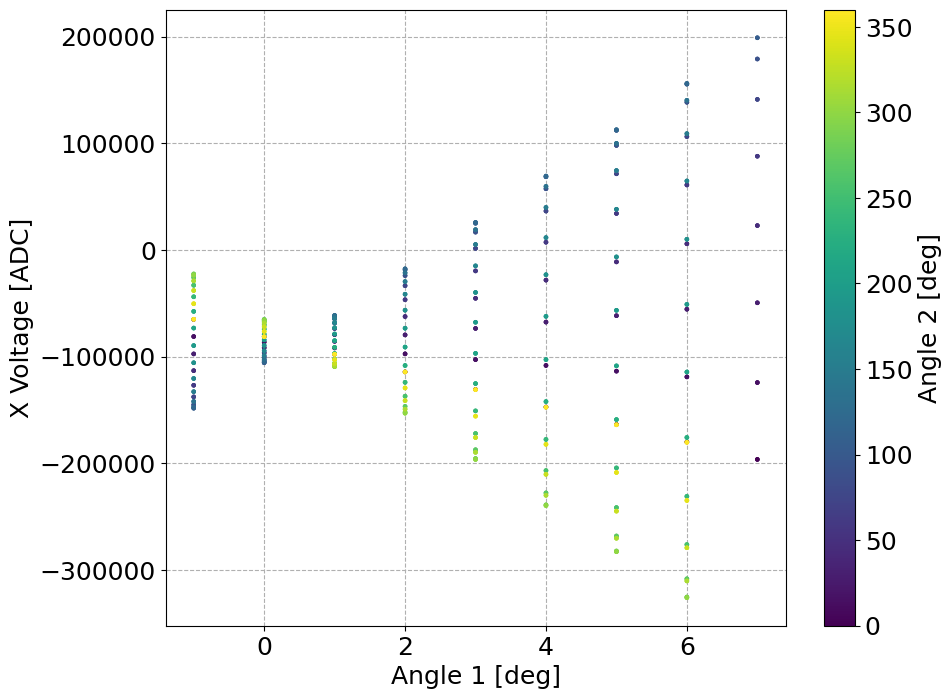

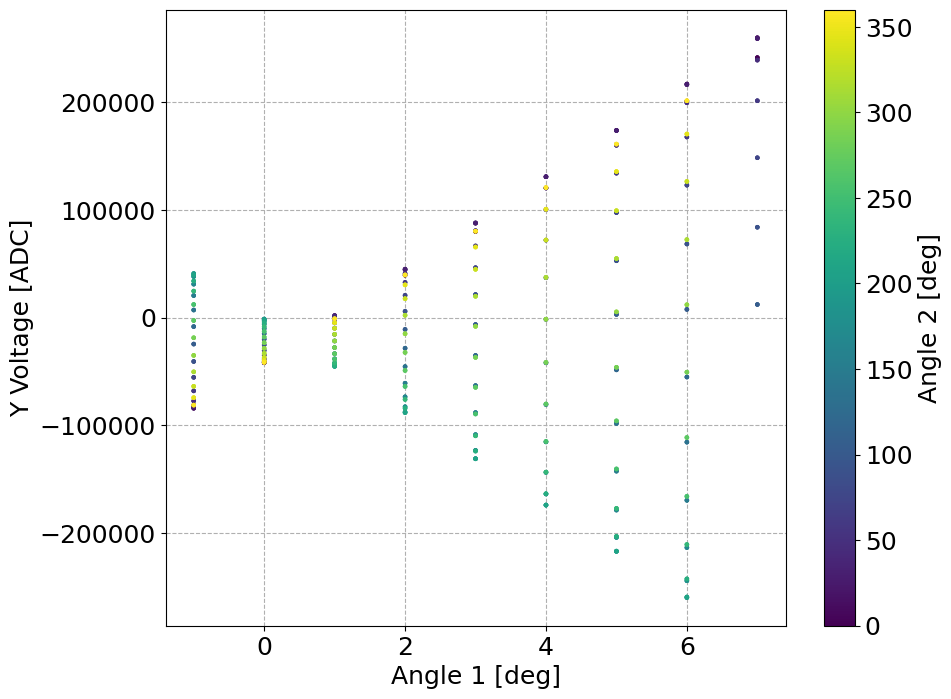

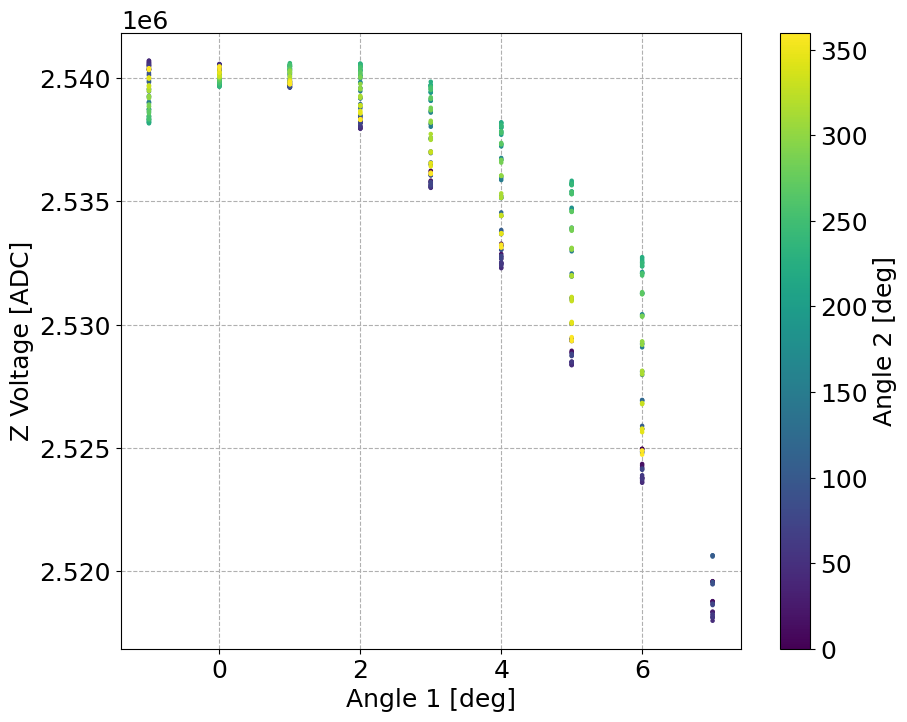

In [466]:
for B in ['X', 'Y', 'Z']:
    fig, ax = plt.subplots()
    
    sc = ax.scatter(df['SmarAct_Meas_Angle_1'], df[f'{probe}_Raw_{B}'], s=5, c=df['SmarAct_Meas_Angle_2'])
    cb = fig.colorbar(sc, label='Angle 2 [deg]')

    ax.set_xlabel('Angle 1 [deg]')
    ax.set_ylabel(f'{B} Voltage [ADC]')

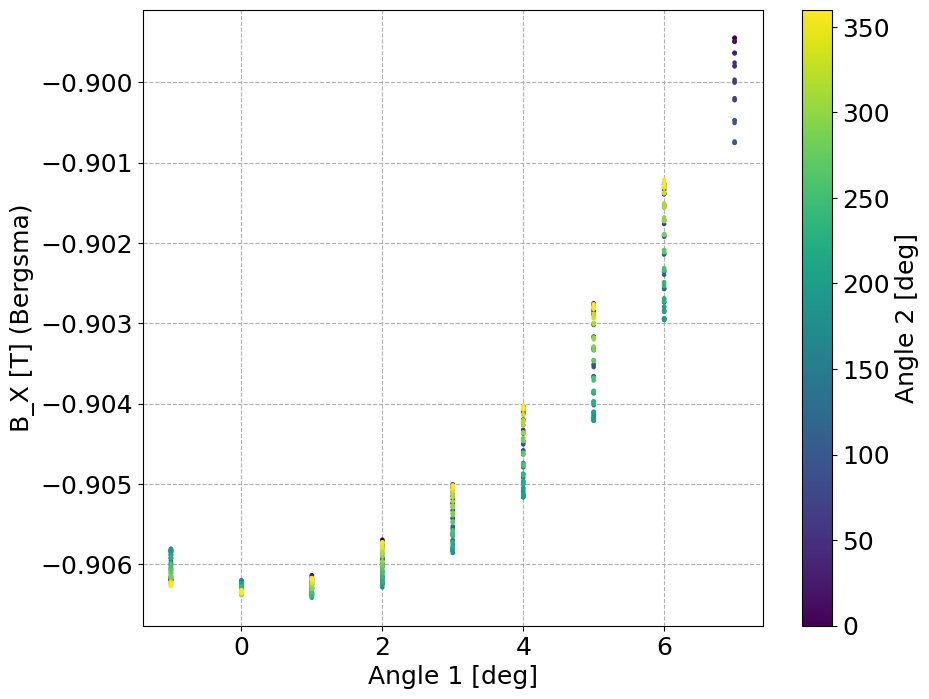

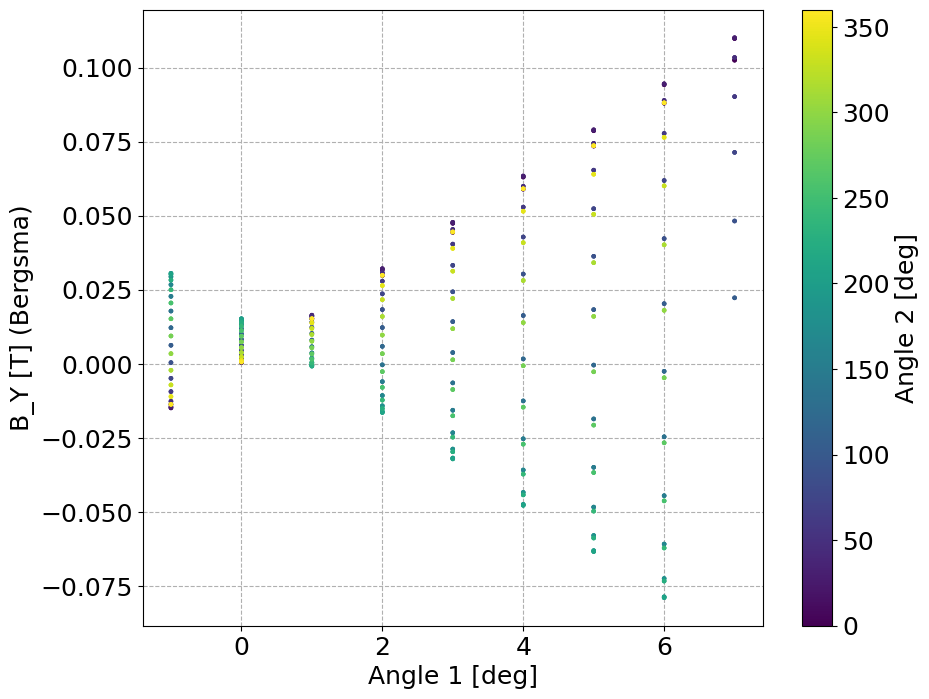

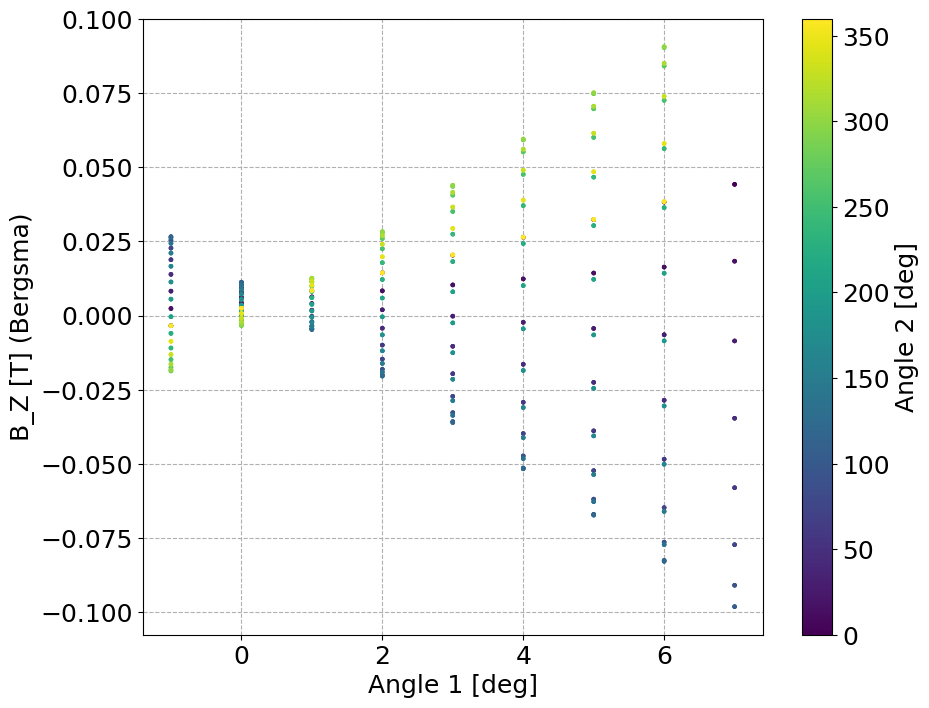

In [467]:
# CALIBRATED
for B in ['X', 'Y', 'Z']:
    fig, ax = plt.subplots()
    
    sc = ax.scatter(df['SmarAct_Meas_Angle_1'], df[f'{probe}_Cal_{B}'], s=5, c=df['SmarAct_Meas_Angle_2'])
    cb = fig.colorbar(sc, label='Angle 2 [deg]')

    ax.set_xlabel('Angle 1 [deg]')
    ax.set_ylabel(f'B_{B} [T] (Bergsma)')

In [115]:
# %matplotlib notebook # BAD
#%matplotlib inline
# %matplotlib ipympl

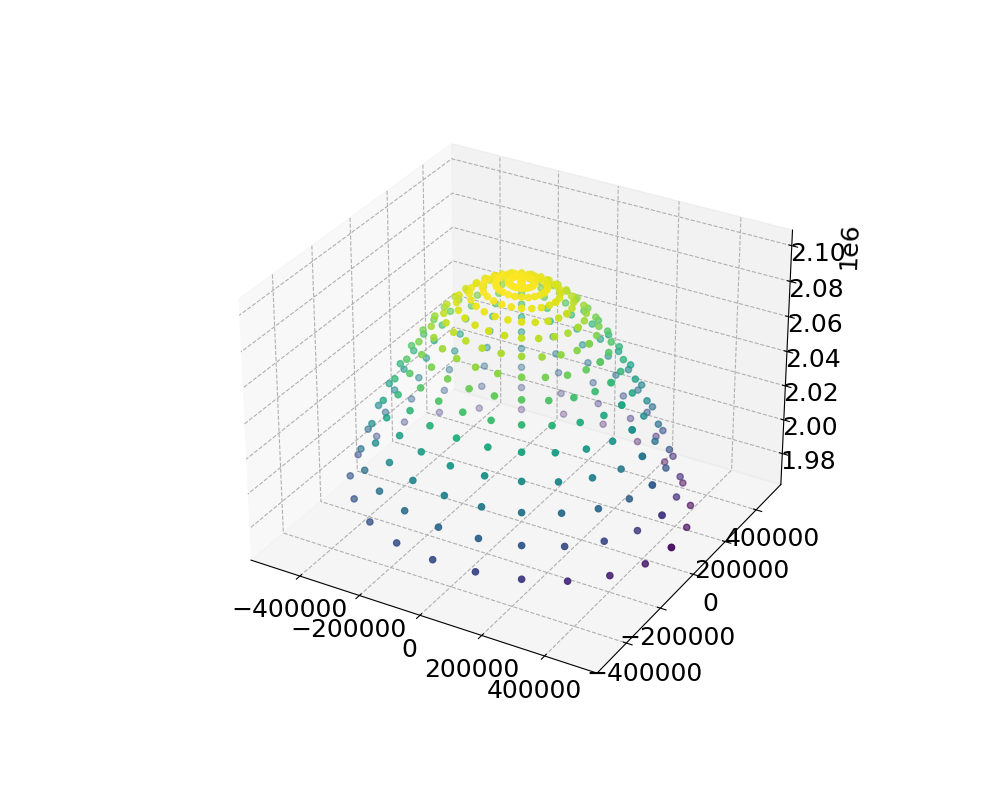

In [26]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

A1 = np.radians(df['SmarAct_Meas_Angle_1'])
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
R = np.abs(df[f'{probe}_Raw_Z'])
Cs = df[f'{probe}_Raw_Z']

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
Zs = R * np.cos(A1)

ax.scatter(Xs, Ys, Zs, c=Cs)

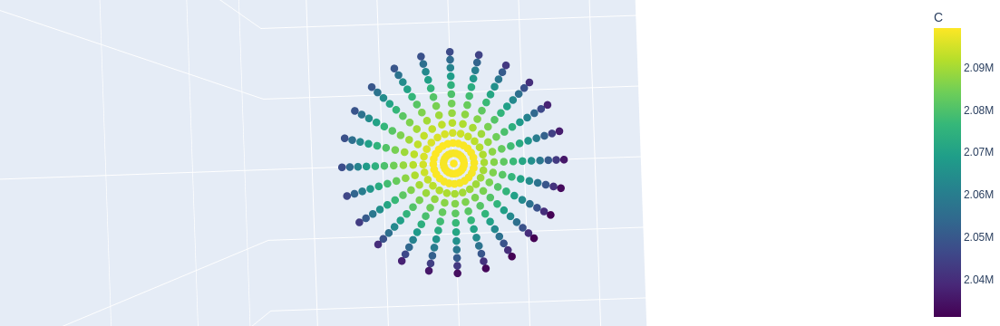

In [73]:
# plotly
# B = 'X'
# B = 'X'
B = 'Z'

# dtheta = 0
dtheta = -2

A1 = np.radians(df['SmarAct_Meas_Angle_1']+dtheta)
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
A1_deg = df['SmarAct_Meas_Angle_1']+dtheta
A2_deg = df['SmarAct_Meas_Angle_2']
R = np.abs(df[f'{probe}_Raw_{B}'])
Cs = df[f'{probe}_Raw_{B}']

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
Zs = R * np.cos(A1)

# Calculate min and max across all axes for equal scaling
#xyz_min = min(np.min(Xs), np.min(Ys), np.min(Zs))
#xyz_max = max(np.max(Xs), np.max(Ys), np.max(Zs))
#range_xyz = [xyz_min, xyz_max]
# Compute global center and range
all_min = min(np.min(Xs), np.min(Ys), np.min(Zs))
all_max = max(np.max(Xs), np.max(Ys), np.max(Zs))
vec_min = np.array([np.min(Xs), np.min(Ys), np.min(Zs)])
vec_max = np.array([np.max(Xs), np.max(Ys), np.max(Zs)])
#center = (all_min + all_max) / 2
center = (vec_min + vec_max) / 2
radius = (all_max - all_min) / 2 * 1.05  # 5% padding
axis_range = [[i1, i2] for i1, i2 in zip(center - radius, center + radius)]

fig = go.Figure(data=[go.Scatter3d(
    x=Xs,
    y=Ys,
    z=Zs,
    mode='markers',
    marker=dict(
        size=5,
        color=Cs,                # set color equal to a variable
        colorscale='Viridis',   # choose a colorscale
        colorbar=dict(title='C')  # add colorbar
    ),
    customdata=np.stack((A1_deg, A2_deg), axis=-1),
    hovertemplate=(
        "X: %{x}<br>" +
        "Y: %{y}<br>" +
        "Z: %{z}<br>" +
        "C: %{marker.color}<br>" +
        "A1: %{customdata[0]}<br>" +
        "A2: %{customdata[1]}<br>" +
        "<extra></extra>"  # suppress secondary box
    ),
)])

fig.update_layout(
    scene=dict(
        xaxis=dict(title='X', range=axis_range[0]),
        yaxis=dict(title='Y', range=axis_range[1]),
        zaxis=dict(title='Z', range=axis_range[2]),
        aspectmode='cube'  # Enforces equal scaling
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

#fig.show()

In [74]:
plot(fig)

'temp-plot.html'

In [41]:
vec_max

array([ 491971.05617014,  492424.2059745 , 2099307.99999999])

In [46]:
axis_range

[[array([-1363761.06679294, -1363580.87257538,   672892.74819699]),
  array([1360550.46914926, 1360730.66336682, 3397204.28413919])]]

In [47]:
center

array([-1.60529882e+03, -1.42510460e+03,  2.03504852e+06])

In [48]:
radius

1362155.7679710996

In [37]:
axis_range

[-560138.9755626281, 2164172.5603795713]

In [ ]:
np.arcsin()

/tmp/ipykernel_2325870/2167979312.py:30: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Text(0, 0.5, 'y = V * sin(theta) * sin(phi)')

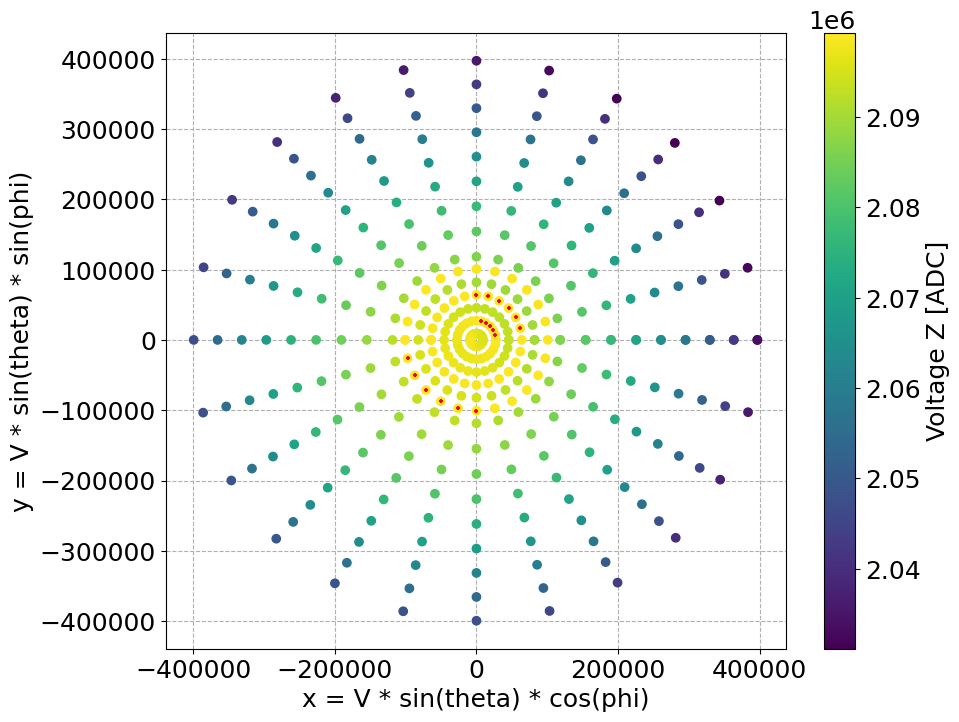

In [78]:
# flatten the last plot
# B = 'X'
# B = 'X'
B = 'Z'

# dtheta = 0
#dtheta = -2
dtheta = -2.75

A1 = np.radians(df['SmarAct_Meas_Angle_1'] + dtheta)
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
A1_deg = df['SmarAct_Meas_Angle_1'] + dtheta
A2_deg = df['SmarAct_Meas_Angle_2']
#R = np.abs(df[f'{probe}_Raw_X'])
# R = np.abs(df[f'{probe}_Raw_Y'])
R = np.abs(df[f'{probe}_Raw_{B}'].values)
Cs = df[f'{probe}_Raw_{B}'].values

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
##Zs = R * np.cos(A1)

imap = np.where(R > np.max(R)*0.9999)[0]

fig, ax = plt.subplots()

sc = ax.scatter(Xs, Ys, c=Cs)
cb = fig.colorbar(sc, label=f'Voltage {B} [ADC]')

ax. scatter(Xs[imap], Ys[imap], s=5, marker='+', c='red')

ax.set_xlabel('x = V * sin(theta) * cos(phi)')
ax.set_ylabel('y = V * sin(theta) * sin(phi)')

In [65]:
imap

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

In [66]:
Xs.shape

(375,)

In [67]:
imap.shape

AttributeError: 'tuple' object has no attribute 'shape'

In [61]:
R

Datetime
2025-04-18 11:04:11    2099138.0
2025-04-18 11:04:20    2099221.0
2025-04-18 11:04:30    2099305.0
2025-04-18 11:04:39    2099274.0
2025-04-18 11:04:48    2099308.0
                         ...    
2025-04-18 12:16:57    2043273.0
2025-04-18 12:17:06    2040088.0
2025-04-18 12:17:15    2037569.0
2025-04-18 12:17:25    2035467.0
2025-04-18 12:17:34    2033544.0
Name: 8E0000000D51483A_Raw_Z, Length: 375, dtype: float64

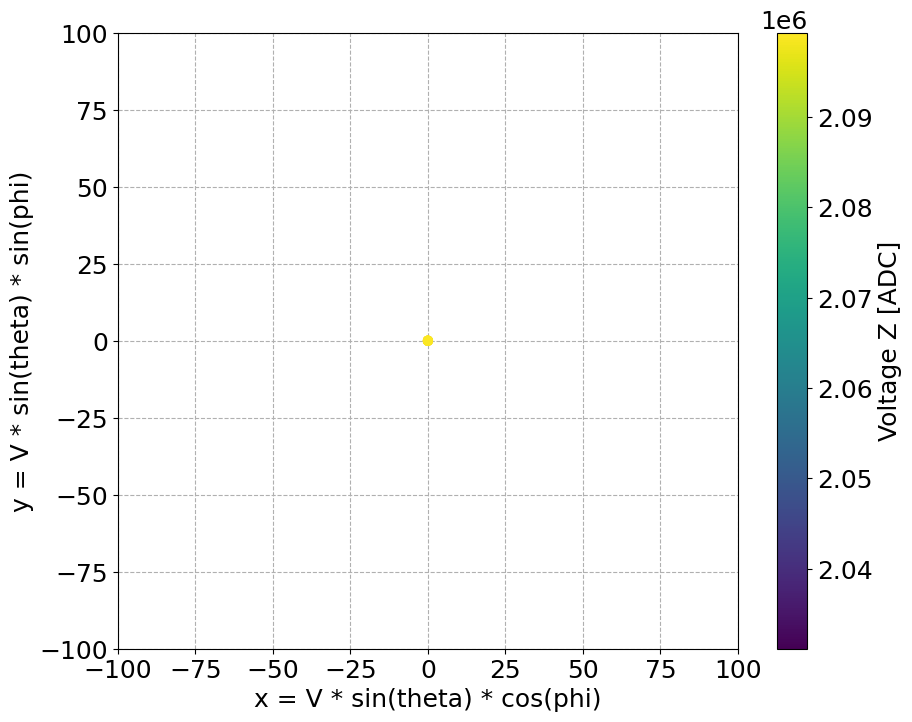

In [58]:
# zoom to center
ax.set_xlim([-100, 100])
ax.set_ylim([-100, 100])
fig

#### All Temperature Points, Pick One Angle 2

In [752]:
# a2 = 0
#a2 = 15
# a2 = 15+90
a2 = 180

In [753]:
df_ = df0[np.isclose(df0['SmarAct_Meas_Angle_2'], a2, atol=1e-3, rtol=1e-3)]

In [754]:
df_

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],8E0000000D51483A_Raw_X,8E0000000D51483A_Raw_Y,8E0000000D51483A_Raw_Z,8E0000000D51483A_Raw_T,8E0000000D51483A_Cal_X,...,8E0000000D51483A_Cal_T,SmarAct_Pattern_Angle_1,SmarAct_Pattern_Angle_2,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-04-23 01:24:19,4/23/2025 1:24:19 AM,0.0,0.0,0.0,0.0,-113166.0,41069.0,2759250.0,16524.0,-0.982771,...,16.524,-7.5,0.0,-1.000000,0.0,180.000008,0.0,117.0,0.032500,0.001354
2025-04-23 01:24:21,4/23/2025 1:24:21 AM,0.0,0.0,0.0,0.0,-113087.0,41136.0,2759306.0,16526.0,-0.982792,...,16.526,-7.5,0.0,-1.000003,0.0,179.999998,0.0,119.0,0.033056,0.001377
2025-04-23 01:24:23,4/23/2025 1:24:23 AM,0.0,0.0,0.0,0.0,-113058.0,41049.0,2759164.0,16527.0,-0.982743,...,16.527,-7.5,0.0,-0.999999,0.0,179.999999,0.0,121.0,0.033611,0.001400
2025-04-23 01:28:58,4/23/2025 1:28:58 AM,0.0,0.0,0.0,0.0,-95393.0,-2209.0,2760757.0,16540.0,-0.983242,...,16.540,-6.5,0.0,0.000003,0.0,180.000010,0.0,396.0,0.110000,0.004583
2025-04-23 01:29:00,4/23/2025 1:29:00 AM,0.0,0.0,0.0,0.0,-95451.0,-2157.0,2760556.0,16538.0,-0.983172,...,16.538,-6.5,0.0,-0.000002,0.0,180.000001,0.0,398.0,0.110556,0.004606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-04-23 14:29:32,4/23/2025 2:29:32 PM,0.0,0.0,0.0,0.0,154438.0,-565844.0,2678611.0,33931.0,-0.961010,...,33.931,6.5,0.0,12.999998,0.0,179.999998,0.0,47230.0,13.119444,0.546644
2025-04-23 14:29:33,4/23/2025 2:29:33 PM,0.0,0.0,0.0,0.0,154399.0,-565887.0,2678653.0,33935.0,-0.961026,...,33.935,6.5,0.0,12.999999,0.0,179.999999,0.0,47231.0,13.119722,0.546655
2025-04-23 14:34:08,4/23/2025 2:34:08 PM,0.0,0.0,0.0,0.0,172432.0,-608157.0,2668159.0,33889.0,-0.957279,...,33.889,7.5,0.0,14.000003,0.0,180.000007,0.0,47506.0,13.196111,0.549838


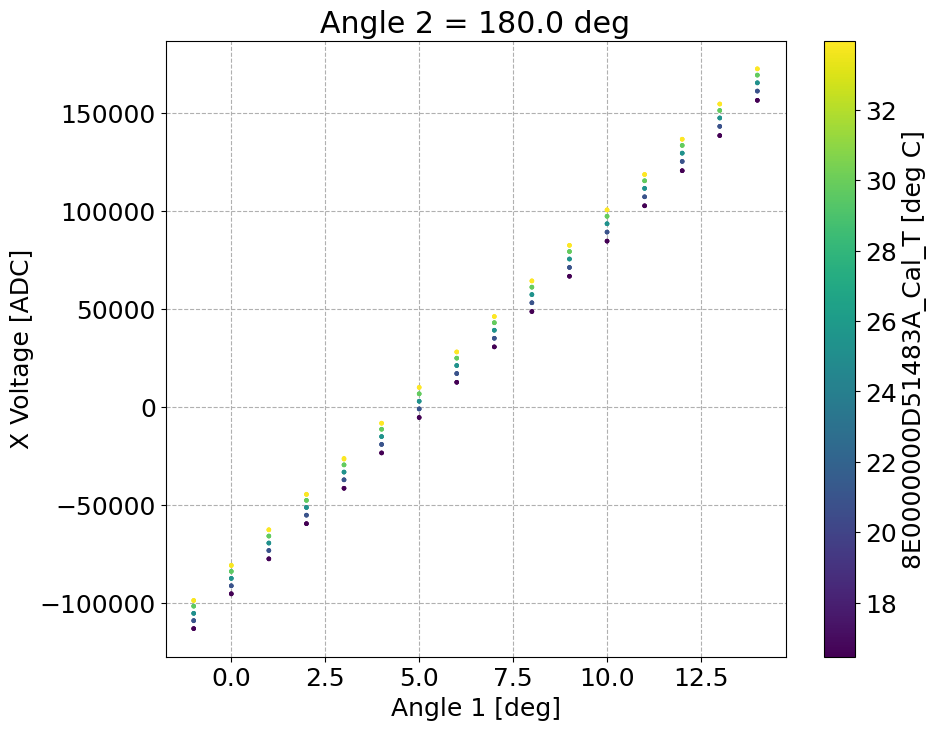

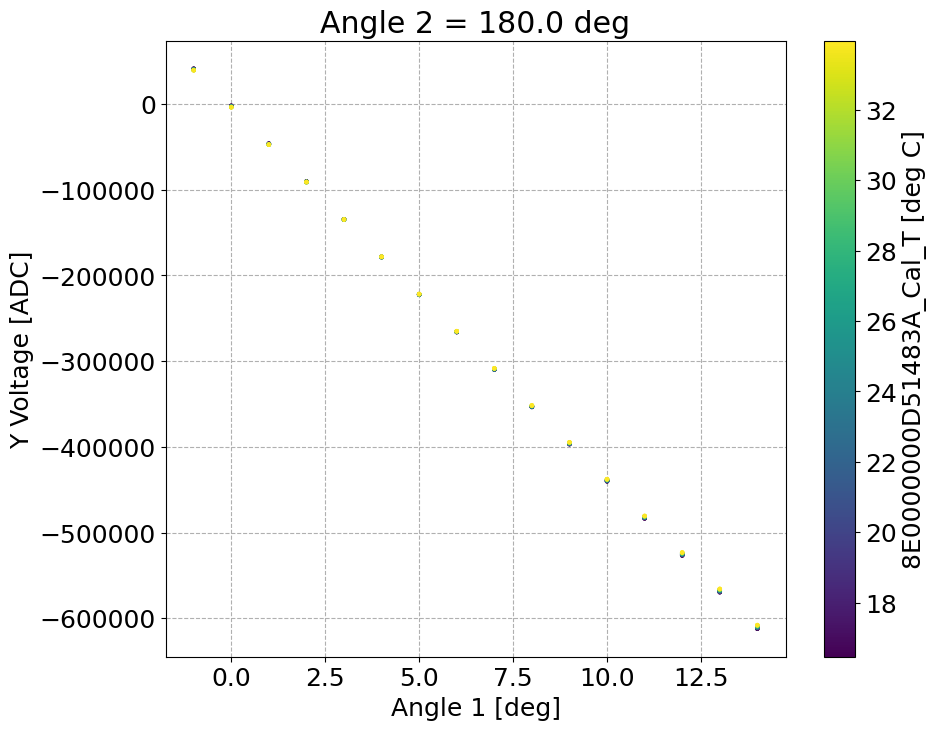

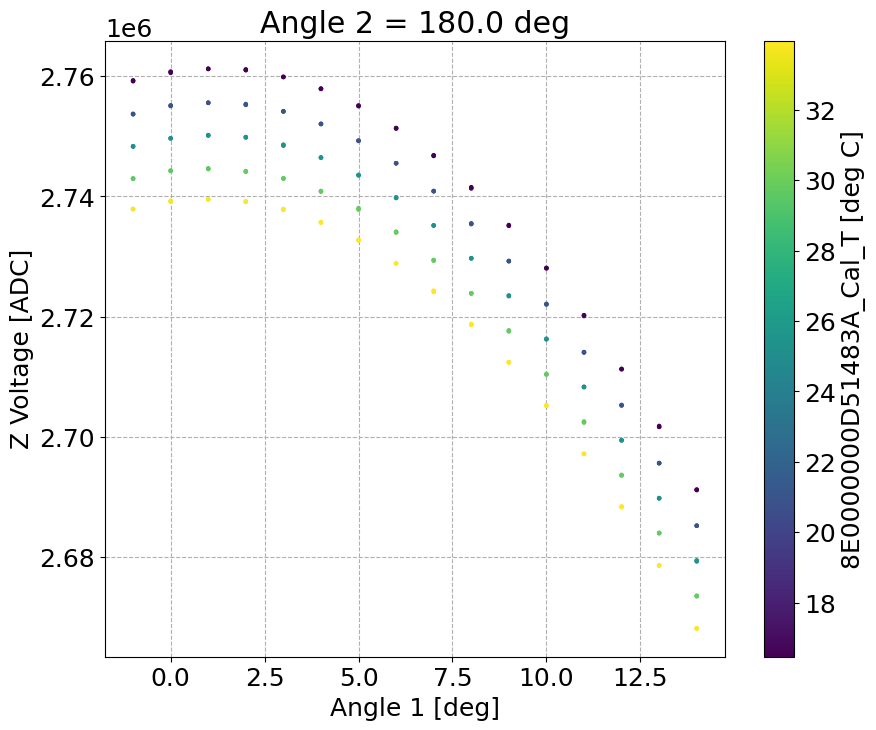

In [755]:
for B in ['X', 'Y', 'Z']:
    fig, ax = plt.subplots()
    
    sc = ax.scatter(df_['SmarAct_Meas_Angle_1'], df_[f'{probe}_Raw_{B}'], s=5, c=df_[f'{probe}_Cal_T'])
    cb = fig.colorbar(sc, label=f'{probe}_Cal_T [deg C]')

    ax.set_xlabel('Angle 1 [deg]')
    ax.set_ylabel(f'{B} Voltage [ADC]')
    ax.set_title(f'Angle 2 = {a2:0.1f} deg')

In [691]:
(2.76 - 2.74)/2.74

0.007299270072992544

In [ ]:
sc = ax.scatter(df_['SmarAct_Meas_Angle_1'], df_[f'{probe}_Raw_{B}'], s=5, c=df_[f'{probe}_Cal_T'])
    cb = fig.colorbar(sc, label=f'{probe}_Cal_T [deg C]')

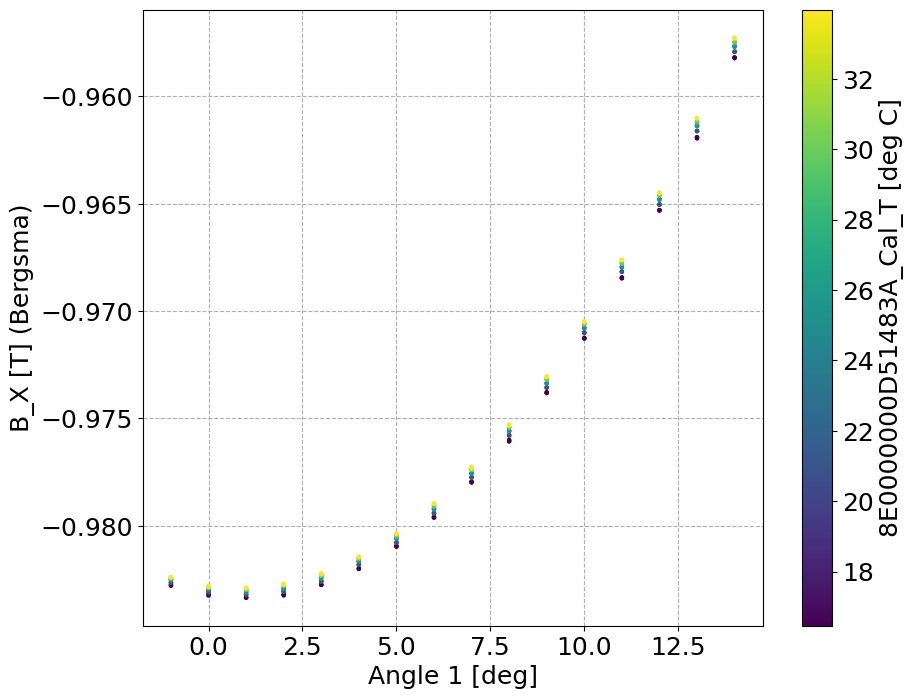

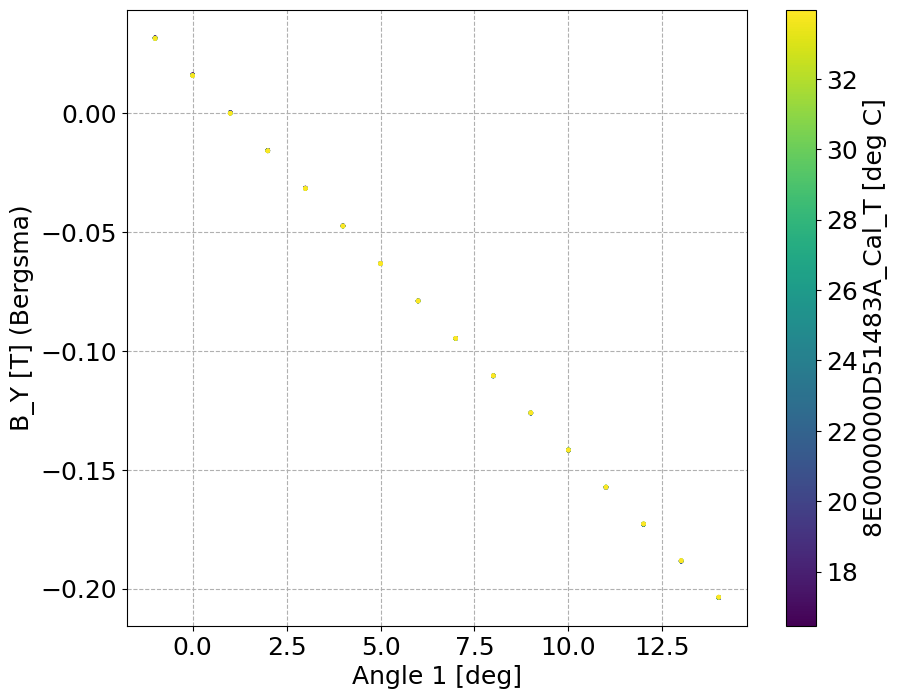

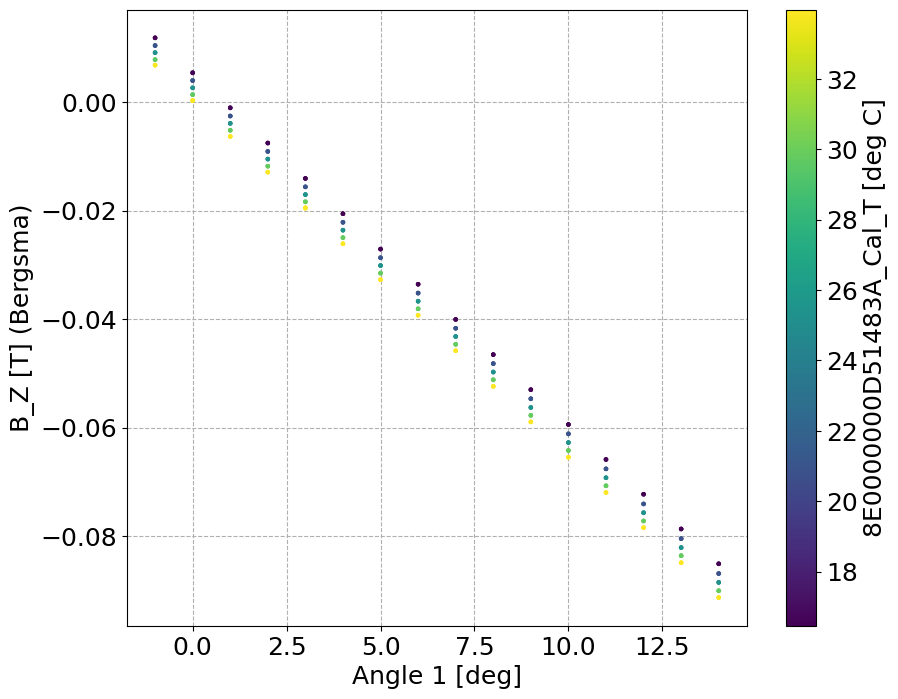

In [756]:
# CALIBRATED
for B in ['X', 'Y', 'Z']:
    fig, ax = plt.subplots()
    
    sc = ax.scatter(df_['SmarAct_Meas_Angle_1'], df_[f'{probe}_Cal_{B}'], s=5, c=df_[f'{probe}_Cal_T'])
    cb = fig.colorbar(sc, label=f'{probe}_Cal_T [deg C]')

    ax.set_xlabel('Angle 1 [deg]')
    ax.set_ylabel(f'B_{B} [T] (Bergsma)')

In [115]:
# %matplotlib notebook # BAD
#%matplotlib inline
# %matplotlib ipympl

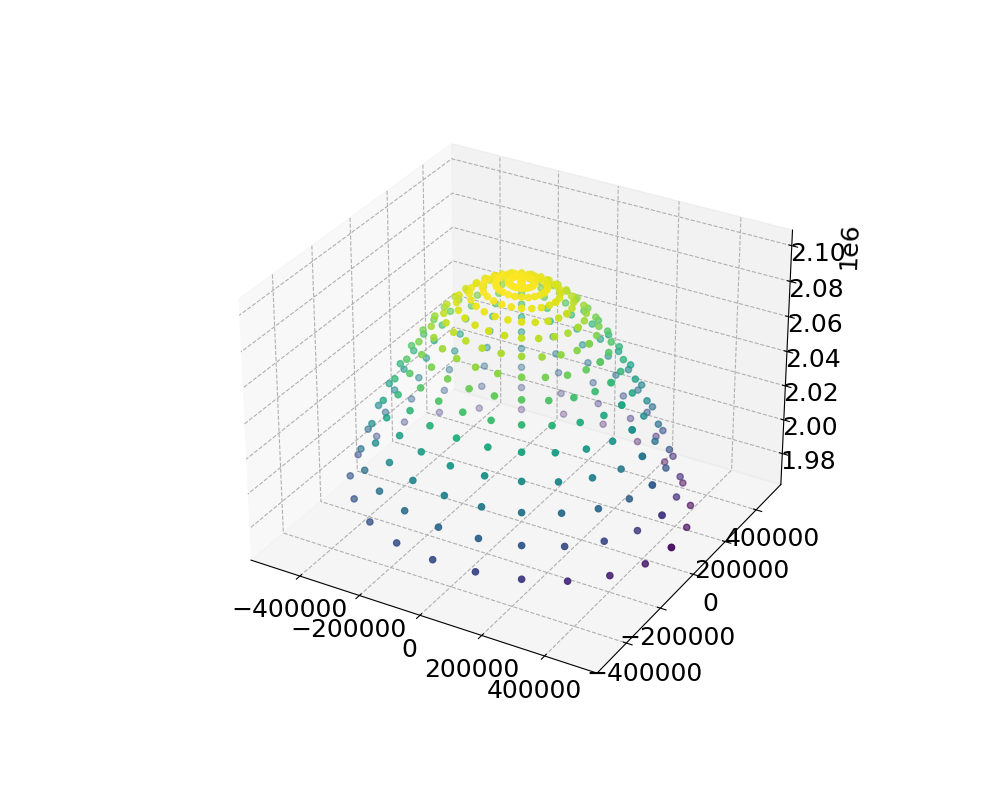

In [26]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

A1 = np.radians(df['SmarAct_Meas_Angle_1'])
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
R = np.abs(df[f'{probe}_Raw_Z'])
Cs = df[f'{probe}_Raw_Z']

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
Zs = R * np.cos(A1)

ax.scatter(Xs, Ys, Zs, c=Cs)

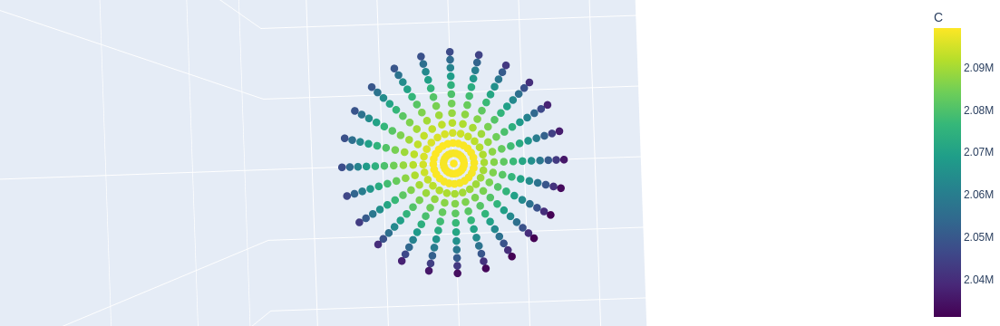

In [73]:
# plotly
# B = 'X'
# B = 'X'
B = 'Z'

# dtheta = 0
dtheta = -2

A1 = np.radians(df['SmarAct_Meas_Angle_1']+dtheta)
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
A1_deg = df['SmarAct_Meas_Angle_1']+dtheta
A2_deg = df['SmarAct_Meas_Angle_2']
R = np.abs(df[f'{probe}_Raw_{B}'])
Cs = df[f'{probe}_Raw_{B}']

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
Zs = R * np.cos(A1)

# Calculate min and max across all axes for equal scaling
#xyz_min = min(np.min(Xs), np.min(Ys), np.min(Zs))
#xyz_max = max(np.max(Xs), np.max(Ys), np.max(Zs))
#range_xyz = [xyz_min, xyz_max]
# Compute global center and range
all_min = min(np.min(Xs), np.min(Ys), np.min(Zs))
all_max = max(np.max(Xs), np.max(Ys), np.max(Zs))
vec_min = np.array([np.min(Xs), np.min(Ys), np.min(Zs)])
vec_max = np.array([np.max(Xs), np.max(Ys), np.max(Zs)])
#center = (all_min + all_max) / 2
center = (vec_min + vec_max) / 2
radius = (all_max - all_min) / 2 * 1.05  # 5% padding
axis_range = [[i1, i2] for i1, i2 in zip(center - radius, center + radius)]

fig = go.Figure(data=[go.Scatter3d(
    x=Xs,
    y=Ys,
    z=Zs,
    mode='markers',
    marker=dict(
        size=5,
        color=Cs,                # set color equal to a variable
        colorscale='Viridis',   # choose a colorscale
        colorbar=dict(title='C')  # add colorbar
    ),
    customdata=np.stack((A1_deg, A2_deg), axis=-1),
    hovertemplate=(
        "X: %{x}<br>" +
        "Y: %{y}<br>" +
        "Z: %{z}<br>" +
        "C: %{marker.color}<br>" +
        "A1: %{customdata[0]}<br>" +
        "A2: %{customdata[1]}<br>" +
        "<extra></extra>"  # suppress secondary box
    ),
)])

fig.update_layout(
    scene=dict(
        xaxis=dict(title='X', range=axis_range[0]),
        yaxis=dict(title='Y', range=axis_range[1]),
        zaxis=dict(title='Z', range=axis_range[2]),
        aspectmode='cube'  # Enforces equal scaling
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

#fig.show()

In [74]:
plot(fig)

'temp-plot.html'

In [41]:
vec_max

array([ 491971.05617014,  492424.2059745 , 2099307.99999999])

In [46]:
axis_range

[[array([-1363761.06679294, -1363580.87257538,   672892.74819699]),
  array([1360550.46914926, 1360730.66336682, 3397204.28413919])]]

In [47]:
center

array([-1.60529882e+03, -1.42510460e+03,  2.03504852e+06])

In [48]:
radius

1362155.7679710996

In [37]:
axis_range

[-560138.9755626281, 2164172.5603795713]

In [ ]:
np.arcsin()

/tmp/ipykernel_2325870/2167979312.py:30: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Text(0, 0.5, 'y = V * sin(theta) * sin(phi)')

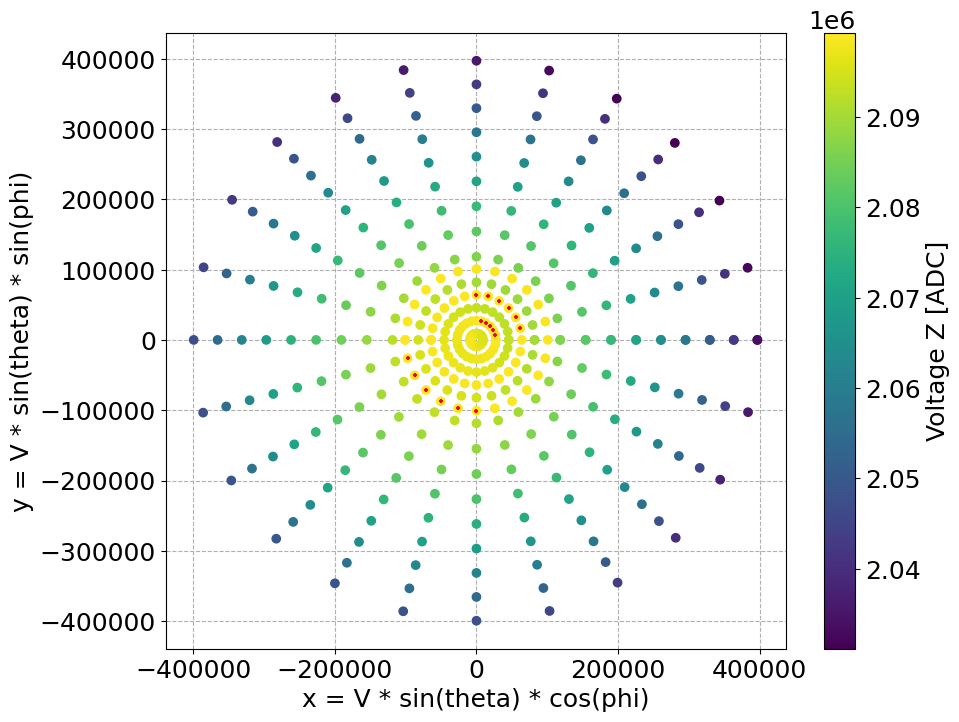

In [78]:
# flatten the last plot
# B = 'X'
# B = 'X'
B = 'Z'

# dtheta = 0
#dtheta = -2
dtheta = -2.75

A1 = np.radians(df['SmarAct_Meas_Angle_1'] + dtheta)
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
A1_deg = df['SmarAct_Meas_Angle_1'] + dtheta
A2_deg = df['SmarAct_Meas_Angle_2']
#R = np.abs(df[f'{probe}_Raw_X'])
# R = np.abs(df[f'{probe}_Raw_Y'])
R = np.abs(df[f'{probe}_Raw_{B}'].values)
Cs = df[f'{probe}_Raw_{B}'].values

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
##Zs = R * np.cos(A1)

imap = np.where(R > np.max(R)*0.9999)[0]

fig, ax = plt.subplots()

sc = ax.scatter(Xs, Ys, c=Cs)
cb = fig.colorbar(sc, label=f'Voltage {B} [ADC]')

ax. scatter(Xs[imap], Ys[imap], s=5, marker='+', c='red')

ax.set_xlabel('x = V * sin(theta) * cos(phi)')
ax.set_ylabel('y = V * sin(theta) * sin(phi)')

In [65]:
imap

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

In [66]:
Xs.shape

(375,)

In [67]:
imap.shape

AttributeError: 'tuple' object has no attribute 'shape'

In [61]:
R

Datetime
2025-04-18 11:04:11    2099138.0
2025-04-18 11:04:20    2099221.0
2025-04-18 11:04:30    2099305.0
2025-04-18 11:04:39    2099274.0
2025-04-18 11:04:48    2099308.0
                         ...    
2025-04-18 12:16:57    2043273.0
2025-04-18 12:17:06    2040088.0
2025-04-18 12:17:15    2037569.0
2025-04-18 12:17:25    2035467.0
2025-04-18 12:17:34    2033544.0
Name: 8E0000000D51483A_Raw_Z, Length: 375, dtype: float64

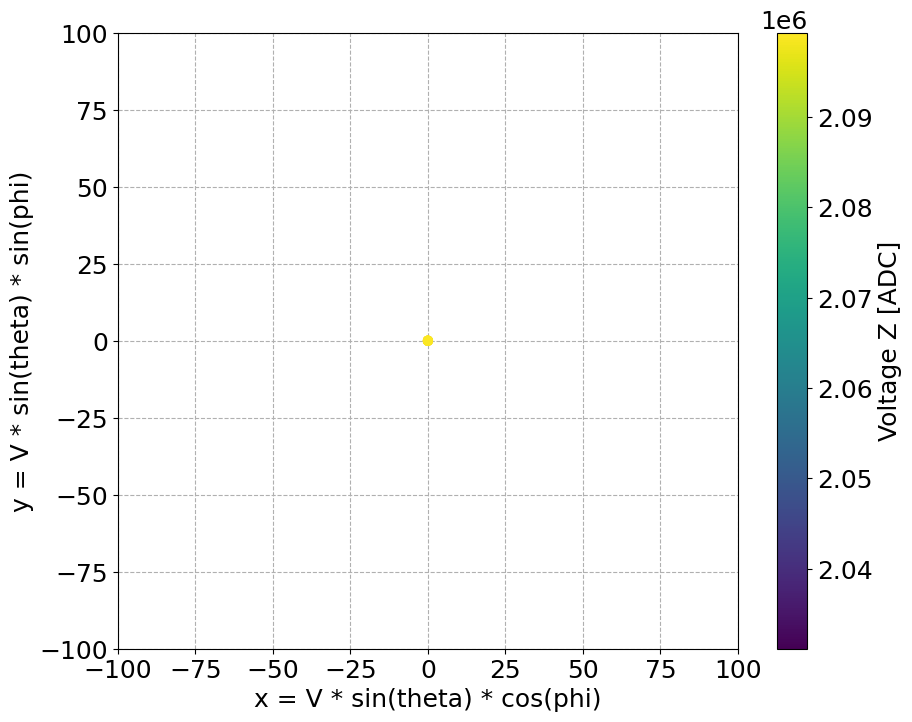

In [58]:
# zoom to center
ax.set_xlim([-100, 100])
ax.set_ylim([-100, 100])
fig

## Correlations

In [ ]:
fig, ax = plt.subplots()


ax.scatter(df_['SmarAct_Meas_Angle_2_Centered'], df_[f'NMR [T]'], s=1)

ax.set_xlabel('SmarAct 2 [rad] centered')
ax.set_ylabel('NMR [T]');

In [ ]:
fig, ax = plt.subplots()


ax.scatter(df_['SmarAct_Meas_Angle_1_Centered'], df_[f'NMR [T]'], s=1)

ax.set_xlabel('SmarAct 1 [rad] centered')
ax.set_ylabel('NMR [T]');

In [ ]:
fig, ax = plt.subplots()


ax.scatter(df_['SmarAct_Meas_Angle_2_Centered'], df_[f'{probe}_Raw_Phi'], s=1)

ax.set_ylabel(f'{probe}_Raw_Phi')
ax.set_xlabel('SmarAct 2 [rad] centered');

In [ ]:
fig, ax = plt.subplots()
#ax.hist(df_[f'{probe}_Raw_Theta'], bins=75, histtype='step');
ax.scatter(df_['days_delta'], df_[f'{probe}_Raw_Theta'], s=1);

ax.set_xlabel(f'Time from start (days)')
ax.set_ylabel(f'{probe}_Raw_Theta');

In [ ]:
fig, ax = plt.subplots()
#ax.hist(df_[f'{probe}_Raw_Theta'], bins=75, histtype='step');
ax.scatter(df_['SmarAct_Meas_Angle_1_Centered'], df_[f'{probe}_Raw_Theta'], s=1);

ax.set_xlabel(f'SmarAct 1 [rad] centered')
ax.set_ylabel(f'{probe}_Raw_Theta');

In [ ]:
# check flip of Angle 2 by pi (plate is now upside-down)
a2_flipped = np.radians(df_['SmarAct_Meas_Angle_2_Centered']) - np.pi
a2_flipped[a2_flipped<-np.pi] = a2_flipped[a2_flipped<-np.pi]+2*np.pi

In [ ]:
df_.SmarAct_Meas_Angle_1_Centered

In [ ]:
fig, ax = plt.subplots()

#ax.scatter(np.radians(df_['SmarAct_Meas_Angle_2_Centered']), df_[f'{probe}_Raw_Phi'], s=1)
#ax.scatter(a2_flipped, df_[f'{probe}_Raw_Phi'], s=1)
sc = ax.scatter(a2_flipped, df_[f'{probe}_Raw_Phi'], c=df_.SmarAct_Meas_Angle_1_Centered, s=4)
cb = fig.colorbar(sc, label='SmarAct 1 [deg], centered')

# zoom in
# ax.set_xlim([-np.pi-0.01, -2.0])
# ax.set_ylim([-np.pi-0.01, -1.7])
# ax.set_xlim([-np.pi-0.01, -3.0])
# ax.set_ylim([-2.0, -1.55])

# ax.set_xlim([-0.01, 0.01])
# ax.set_ylim([1.194, 1.203])

# ax.set_xlim([-1., 1.0])
# ax.set_ylim([0., 1.8])

ax.set_facecolor('gray')

ax.set_xlabel(r'(SmarAct 2 [rad] centered)  - $\pi$, (re-centered)')
ax.set_ylabel(f'{probe}_Raw_Phi');

In [ ]:
# NOT -PI
fig, ax = plt.subplots()

#ax.scatter(np.radians(df_['SmarAct_Meas_Angle_2_Centered']), df_[f'{probe}_Raw_Phi'], s=1)
#ax.scatter(a2_flipped, df_[f'{probe}_Raw_Phi'], s=1)
sc = ax.scatter(np.radians(df_.SmarAct_Meas_Angle_2_Centered), df_[f'{probe}_Raw_Phi'], c=df_.SmarAct_Meas_Angle_1_Centered, s=4)
cb = fig.colorbar(sc, label='SmarAct 1 [deg], centered')

# zoom in
# ax.set_xlim([-np.pi-0.01, -2.0])
# ax.set_ylim([-np.pi-0.01, -1.7])
# ax.set_xlim([-np.pi-0.01, -3.0])
# ax.set_ylim([-2.0, -1.55])

# ax.set_xlim([-0.01, 0.01])
# ax.set_ylim([1.194, 1.203])

ax.set_facecolor('gray')

ax.set_xlabel(r'(SmarAct 2 [rad] centered)  - $\pi$, (re-centered)')
ax.set_ylabel(f'{probe}_Raw_Phi');

In [ ]:
df_.SmarAct_Meas_Angle_1_Centered.round(1).unique()

In [ ]:
len(df_.SmarAct_Meas_Angle_1_Centered.round(1).unique())

- This seems to match the previous results from a finer scan.

In [ ]:
df_.SmarAct_Meas_Angle_1_Centered

In [ ]:
df_.SmarAct_Meas_Angle_1

In [ ]:
fig, ax = plt.subplots()


ax.scatter(df_['SmarAct_Meas_Angle_1_Centered'], df_[f'{probe}_Raw_Z'], s=1)

ax.set_xlabel('SmarAct 1 [rad] centered')
ax.set_ylabel(f'{probe}_Raw_Z');

In [ ]:
fig, ax = plt.subplots()
ax.hist(df_[f'{probe}_Raw_Theta'], bins=75, histtype='step')
ax.set_xlabel(f'{probe}_Raw_Theta');

In [ ]:
df['2F0000000D5EC73A_Raw_Phi']

In [ ]:
##### calibrated info

In [ ]:
fig, ax = plt.subplots()

ax.scatter(np.radians(df_['SmarAct_Meas_Angle_1_Centered']), df_[f'{probe}_Cal_Theta2'], s=1);

ax.set_xlabel(f'SmarAct 1 [rad] centered')
ax.set_ylabel(f'{probe}_Cal_Theta (redef. Cal components)');

In [ ]:
np.arccos(1.0 / 10.0), np.arccos(-1.0 / 10.0)

In [ ]:
df_[['2F0000000D5EC73A_Raw_Z', '2F0000000D5EC73A_Cal_X']]

In [ ]:
df_[['2F0000000D5EC73A_Raw_Y', '2F0000000D5EC73A_Cal_Y']]

In [ ]:
df_[['2F0000000D5EC73A_Raw_X', '2F0000000D5EC73A_Cal_Z']]

In [ ]:
df_upside_down = df_[np.isclose(df_.SmarAct_Meas_Angle_2_Centered, -16)]
df_pos90 = df_[np.isclose(df_.SmarAct_Meas_Angle_2_Centered, -16+90)]

In [ ]:
-16+90

In [ ]:
for i in ['X', 'Y', 'Z']:
    print(i)
    print(np.ptp(df_upside_down[f'2F0000000D5EC73A_Cal_{i}']))
    fig, ax = plt.subplots()

    ax.scatter(df_upside_down.SmarAct_Meas_Angle_1_Centered, df_upside_down[f'2F0000000D5EC73A_Cal_{i}'])

    ax.set_xlabel('SmarAct1 [deg]')
    ax.set_ylabel(f'Cal {i} [T]')

In [ ]:
for i in ['X', 'Y', 'Z']:
    print(i)
    print(np.ptp(df_pos90[f'2F0000000D5EC73A_Cal_{i}']))
    fig, ax = plt.subplots()

    ax.scatter(df_pos90.SmarAct_Meas_Angle_1_Centered, df_pos90[f'2F0000000D5EC73A_Cal_{i}'])

    ax.set_xlabel('SmarAct1 [deg]')
    ax.set_ylabel(f'Cal {i} [T]')

In [ ]:
np.radians(-9.5 + 2)

In [ ]:
np.radians(-16)

In [ ]:
fig, ax = plt.subplots()

ax.scatter(np.radians(df_['SmarAct_Meas_Angle_2_Centered']), df_[f'{probe}_Cal_Phi2'], s=1);
ax.plot([-.2793, -.2793], [-np.pi, np.pi], 'r--')

ax.set_xlabel(f'SmarAct 2 [rad] centered')
ax.set_ylabel(f'{probe}_Cal_Phi (redef. Cal components)');

In [ ]:
phi2_flipped = df_[f'{probe}_Cal_Phi2']
# check flip of Phi2 by pi (plate is now upside-down), or maybe the -theta correction isn't working
# phi2_flipped = df_[f'{probe}_Cal_Phi2'] - np.pi
# phi2_flipped[phi2_flipped<-np.pi] = phi2_flipped[phi2_flipped<-np.pi]+2*np.pi

In [ ]:
fig, ax = plt.subplots()

ax.scatter(-np.radians(df_['SmarAct_Meas_Angle_2_Centered']), phi2_flipped, s=1);
ax.plot([.2793, .2793], [-np.pi, np.pi], 'r--')

ax.set_xlabel(f'- SmarAct 2 [rad] centered')
ax.set_ylabel(fr'{probe}_Cal_Phi (redef. Cal components)') #, -$\pi$ and recentered');

In [ ]:
# th0 = -2.0
th0 = -1.8

fig, ax = plt.subplots()

ax.scatter(-np.radians(df_['SmarAct_Meas_Angle_1_Centered']-th0), df_[f'{probe}_Cal_Theta2'], s=1);

ax.plot([0.0, 0.15], [0.0, 0.15], 'r--')

ax.set_xlabel(f'-(SmarAct 1 [rad] centered + rad({-th0} deg))')
ax.set_ylabel(f'{probe}_Cal_Theta (redef. Cal components)');

In [ ]:
np.radians(-1.8)

In [ ]:
fig, ax = plt.subplots()

ax.scatter(np.radians(df_['SmarAct_Meas_Angle_2_Centered']), df_[f'{probe}_Cal_Theta'], s=1);

ax.set_xlabel(f'SmarAct 2 [rad] centered')
ax.set_ylabel(f'{probe}_Cal_Theta');

# Analysis 1: Using Cal Values (a.k.a.  Assessing Bergsma Calibration)

## Pole-to-Pole

- Preliminary results from June 2022:
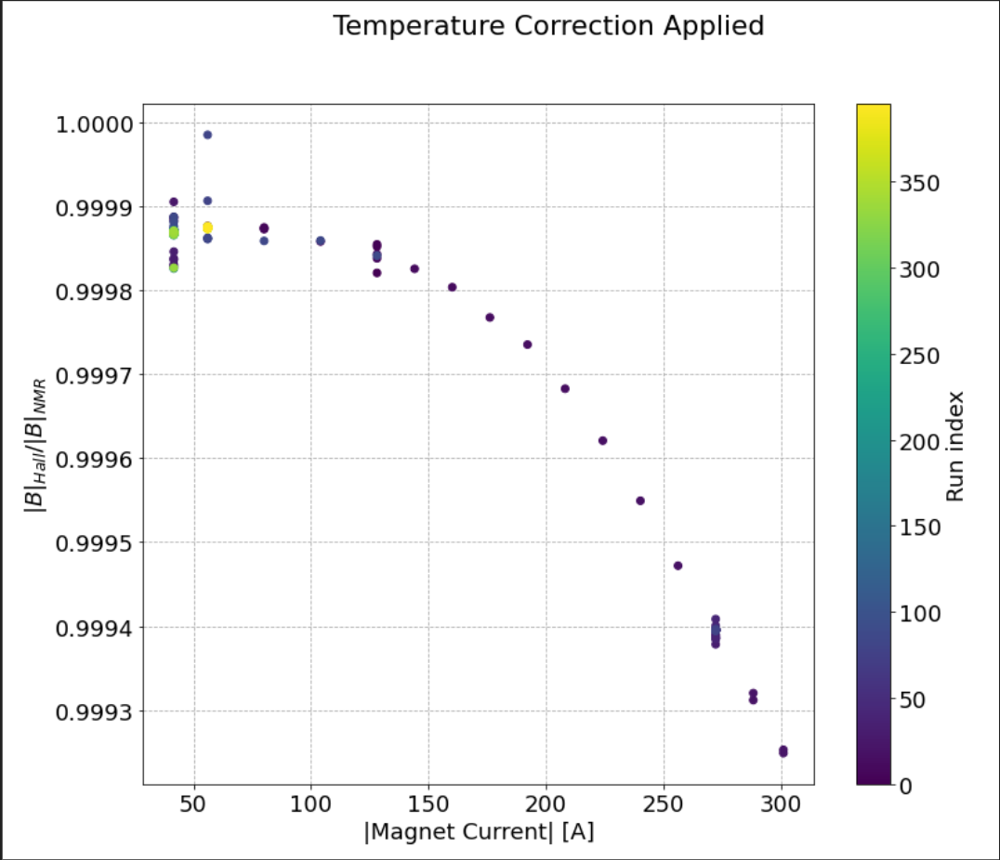

In [17]:
df_['Magnet Current [A]']

NameError: name 'df_' is not defined

In [18]:
# FIXME!
# using a fixed value for a quick approximation
BHall_on_BNMR = 0.99976
# BHall_on_BNMR = 0.9998 # test based on NMR not in exact Hall probe location for V vs. B, T
B_Hall_NMR = BHall_on_BNMR * df['NMR [T]'].values

In [19]:
B_Hall_NMR

array([1.00182141, 1.00182139, 1.00182137, ..., 1.00138823, 1.00138823,
       1.00138823])

In [20]:
df.loc[:, 'B_Hall_NMR'] = B_Hall_NMR

In [21]:
(df['B_Hall_NMR'] - df['NMR [T]']).describe()

count    5.089500e+04
mean    -2.405286e-04
std      7.145305e-08
min     -2.406029e-04
25%     -2.406022e-04
50%     -2.404955e-04
75%     -2.404951e-04
max     -2.403908e-04
dtype: float64

## Assign better axis labels

In [22]:
df.loc[:, 'Cal_X'] = df.loc[:, f'{probe}_Cal_Y']
df.loc[:, 'Cal_Y'] = df.loc[:, f'{probe}_Cal_Z']
df.loc[:, 'Cal_Z'] = df.loc[:, f'{probe}_Cal_X']
df.loc[:, 'Cal_Bmag'] = df.loc[:, f'{probe}_Cal_Bmag']
# field angles
df.loc[:, 'Cal_Trans'] = (df.loc[:, 'Cal_X']**2 + df.loc[:, 'Cal_Y']**2)**(1/2)
df.loc[:, 'Cal_Theta'] = np.arctan2(df.loc[:, 'Cal_Trans'], df.loc[:, 'Cal_Bmag'])
df.loc[:, 'Cal_Phi'] = np.arctan2(df.loc[:, 'Cal_Y'], df.loc[:, 'Cal_X'])

In [23]:
#t0_ = '01-09-23 20:29' # finer scan start
#tf_ = '01-10-23 11:45:10' # magnet tripped during finer scan
t0_ = t0
tf_ = tf
df_ = df.query(f"'{t0_}' <= Datetime <= '{tf_}'").copy()
# df_t_ = df_t.query(f"'{t0_}' <= Datetime <= '{tf_}'").copy()

# remove partial line
#df_ = df_.query('SmarAct_Meas_Angle_1_Centered < -5.3').copy()
#df_ = df_.query('SmarAct_Meas_Angle_1_Centered < 3.4').copy()

In [24]:
df_.SmarAct_Meas_Angle_1_Centered.round(3).unique()

array([-9.5 , -9.25, -9.  , -8.75, -8.5 , -8.25, -8.  , -7.75, -7.5 ,
       -7.25, -7.  , -6.75, -6.5 , -6.25, -6.  , -5.75, -5.5 , -5.25,
       -5.  , -4.75, -4.5 , -4.25, -4.  , -3.75, -3.5 , -3.25, -3.  ,
       -2.75, -2.5 , -2.25, -2.  , -1.75, -1.5 , -1.25, -1.  , -0.75,
       -0.5 , -0.25,  0.  ,  0.25,  0.5 ,  0.75,  1.  ,  1.25,  1.5 ,
        1.75,  2.  ,  2.25,  2.5 ,  2.75,  3.  ,  3.25,  3.5 ,  3.75,
        4.  ,  4.25,  4.5 ,  4.75,  5.  ,  5.25,  5.5 ])

## Field Strength

In [25]:
df_.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'NMR [T]',
       'NMR [FFT]', '2F0000000D5EC73A_Raw_X', '2F0000000D5EC73A_Raw_Y',
       '2F0000000D5EC73A_Raw_Z', '2F0000000D5EC73A_Raw_T',
       '2F0000000D5EC73A_Cal_X', '2F0000000D5EC73A_Cal_Y',
       '2F0000000D5EC73A_Cal_Z', '2F0000000D5EC73A_Cal_T',
       'SmarAct_Pattern_Angle_1', 'SmarAct_Pattern_Angle_2',
       'SmarAct_Meas_Angle_1', 'SmarAct_Meas_Rotation_Angle_1',
       'SmarAct_Meas_Angle_2', 'SmarAct_Meas_Rotation_Angle_2',
       'seconds_delta', 'hours_delta', 'days_delta',
       '2F0000000D5EC73A_Raw_Bmag', '2F0000000D5EC73A_Raw_Theta',
       '2F0000000D5EC73A_Raw_Phi', '2F0000000D5EC73A_Cal_Bmag',
       '2F0000000D5EC73A_Cal_Theta', '2F0000000D5EC73A_Cal_Phi',
       '2F0000000D5EC73A_Cal_Theta2', '2F0000000D5EC73A_Cal_Phi2',
       'Magnet Resistance [Ohm]', 'Coil Resistance [Ohm]', 'Magnet Power [W]',
       'SmarAct_Meas_Angle_1_Centered', 'SmarAct_Meas_Angle_2_Centered',
       'B_Hall_NMR', 'Cal

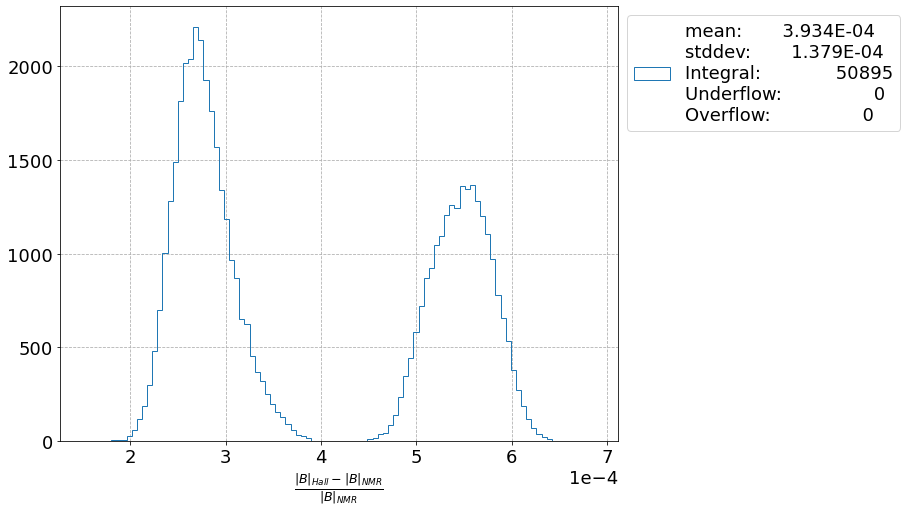

In [26]:
fig, ax = plt.subplots()

x = (df_[f'{probe}_Cal_Bmag']-df_['B_Hall_NMR'])/df_['B_Hall_NMR']
xmi = np.min(x)
xma = np.max(x)
xra = xma-xmi
bins = np.linspace(xmi-0.05*xra, xma+0.05*xra, 100)

ax.hist(x, histtype='step', bins=bins, label=get_label(x, bins=bins));


ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

ax.set_xlabel(r'$\frac{|B|_{Hall} - |B|_{NMR}}{|B|_{NMR}}$');
ax.legend(loc='upper left', bbox_to_anchor=(1.0,1.0));

## v1. Reconstruct single coordinate direction (Bz)

### Voltage Function (using same function for calibration orientation)

In [ ]:
'''
def Hall_Cal_B_gen_v1(axis0, axis1, **params):
    Bmax = params['Bmax']
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=True) # ok
    norm_B_rot = rot.apply(norm_B)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    frac_B = np.dot(norm_B_rot, norm_Hall)
    B_meas = Bmax * frac_B
    if params['verbose'] == 1.:
        return B_meas, norm_Hall, norm_B, norm_B_rot, frac_B
    else:
        return B_meas
'''
# VECTORIZED
def Hall_Cal_B_gen_v1(axis0, axis1, Bmag, **params):
    if not isinstance(axis0, Iterable):
        axis0 = np.array([axis0])
        axis1 = np.array([axis1])
        Bmag = np.array([Bmag])
    # FIXME! Try passing NMR measurements (adjusted with pole-to-pole) in along with axis0, axis1.
#     Bmax = params['Bmax']
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=True) # ok
#     rot = Rotation.from_euler('yz', angles=np.array([-axis0, axis1]).T, degrees=True) # CHECK!
#     rot = Rotation.from_euler('zy', angles=np.array([-axis0, -axis1]).T, degrees=True) # CHECK
    norm_B_rot = rot.apply(np.repeat(norm_B[:, np.newaxis], len(axis0), axis=1).T)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    frac_B = np.dot(norm_B_rot, norm_Hall)
    B_meas = Bmag * frac_B
    if params['verbose'] == 1.:
        return B_meas, norm_Hall, norm_B, norm_B_rot, frac_B
    else:
        return B_meas

In [ ]:
# B aligned perfectly with Kinematic plate
# params = {
#     'Bmax': 1.0, # ~2e6
#     'verbose': 0,
#     'theta': np.radians(2.),
#     #'phi': np.radians(45.),
#     'phi': np.radians(0.),
# #     'phi': np.radians(180.),
#     'alpha': 0.,
#     'beta': 0.
# }

params = {
    'Bmax': 1.0, # ~2e6
    'verbose': 0,
    'theta': np.radians(2.),
    #'phi': np.radians(45.),
    'phi': np.radians(0.),
#     'phi': np.radians(180.),
    'alpha': 0.,
    'beta': np.radians(10.)
}

In [ ]:
ax0s = np.unique(np.round(df_.SmarAct_Meas_Angle_1_Centered, 3))
ax1s = np.unique(np.round(df_.SmarAct_Meas_Angle_2_Centered, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

In [ ]:
ax0s

- 2023-01-15 13:03:19 How to handle the fact that the first data point of the second scan is  missing?
    - Ideally, a step of processing should be to set up an ideal grid, and check specifically for each point. Any points that are missing should be inserted as NaNs.

In [ ]:
for ax0 in ax0s:
    line = df_[np.isclose(df_.SmarAct_Meas_Angle_1_Centered, ax0, atol=1e-2, rtol=1e-3)]
    print(f'ax0: {ax0} [deg], N: {len(line)}')

In [ ]:
#Bs = np.array([Hall_Cal_B_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])
Bs = Hall_Cal_B_gen_v1(A0.flatten(), A1.flatten(), **params)

fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
Bs = df_['Cal_Z'].copy().values
# TEMPORARY FIX!!
Bs = np.concatenate([[np.nan], Bs])

fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
# B aligned perfectly with Kinematic plate
# does phi change anything, or is it only theta that matters?
phis = np.arange(0., 360., 45.)
# phis = [0., 45., 60., 90., 1]
for phi in phis:
    params = {
        'Bmax': 1.0, # ~2e6
        'verbose': 0,
        'theta': np.radians(2.),
#         'theta': np.pi,
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.radians(phi),
        'alpha': np.radians(-2.),
        'beta': 0.
    }
    ax0s = np.unique(np.round(df_.SmarAct_Meas_Angle_1_Centered, 3))
    ax1s = np.unique(np.round(df_.SmarAct_Meas_Angle_2_Centered, 3))
    A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')
    Bs = Hall_Cal_B_gen_v1(A0.flatten(), A1.flatten(), **params)

    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
    cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
    
    ax.set_title(rf'$\theta = {params["theta"]:0.3f}, \phi = {params["phi"]:0.3f}$'+'\n'+
                 rf'$\alpha = {params["alpha"]:0.3f}, \beta = {params["beta"]:0.3f}$')

In [ ]:
# B aligned perfectly with Kinematic plate
# theta dependence (phi = 0)
thetas = np.arange(0., 180., 10.)
# phis = [0., 45., 60., 90., 1]
for theta in thetas:
    params = {
        'Bmax': 1.0, # ~2e6
        'verbose': 0,
        'theta': np.radians(theta),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': 0.,
        'alpha': 0.,
        'beta': 0.
    }
    ax0s = np.unique(np.round(df_.SmarAct_Meas_Angle_1_Centered, 3))
    ax1s = np.unique(np.round(df_.SmarAct_Meas_Angle_2_Centered, 3))
    A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')
#     Bs = np.array([Hall_Cal_B_gen_v1(a0, a1, **params) for a0, a1 in zip(A0.flatten(), A1.flatten())])
    Bs = Hall_Cal_B_gen_v1(A0.flatten(), A1.flatten(), **params)

    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
    cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
    
    ax.set_title(rf'$\theta = {params["theta"]:0.3f}, \phi = {params["phi"]:0.3f}$'+'\n'+
                 rf'$\alpha = {params["alpha"]:0.3f}, \beta = {params["beta"]:0.3f}$')

### Fitting

- See if fit for a single Hall element can constrain all four parameters.
- Since we can physically see the Hall elements, SmarAct in the magnet, approximate field direction, we can be smart about initial conditions and limits, if it turns out it there are many minima.
- If it is not possible, may need to combine Hall elements, or combine measurements from different Hall probes (this would be a reason to do a second Hall probe angular scan ASAP).

In [ ]:
ax0s = np.unique(np.round(df_.SmarAct_Meas_Angle_1_Centered, 3))
ax1s = np.unique(np.round(df_.SmarAct_Meas_Angle_2_Centered, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

In [ ]:
# generate data, with noise
B0 = 1.0
sigma = 1e-4 #2.8e3
params_true = {
        'Bmax': B0, # ~2e6
        'verbose': 0,
        'theta': np.random.uniform(low=0., high=np.pi),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.random.uniform(low=-np.pi, high=np.pi),
        'alpha': np.random.uniform(low=0., high=np.radians(12.)),
        'beta': np.random.uniform(low=-np.pi, high=np.pi)
}
#Bs = np.array([Hall_Cal_B_gen_v1(a0, a1, **params_true) for a0, a1 in zip(A0.flatten(), A1.flatten())])
Bs = Hall_Cal_B_gen_v1(A0.flatten(), A1.flatten(), **params)
Bs_meas = Bs + np.random.normal(loc=0, scale=sigma, size=len(Bs)) # ~0.1% noise

In [ ]:
params_true

In [ ]:
Bs, Bs_meas

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
fig, ax = plt.subplots()
sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T] -- SIMULATED')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
# fit!
model = lm.Model(Hall_Cal_B_gen_v1, independent_vars=['axis0', 'axis1'])
params = lm.Parameters()
# fixed parameters
# params.add('Bmax', value=B0, vary=False)
params.add('Bmax', value=B0, vary=True)
params.add('verbose', value=0., vary=False)
# parameters to vary
params.add('theta', value=np.pi/2, min=0., max=np.pi)
params.add('phi', value=0., min=-np.pi, max=np.pi)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
params.add('alpha', value=np.radians(2), min=0., max=np.radians(12.))
params.add('beta', value=0., min=-np.pi, max=np.pi)
# run fit
result = model.fit(Bs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
                   params=params, weights=1/(sigma*np.ones_like(Bs_meas)), scale_covar=False)

In [ ]:
B0

In [ ]:
result

In [ ]:
params_true

### Fit on real data!

In [ ]:
B0 = df[f'Cal_Z'].abs().max()

In [ ]:
B0

In [ ]:
sigma_est = 3e-5
#sigma_est = 1e-4
# sigma_est = 1e-3
coord = 'Z'
# coord = 'X'
# coord = 'Y'
B0 = df[f'Cal_{coord}'].abs().max()
Bs_meas = df[f'Cal_{coord}'].values
# fit!
model = lm.Model(Hall_Cal_B_gen_v1, independent_vars=['axis0', 'axis1', 'Bmag'])
params = lm.Parameters()
# fixed parameters
#params.add('Bmax', value=B0, vary=True)
# params.add('Bmax', value=1.00212872, vary=False)
params.add('verbose', value=0., vary=False)
# parameters to vary
# params.add('theta', value=np.pi/2, min=0. - np.pi/4, max=np.pi + np.pi/4)
# params.add('theta', value=np.pi/2, min=0., max=np.pi + np.pi/4) # GOOD
params.add('theta', value=0.01475871, vary=False)
# params.add('theta', value=0.02, min=0., max=np.pi + np.pi/4) # based on previous scans
# params.add('phi', value=0., min=-np.pi, max=np.pi) # GOOD
params.add('phi', value=3.06398294, vary=False)
## TURN OFF THETA / PHI (Hall orientation on the plate)
# params.add('theta', value=0., vary=True)
# params.add('phi', value=0., vary=False)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
# params.add('alpha', value=np.radians(2), min=np.radians(-4.), max=np.radians(12.))
# params.add('alpha', value=np.radians(2), min=0., max=np.radians(12.)) # GOOD
params.add('alpha', value=0.03490732, vary=False) # GOOD
# params.add('beta', value=0., min=-np.pi - np.pi/4, max=np.pi + np.pi/4, vary=True)
# params.add('beta', value=3.0, min=-np.pi, max=np.pi, vary=True)
#params.add('beta', value=np.pi, min=0., max=2*np.pi, vary=True) # GOOD
params.add('beta', value=2.74794549, vary=False) # GOOD
# best fit alpha and beta
# params.add('alpha', value=0.03240273, vary=False)
# params.add('beta', value=-3.14159265, vary=False)

### NOT SURE THAT THESE WORK ON THEIR OWN
# phi for X (really Y)
# if coord == 'X':
#     params.add('phi', value=-np.pi/2, vary=True, min=-np.pi/2 + np.radians(-10), max=-np.pi/2 + np.radians(10))
# phi for Y (really X)
# if coord == 'Y':
#     params.add('phi', value=0., vary=True, min=np.radians(-10), max=np.radians(10))

# run fit
#result = model.fit(Bs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
#                   params=params, weights=1/(sigma_est*B0*np.ones_like(Bs_meas)), scale_covar=False)
###
# result = model.fit(Bs_meas, axis0=df['SmarAct_Meas_Angle_1_Centered'].values, axis1=df['SmarAct_Meas_Angle_2_Centered'].values,
#                   params=params, weights=1/(sigma_est*B0*np.ones_like(Bs_meas)), scale_covar=False)
# add Bmag
result = model.fit(Bs_meas, axis0=df['SmarAct_Meas_Angle_1_Centered'].values, axis1=df['SmarAct_Meas_Angle_2_Centered'].values,
                   Bmag=df[f'{probe}_Cal_Bmag'].values,
                   params=params, weights=1/(sigma_est*B0*np.ones_like(Bs_meas)), scale_covar=False)
result_Zcoord = result

In [ ]:
632 / 14644

In [ ]:
B0

In [ ]:
# scan 5 (incomplete)
# only can get a good fit result if I fix alpha/beta to be the best fit values (used scan 3 values)
result_Zcoord

In [ ]:
# scan 4
result_Zcoord

In [ ]:
# scan 3
result_Zcoord

In [ ]:
-3.5352 + 2*np.pi

In [ ]:
# scan 2
result

In [ ]:
np.degrees(0.011)

In [ ]:
def normalize_angle(angle, degrees=False):
    if degrees:
        angle_rad = np.radians(angle)
        return np.degrees(np.arctan2(np.sin(angle_rad), np.cos(angle_rad)))
    else:
        return np.arctan2(np.sin(angle), np.cos(angle))

def normalize_polar_angle(angle, degrees=False):
    if degrees:
        angle_rad = np.radians(angle)
        return np.degrees(np.arccos(np.cos(angle_rad)))
    else:
        return np.arccos(np.cos(angle))

In [ ]:
for k in result.params.keys():
    print(k, result.params[k].value, normalize_angle(result.params[k].value), normalize_polar_angle(result.params[k].value))

In [ ]:
if not np.isclose(normalize_angle(result.params['theta'].value), normalize_polar_angle(result.params['theta'].value)):
    print('Phi flipped')
    print(f'Phi0: {result.params["phi"].value}, Phi0 + pi: {normalize_angle(result.params["phi"].value+np.pi)}')

In [ ]:
if not np.isclose(normalize_angle(result.params['alpha'].value), normalize_polar_angle(result.params['alpha'].value)):
    print('Beta flipped')
    print(f'Beta0: {result.params["beta"].value}, Beta0 + pi: {normalize_angle(result.params["beta"].value+np.pi)}')

In [ ]:
np.degrees(result.params['theta'])

In [ ]:
np.degrees(result.params['phi'])

In [ ]:
np.degrees(result.params['alpha'])

In [ ]:
np.degrees(result.params['beta'])

In [ ]:
result.best_fit

In [ ]:
# plots!
from matplotlib.colors import Normalize
import matplotlib.cm as cm

In [ ]:
Bmin = np.min([np.min(df[f'Cal_{coord}']), np.min(result.best_fit)])
Bmax = np.max([np.max(df[f'Cal_{coord}']), np.max(result.best_fit)])

In [ ]:
Bmin, Bmax

In [ ]:
# data, fit
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 8))
cmap = cm.get_cmap('viridis')
normalizer = Normalize(Bmin, Bmax)
im = cm.ScalarMappable(norm=normalizer)
# sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4, cmap=cmap, norm=normalizer)
# sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

sc = axs[0].scatter(df['SmarAct_Meas_Angle_1_Centered'].values, df['SmarAct_Meas_Angle_2_Centered'].values, c=Bs_meas, s=4, cmap=cmap, norm=normalizer)
sc1 = axs[1].scatter(df['SmarAct_Meas_Angle_1_Centered'].values, df['SmarAct_Meas_Angle_2_Centered'].values, c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

cb = fig.colorbar(im, label=r'$B_z$ [T]')

axs[0].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[0].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[0].set_title('Measured Values')
axs[1].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[1].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[1].set_title('Best Fit Values: \n'+
                 rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
                 rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f}$')

In [ ]:
# data - fit
fig, ax = plt.subplots(figsize=(12, 8))
cmap = cm.get_cmap('viridis')
# normalizer = Normalize(Bmin, Bmax)
# im = cm.ScalarMappable(norm=normalizer)
# sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4, cmap=cmap, norm=normalizer)
# sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

sc = ax.scatter(df['SmarAct_Meas_Angle_1_Centered'].values, df['SmarAct_Meas_Angle_2_Centered'].values, c=Bs_meas-result.best_fit, s=4, cmap=cmap)#, norm=normalizer)

cb = fig.colorbar(sc, label=rf'$B_{coord}$ [T]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [deg]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [deg]')
ax.set_title('Measured Values - Best Fit Values: \n'+
             rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
             rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f}$')

In [ ]:
# hist
fig, ax = plt.subplots()

bins = np.arange(-1.50e-4, 1.52e-4, 2e-6)
# bins = np.arange(-5.0e-5, 5.05e-5, 5e-7) # for good scans
# bins = np.arange(-5.0e-3, 5.05e-3, 5e-5) # wide search for large residuals

ax.hist(Bs_meas-result.best_fit, bins=bins, histtype='step', label=get_label(Bs_meas-result.best_fit, bins))

ax.set_xlabel(rf'Data - Fit, $B_{coord}$ [T]')
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))
ax.legend(loc='upper left', bbox_to_anchor=(0.6, 1.0));

In [ ]:
# residual vs time
fig, ax = plt.subplots()

#bins = np.arange(-1.50e-4, 1.52e-4, 2e-6)
# bins = np.arange(-5.0e-5, 5.05e-5, 5e-7) # for good scans
# bins = np.arange(-5.0e-3, 5.05e-3, 5e-5) # for good scans

ax.scatter(df.index, Bs_meas-result.best_fit)

ax.set_xlabel('Datetime')
ax.set_ylabel(rf'Data - Fit, $B_{coord}$ [T]')
ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0));
# ax.legend(loc='upper left', bbox_to_anchor=(0.6, 1.0));

In [ ]:
# how about transverse field?
#BT_fit = (result_Zcoord.params['Bmax'].value**2 - result_Zcoord.best_fit**2)**(1/2)
BT_fit = (df[f'{probe}_Cal_Bmag'].values**2 - result_Zcoord.best_fit**2)**(1/2)
BT_meas = np.linalg.norm(df[['Cal_X', 'Cal_Y']].values, axis=1)

In [ ]:
# data - fit
fig, ax = plt.subplots(figsize=(12, 8))
cmap = cm.get_cmap('viridis')
# normalizer = Normalize(Bmin, Bmax)
# im = cm.ScalarMappable(norm=normalizer)
# sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4, cmap=cmap, norm=normalizer)
# sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

sc = ax.scatter(df['SmarAct_Meas_Angle_1_Centered'].values, df['SmarAct_Meas_Angle_2_Centered'].values, c=BT_meas-BT_fit, s=4, cmap=cmap)#, norm=normalizer)

cb = fig.colorbar(sc, label=r'$\Delta B_{T}$ [T]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [deg]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [deg]')
ax.set_title('Measured Values - Best Fit Values: \n'+
             rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
             rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f}$')

In [ ]:
# hist
fig, ax = plt.subplots()

# bins = np.arange(-1.50e-4, 1.52e-4, 2e-6)
bins = np.arange(-1.50e-3, 1.52e-3, 2e-5)

ax.hist(BT_meas-BT_fit, bins=bins, histtype='step', label=get_label(BT_meas-BT_fit, bins))

ax.set_xlabel(r'Data - Fit, $B_{T}$ [T]')
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))
ax.legend(loc='upper left', bbox_to_anchor=(0.6, 1.0));

In [ ]:
BT_meas

In [ ]:
BT_fit

In [ ]:
df[['Cal_X', 'Cal_Y']].values.shape

In [ ]:
BT_fit

- I think I need to go from here... 2023-01-15 13:15:40 
    - Next step is probably getting theta / phi from SmarAct angles.
    - Or looking at other fitting metrics

In [ ]:
### BELOW ISN'T USEFUL, I THINK

In [ ]:
# Bergsma fit
fig, ax = plt.subplots()

ax.scatter(df['NMR [T]'], df[f'{probe}_Cal_Bmag'], s=1)

In [ ]:
# Bergsma fit
fig, ax = plt.subplots()

ax.scatter(df.index, df[f'{probe}_Cal_Bmag']-df['NMR [T]'], s=1)

In [ ]:
fig, ax = plt.subplots()

ax.hist((df[f'{probe}_Cal_Bmag']-df['NMR [T]'])/df['NMR [T]'], histtype='step', bins=100);

In [ ]:
res_rel = (df[f'{probe}_Cal_Bmag']-df['NMR [T]'])/df['NMR [T]']
res_rel.mean(), res_rel.std()

In [ ]:
# check NMR and temp stability
for col in ['NMR [T]', f'{probe}_Cal_T']:
    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=df[col], s=4);
    cb = fig.colorbar(sc, label=col)

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
result.params['theta'].value

In [ ]:
# data - fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=Bs_meas - result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$B_z$ [T]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data - Fit');

In [ ]:
# data / fit
fig, ax = plt.subplots()
sc = ax.scatter(a1, a2, c=Bs_meas / result.best_fit, s=4);
cb = fig.colorbar(sc, label=r'$B_{z, meas.} / B_{z, fit}$')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
ax.set_title('Data / Fit');

In [ ]:
# histograms

In [ ]:
len(Bs_meas)

In [ ]:
fig, ax = plt.subplots()

ax.hist(Bs_meas - result.best_fit, bins=100, histtype='step')

ax.set_xlabel(r'Data - Fit [T]')

In [ ]:
np.mean(Bs_meas - result.best_fit), np.std(Bs_meas - result.bes.t_fit, ddof=1)

In [ ]:
fig, ax = plt.subplots()

ax.hist(Bs_meas / result.best_fit, bins=100, histtype='step')

ax.set_xlabel(r'Data / Fit')

In [ ]:
np.mean(Bs_meas / result.best_fit), np.std(Bs_meas / result.best_fit, ddof=1)

## v2. Reconstruct all coordinates at once

### Voltage Function (using same function for calibration orientation)

In [27]:
'''
def Hall_Cal_B_gen_v2(axis0, axis1, **params):
    if not isinstance(axis0, Iterable):
        axis0 = np.array([axis0])
        axis1 = np.array([axis1])
    # FIXME! Try passing NMR measurements (adjusted with pole-to-pole) in along with axis0, axis1.
    Bmax = params['Bmax']
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=True) # ok
#     rot = Rotation.from_euler('zy', angles=np.array([-axis0, -axis1]).T, degrees=True) # CHECK
    norm_B_rot = rot.apply(np.repeat(norm_B[:, np.newaxis], len(axis0), axis=1).T)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    costh = np.dot(norm_B_rot, norm_Hall)
    #sinth = np.sin(np.arccos(costh))
    B_T = np.linalg.norm(norm_B_rot[:,:2], axis=1)
    theta = np.arctan2(B_T, norm_B_rot[:,2])
    phi = np.arctan2(norm_B_rot[:, 1], norm_B_rot[:, 0]) + params['phase']
    Bx = Bmax * np.sin(theta) * np.cos(phi)
    By = Bmax * np.sin(theta) * np.sin(phi)
    Bz = Bmax * np.cos(theta)
#     print(Bx, By, Bz)
#     try:
    B_meas = np.concatenate([Bx, By, Bz])
#     except:
#         B_meas = np.array([Bx, By, Bz])
    if params['verbose'] == 1.:
        return B_meas, norm_Hall, norm_B, norm_B_rot, theta, phi
    else:
        return B_meas
'''

'''
# rotate Bvector into Hall probe frame
def rodrigues_rotation(points, vec0, vec1):
    # points should be N x 3
    # rotate from vec0 to vec1
    # note vec0 and vec1 should be normalized
    k_vec = np.cross(vec0, vec1)
    k_vec = k_vec / np.linalg.norm(k_vec)
    costheta = np.dot(vec0, vec1)
    sintheta = (1-costheta**2)**(1/2)
    points_rot = points * costheta + np.cross(k_vec, points) * sintheta + np.outer(np.dot(points, k_vec), k_vec) * (1 - costheta)
    return points_rot
'''

def Hall_Cal_B_gen_v2(axis0, axis1, Bmag, **params):
    if not isinstance(axis0, Iterable):
        axis0 = np.array([axis0])
        axis1 = np.array([axis1])
        Bmag = np.array([Bmag])
    # FIXME! Try passing NMR measurements (adjusted with pole-to-pole) in along with axis0, axis1.
#     Bmax = params['Bmax']
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # x_Hall is arbitary...
    x_Hall = np.array([-np.sin(params['phi']), np.cos(params['phi']), 0.])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]), degrees=False) # ok
    #rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=False) # ok
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=True) # ok
#     rot = Rotation.from_euler('yz', angles=np.array([-axis0, axis1]).T, degrees=True) # CHECK!
    norm_B_rot = rot.apply(np.repeat(norm_B[:, np.newaxis], len(axis0), axis=1).T)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    costh = np.dot(norm_B_rot, norm_Hall)
    sinth = (1 - costh**2)**(1/2)
    theta = np.arccos(costh)
    BT_rot90 = np.cross(norm_B_rot, norm_Hall)
    BT_rot90 = BT_rot90 / np.linalg.norm(BT_rot90, axis=1)[:, None]
    BT_rot = np.cross(norm_Hall, BT_rot90)
#     BT_rot = np.cross(norm_B_rot, norm_Hall)
    # must normalize BT_rot
    BT_rot = BT_rot / np.linalg.norm(BT_rot, axis=1)[:, None]
#     phi_Hall = np.arccos(np.dot(BT_rot, x_Hall)) + params['phase']
    phi_Hall = np.arccos(np.dot(BT_rot, x_Hall))
    sign_phi = 2*(np.dot(np.cross(x_Hall, BT_rot), norm_Hall) > 0.).astype(int) - 1.
#     sign_phi = 2*(np.dot(np.cross(x_Hall, BT_rot), norm_Hall) < 0.).astype(int) - 1.
#     phi_Hall = sign_phi * phi_Hall
    phi_Hall = sign_phi * phi_Hall + params['phase']
    # recenter phi
    phi_Hall[phi_Hall > np.pi] = phi_Hall[phi_Hall > np.pi] - 2*np.pi
    phi_Hall[phi_Hall < -np.pi] = phi_Hall[phi_Hall < -np.pi] + 2*np.pi
    ###
    Bx = Bmag * sinth * np.cos(phi_Hall)
    By = Bmag * sinth * np.sin(phi_Hall)
    Bz = Bmag * costh
    B_meas = np.concatenate([Bx, By, Bz])
    if params['verbose'] == 1.:
        return B_meas, norm_Hall, norm_B, norm_B_rot, BT_rot, theta, phi_Hall
    else:
        return B_meas

In [28]:
def Hall_Cal_B_gen_v2(axis0, axis1, Bmag, **params):
    if not isinstance(axis0, Iterable):
        axis0 = np.array([axis0])
        axis1 = np.array([axis1])
        Bmag = np.array([Bmag])
    # calculate normal vectors
    # Hall element is w.r.t. "SmarAct coordinates" (or better, Kinematic plate coordinates) and is fixed, regardless of axis0, axis1
    norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
    # x_Hall is arbitary...
    x_Hall = np.array([-np.sin(params['phi']), np.cos(params['phi']), 0.])
    # B field has some nominal orientation w.r.t. kinematic plate, and is further rotated by axis0, axis1
    norm_B = np.array([np.sin(params['alpha'])*np.cos(params['beta']), np.sin(params['alpha'])*np.sin(params['beta']), np.cos(params['alpha'])])
    # rotate the field vector w.r.t.
    rot = Rotation.from_euler('yz', angles=np.array([-axis0, -axis1]).T, degrees=True) # ok
    norm_B_rot = rot.apply(np.repeat(norm_B[:, np.newaxis], len(axis0), axis=1).T)
    # calculate signed fraction of B vector along Hall normal i.e. Hall only reads perpendicular field (to first order)
    costh = np.dot(norm_B_rot, norm_Hall)
    sinth = (1 - costh**2)**(1/2)
    theta = np.arccos(costh)
    BT_rot90 = np.cross(norm_B_rot, norm_Hall)
    BT_rot90 = BT_rot90 / np.linalg.norm(BT_rot90, axis=1)[:, None]
    BT_rot = np.cross(norm_Hall, BT_rot90)
    # must normalize BT_rot
    BT_rot = BT_rot / np.linalg.norm(BT_rot, axis=1)[:, None]
    phi_Hall = np.arccos(np.dot(BT_rot, x_Hall))
    sign_phi = 2*(np.dot(np.cross(x_Hall, BT_rot), norm_Hall) > 0.).astype(int) - 1.
    phi_Hall = sign_phi * phi_Hall + params['phase']
    # recenter phi
    phi_Hall[phi_Hall > np.pi] = phi_Hall[phi_Hall > np.pi] - 2*np.pi
    phi_Hall[phi_Hall < -np.pi] = phi_Hall[phi_Hall < -np.pi] + 2*np.pi
    ###
    Bx = Bmag * sinth * np.cos(phi_Hall)
    By = Bmag * sinth * np.sin(phi_Hall)
    Bz = Bmag * costh
    B_meas = np.concatenate([Bx, By, Bz])
    if params['verbose'] == 1.:
        return B_meas, norm_Hall, norm_B, norm_B_rot, BT_rot, theta, phi_Hall
    else:
        return B_meas

### Test

In [ ]:
params= {'theta': np.radians(15.), 'phi': np.radians(-5.)}
norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
# x_Hall is arbitary...
x_Hall = np.array([-np.sin(params['phi']), np.cos(params['phi']), 0.])

In [ ]:
norm_Hall, x_Hall

In [ ]:
np.dot(norm_Hall, x_Hall)

In [ ]:
params= {'theta': np.radians(15.), 'phi': np.radians(-5.)}
norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])
norm_B_rot = np.array([[0, 1, 2], [3, 4, 5], [6, 7,8], [9, 10, 11]])

In [ ]:
norm_B_rot, norm_Hall

In [ ]:
np.cross(norm_B_rot, norm_Hall)

In [ ]:
np.cross(norm_B_rot[3], norm_Hall)

In [ ]:
np.cross(norm_Hall, np.cross(norm_B_rot, norm_Hall))

In [ ]:
np.cross(norm_Hall, np.cross(norm_B_rot[3], norm_Hall))

In [ ]:
np.dot(norm_B_rot, norm_Hall)

In [ ]:
np.dot(norm_B_rot[3], norm_Hall)

In [ ]:
phi

In [ ]:
np.ptp(phi)

### Fitting

- See if fit works to constrain all five parameters.

In [ ]:
ax0s = np.unique(np.round(df_.SmarAct_Meas_Angle_1_Centered, 3))
ax1s = np.unique(np.round(df_.SmarAct_Meas_Angle_2_Centered, 3))
A0, A1 = np.meshgrid(ax0s, ax1s, indexing='ij')

In [ ]:
ax0s

In [ ]:
# generate data, with noise
B0 = 1.0
sigma = 3e-5
params_true = {
        'Bmax': B0, # ~2e6
        'verbose': 1,
        #'theta': np.random.uniform(low=0., high=np.pi),
        'theta': np.random.uniform(low=0., high=np.pi/8.),
        #'phi': np.radians(45.),
    #     'phi': np.radians(0.),
        'phi': np.random.uniform(low=-np.pi, high=np.pi),
        #'alpha': np.random.uniform(low=0., high=np.radians(12.)),
        'alpha': np.random.uniform(low=0., high=np.pi/8.),
        'beta': np.random.uniform(low=-np.pi, high=np.pi),
        'phase': np.random.uniform(low=-np.pi, high=np.pi)
}
Bmags = B0 * np.ones_like(A0.flatten())


#Bs = np.array([Hall_Cal_B_gen_v2(a0, a1, **params_true) for a0, a1 in zip(A0.flatten(), A1.flatten())])
# Bs = Hall_Cal_B_gen_v2(A0.flatten(), A1.flatten(), **params_true)
Bs, norm_Hall, norm_B, norm_B_rot, BT_rot, theta, phi = Hall_Cal_B_gen_v2(A0.flatten(), A1.flatten(), Bmags, **params_true)
Bs_meas = Bs + np.random.normal(loc=0, scale=sigma, size=Bs.shape) # ~0.1% noise

N = len(A0.flatten())
Bxs = Bs[:N]
Bys = Bs[N:2*N]
Bzs = Bs[2*N:]

Bxs_meas = Bs_meas[:N]
Bys_meas = Bs_meas[N:2*N]
Bzs_meas = Bs_meas[2*N:]

In [ ]:
np.linalg.norm(BT_rot, axis=1)

In [ ]:
np.linalg.norm(norm_B_rot, axis=1)

In [ ]:
np.linalg.norm(norm_B_rot, axis=1)

In [ ]:
norm_Hall = np.array([np.sin(params['theta'])*np.cos(params['phi']), np.sin(params['theta'])*np.sin(params['phi']), np.cos(params['theta'])])

In [ ]:
np.linalg.norm(norm_Hall)

In [ ]:
np.linalg.norm(np.cross(norm_B_rot, norm_Hall), axis=1)

In [ ]:
np.ptp(phi)

In [ ]:
np.pi*2

In [ ]:
theta

In [ ]:
params_true

In [ ]:
Bs, Bs_meas

In [ ]:
for Bs_, l in zip([Bxs, Bys, Bzs], ['x', 'y', 'z']):
    fig, ax = plt.subplots()
    sc = ax.scatter(A0.flatten(), A1.flatten(), c=Bs_, s=4);
    cb = fig.colorbar(sc, label=rf'$B_{l}$ [T] -- SIMULATED')

    ax.set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
    ax.set_ylabel('Angle 2 (i.e. Axis 1) [rad]');

In [ ]:
# fit!
model = lm.Model(Hall_Cal_B_gen_v2, independent_vars=['axis0', 'axis1'])
params = lm.Parameters()
# fixed parameters
# params.add('Bmax', value=B0, vary=False)
params.add('Bmax', value=B0, vary=True)
params.add('verbose', value=0., vary=False)
# parameters to vary
params.add('theta', value=np.pi/2, min=0., max=np.pi)
params.add('phi', value=0., min=-np.pi, max=np.pi)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
params.add('alpha', value=np.radians(2), min=0., max=np.radians(12.))
params.add('beta', value=0., min=-np.pi, max=np.pi)
params.add('phase', value=0., min=-np.pi, max=np.pi)
# run fit
result = model.fit(Bs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
                   params=params, weights=1/(sigma*np.ones_like(Bs_meas)), scale_covar=False)

In [ ]:
B0

In [ ]:
result

In [ ]:
params_true

### Fit on real data!

In [29]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],2F0000000D5EC73A_Raw_X,2F0000000D5EC73A_Raw_Y,2F0000000D5EC73A_Raw_Z,2F0000000D5EC73A_Raw_T,2F0000000D5EC73A_Cal_X,...,SmarAct_Meas_Angle_1_Centered,SmarAct_Meas_Angle_2_Centered,B_Hall_NMR,Cal_X,Cal_Y,Cal_Z,Cal_Bmag,Cal_Trans,Cal_Theta,Cal_Phi
Datetime,,,,,,,,,,,,,,,,,,,,,
2023-01-16 08:59:14,1/16/2023 8:59:14 AM,180.531953,21.194067,1.002062,0.0,135204.0,322328.0,-2787348.0,20148.0,0.994923,...,-9.499997,-179.000005,1.001821,0.113290,-0.037458,0.994923,1.002053,0.119322,0.118520,-0.319321
2023-01-16 08:59:22,1/16/2023 8:59:22 AM,180.531897,21.194100,1.002062,0.0,141441.0,320305.0,-2787386.0,20143.0,0.994960,...,-9.500027,-177.999993,1.001821,0.112542,-0.039733,0.994960,1.002093,0.119350,0.118542,-0.339391
2023-01-16 08:59:30,1/16/2023 8:59:30 AM,180.532010,21.193967,1.002062,0.0,147215.0,318007.0,-2787392.0,20143.0,0.994988,...,-9.500005,-177.000000,1.001821,0.111695,-0.041834,0.994988,1.002112,0.119272,0.118463,-0.358366
2023-01-16 08:59:38,1/16/2023 8:59:38 AM,180.531897,21.193883,1.002062,0.0,153200.0,315641.0,-2787264.0,20143.0,0.994971,...,-9.499996,-176.000001,1.001821,0.110823,-0.044013,0.994971,1.002091,0.119242,0.118437,-0.378042
2023-01-16 08:59:46,1/16/2023 8:59:46 AM,180.531897,21.193767,1.002062,0.0,159215.0,313148.0,-2787195.0,20137.0,0.994972,...,-9.500003,-175.000004,1.001821,0.109904,-0.046200,0.994972,1.002089,0.119220,0.118414,-0.397939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-22 23:59:25,1/22/2023 11:59:25 PM,180.532577,21.309517,1.001629,0.0,30025.0,127458.0,-2785324.0,34816.0,1.000731,...,-4.999999,172.999997,1.001388,0.042906,0.003649,1.000731,1.001657,0.043061,0.042963,0.084832
2023-01-22 23:59:33,1/22/2023 11:59:33 PM,180.532577,21.309483,1.001629,0.0,32719.0,127239.0,-2785339.0,34826.0,1.000748,...,-5.000015,174.000002,1.001388,0.042820,0.002651,1.000748,1.001667,0.042902,0.042805,0.061826
2023-01-22 23:59:42,1/22/2023 11:59:42 PM,180.532690,21.309383,1.001629,0.0,35348.0,126992.0,-2785248.0,34829.0,1.000725,...,-5.000022,174.999999,1.001388,0.042724,0.001677,1.000725,1.001638,0.042757,0.042662,0.039234


In [30]:
# do we query a particular run?
# df_ = df.copy() # no
df_ = df.query('"01-16-23 08:55" <= Datetime <= "01-18-23 15:25"').copy() # yes, query run 3.
#df_ = df.query('("01-16-23 08:55" <= Datetime <= "01-18-23 15:25") or ("01-22-23 06:37" <= Datetime)').copy() # yes, query run 3 and 5
# df_ = df.query('("01-16-23 08:55" <= Datetime <= "01-18-23 15:25") or ("01-22-23 06:37" >= Datetime)').copy() # yes, query run 3 and 4

In [31]:
sigma_est = 3e-5
# sigma_est = 1e-4
# sigma_est = 1e-3
# coord = 'Z'
# coord = 'X'
# coord = 'Y'
#B0 = df[f'Cal_{coord}'].abs().max()
B0 = df_['B_Hall_NMR'].mean()
Bs_meas = np.concatenate([df_[f'Cal_{coord}'].values for coord in ['X', 'Y', 'Z']])
# fit!
model = lm.Model(Hall_Cal_B_gen_v2, independent_vars=['axis0', 'axis1', 'Bmag'])
params = lm.Parameters()
# '''
# fixed parameters
# params.add('Bmax', value=B0, vary=True, min=0.5, max=1.5)
# params.add('Bmax', value=B0, vary=False)
# params.add('Bmax', value=1.00212872, vary=False)
params.add('verbose', value=0., vary=False)
# parameters to vary
# params.add('theta', value=np.pi/2, min=0. - np.pi/4, max=np.pi + np.pi/4)
params.add('theta', value=np.radians(2), min=0., max=np.radians(5.))
params.add('phi', value=0., min=-np.pi, max=np.pi)
# params.add('alpha', value=np.pi/2, min=0., max=np.pi)
# params.add('alpha', value=np.radians(2), min=np.radians(-4.), max=np.radians(12.))
params.add('alpha', value=np.radians(2), min=0., max=np.radians(5.))
# params.add('alpha', value=-0.03523667, vary=False)
# params.add('beta', value=0., min=-np.pi - np.pi/4, max=np.pi + np.pi/4, vary=True)
# params.add('beta', value=0., min=-np.pi, max=np.pi, vary=True)
params.add('beta', value=np.pi, min=0., max=2*np.pi, vary=True)
# params.add('beta', value=-0.40267806, vary=False,)
params.add('phase', value=0., min=-np.pi, max=np.pi)
# best fit alpha and beta
# params.add('alpha', value=0.03240273, vary=False)
# params.add('beta', value=-3.14159265, vary=False)
# '''

'''
# var = False
var = True
params.add('verbose', value=0., vary=False)
# params.add('Bmax', value=result_Zcoord.params['Bmax'].value, vary = False)
params.add('theta', value=result_Zcoord.params['theta'].value, vary = var)
params.add('phi', value=result_Zcoord.params['phi'].value, vary = var)
params.add('alpha', value=result_Zcoord.params['alpha'].value, vary = var)
params.add('beta', value=result_Zcoord.params['beta'].value, vary = var)
params.add('phase', value=0., min=-np.pi, max=np.pi, vary=var)
'''

### NOT SURE THAT THESE WORK ON THEIR OWN
# phi for X (really Y)
# if coord == 'X':
#     params.add('phi', value=-np.pi/2, vary=True, min=-np.pi/2 + np.radians(-10), max=-np.pi/2 + np.radians(10))
# phi for Y (really X)
# if coord == 'Y':
#     params.add('phi', value=0., vary=True, min=np.radians(-10), max=np.radians(10))

# run fit
#result = model.fit(Bs_meas, axis0=A0.flatten(), axis1=A1.flatten(),
#                   params=params, weights=1/(sigma_est*B0*np.ones_like(Bs_meas)), scale_covar=False)
####
# result = model.fit(Bs_meas, axis0=df['SmarAct_Meas_Angle_1_Centered'].values, axis1=df['SmarAct_Meas_Angle_2_Centered'].values,
#                   params=params, weights=1/(sigma_est*B0*np.ones_like(Bs_meas)), scale_covar=False)
# adding Bmag
result = model.fit(Bs_meas, axis0=df_['SmarAct_Meas_Angle_1_Centered'].values, axis1=df_['SmarAct_Meas_Angle_2_Centered'].values,
                   Bmag=df_[f'{probe}_Cal_Bmag'].values, params=params, weights=1/(sigma_est*B0*np.ones_like(Bs_meas)), scale_covar=False)

In [32]:
# scan 3 fit
result

In [ ]:
# scan 3-5 simulataneous fit
result

In [ ]:
# scan 3 & 4 simulataneous fit
result

In [ ]:
# scan 3 & 5 simulataneous fit
result

In [ ]:
# scan 3-5 simulataneous fit
result

In [ ]:
# old scan
result

In [ ]:
# scan 3-5 simulataneous fit
# query only scan 3.
result

In [ ]:
# scan 3-5 simulataneous fit
result

In [ ]:
# scan 5 (incomplete)
result

In [ ]:
# scan 4
result

In [ ]:
# scan 3
result

In [ ]:
np.sin(result.params['theta']) * np.cos(result.params['phi']), np.sin(result.params['theta']) * np.sin(result.params['phi']), np.cos(result.params['theta'])

In [ ]:
np.degrees(1.07236) + 180

In [ ]:
result_Zcoord

In [ ]:
np.degrees(0.011)

In [33]:
def normalize_angle(angle, degrees=False):
    if degrees:
        angle_rad = np.radians(angle)
        return np.degrees(np.arctan2(np.sin(angle_rad), np.cos(angle_rad)))
    else:
        return np.arctan2(np.sin(angle), np.cos(angle))

def normalize_polar_angle(angle, degrees=False):
    if degrees:
        angle_rad = np.radians(angle)
        return np.degrees(np.arccos(np.cos(angle_rad)))
    else:
        return np.arccos(np.cos(angle))

In [34]:
for k in result.params.keys():
    print(k, result.params[k].value, normalize_angle(result.params[k].value), normalize_polar_angle(result.params[k].value))

verbose 0.0 0.0 0.0
theta 0.014989903387307855 0.014989903387307855 0.01498990338730731
phi 3.0648146407613597 3.0648146407613597 3.06481464076136
alpha 0.03489199237187584 0.03489199237187584 0.0348919923718749
beta 2.749075749844544 2.749075749844544 2.749075749844544
phase 1.0723583336594071 1.0723583336594071 1.0723583336594071


In [35]:
if not np.isclose(normalize_angle(result.params['theta'].value), normalize_polar_angle(result.params['theta'].value)):
    print('Phi flipped')
    print(f'Phi0: {result.params["phi"].value}, Phi0 + pi: {normalize_angle(result.params["phi"].value+np.pi)}')

In [36]:
if not np.isclose(normalize_angle(result.params['alpha'].value), normalize_polar_angle(result.params['alpha'].value)):
    print('Beta flipped')
    print(f'Beta0: {result.params["beta"].value}, Beta0 + pi: {normalize_angle(result.params["beta"].value+np.pi)}')

In [ ]:
np.degrees(result.params['theta'])

In [ ]:
np.degrees(result.params['phi'])

In [ ]:
np.degrees(result.params['alpha'])

In [ ]:
np.degrees(result.params['beta'])

In [ ]:
result.best_fit

In [37]:
# plots!
from matplotlib.colors import Normalize
import matplotlib.cm as cm

In [ ]:
#N = len(df)
N = len(df_)
### X
# coord = 'X'
# ind0 = 0
# ind1 = 1*N
### Y
coord = 'Y'
ind0 = 1*N
ind1 = 2*N
### Z
# coord = 'Z'
# ind0 = 2*N
# ind1 = 3*N
####
bf = result.best_fit[ind0:ind1]

Bmin = np.min([np.min(df[f'Cal_{coord}']), np.min(bf)])
Bmax = np.max([np.max(df[f'Cal_{coord}']), np.max(bf)])

In [ ]:
Bmin, Bmax

In [ ]:
# data, fit
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24, 8))
cmap = cm.get_cmap('viridis')
normalizer = Normalize(Bmin, Bmax)
im = cm.ScalarMappable(norm=normalizer)
# sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4, cmap=cmap, norm=normalizer)
# sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

sc = axs[0].scatter(df_['SmarAct_Meas_Angle_1_Centered'].values, df_['SmarAct_Meas_Angle_2_Centered'].values, c=Bs_meas[ind0:ind1], s=4, cmap=cmap, norm=normalizer)
sc1 = axs[1].scatter(df_['SmarAct_Meas_Angle_1_Centered'].values, df_['SmarAct_Meas_Angle_2_Centered'].values, c=bf, s=4, cmap=cmap, norm=normalizer)

cb = fig.colorbar(im, label=rf'$B_{coord}$ [T]')

axs[0].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[0].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[0].set_title('Measured Values')
axs[1].set_xlabel('Angle 1 (i.e. Axis 0) [rad]')
axs[1].set_ylabel('Angle 2 (i.e. Axis 1) [rad]')
axs[1].set_title('Best Fit Values: \n'+
                 rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
                 rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f},\ \mathrm{{phase}} = {result.params["phase"].value:0.3f}$')

In [ ]:
# data - fit
fig, ax = plt.subplots(figsize=(12, 8))
cmap = cm.get_cmap('viridis')
# normalizer = Normalize(Bmin, Bmax)
# im = cm.ScalarMappable(norm=normalizer)
# sc = axs[0].scatter(A0.flatten(), A1.flatten(), c=Bs_meas, s=4, cmap=cmap, norm=normalizer)
# sc1 = axs[1].scatter(A0.flatten(), A1.flatten(), c=result.best_fit, s=4, cmap=cmap, norm=normalizer)

sc = ax.scatter(df_['SmarAct_Meas_Angle_1_Centered'].values, df_['SmarAct_Meas_Angle_2_Centered'].values, c=Bs_meas[ind0:ind1]-bf, s=4, cmap=cmap)#, norm=normalizer)

cb = fig.colorbar(sc, label=rf'$B_{coord}$ [T]')

ax.set_xlabel('Angle 1 (i.e. Axis 0) [deg]')
ax.set_ylabel('Angle 2 (i.e. Axis 1) [deg]')
ax.set_title('Measured Values - Best Fit Values: \n'+
             rf'$\theta = {result.params["theta"].value:0.3f},\ \phi = {result.params["phi"].value:0.3f}$, '+#'\n'+
             rf'$\alpha = {result.params["alpha"].value:0.3f},\ \beta = {result.params["beta"].value:0.3f},$'+'\n'+rf'$\ \mathrm{{phase}} = {result.params["phase"].value:0.3f}$')

In [ ]:
# hist
fig, ax = plt.subplots()

bins = np.arange(-1.50e-4, 1.52e-4, 2e-6)
# bins = np.arange(-5e-4, 5.05e-4, 5e-6)
# bins = np.arange(-1e-3, 10.05e-4, 5e-6)
# bins = np.arange(-1.50e-1, 2.52e-1, 2e-3)

ax.hist(Bs_meas[ind0:ind1]-bf, bins=bins, histtype='step', label=get_label(Bs_meas[ind0:ind1]-bf, bins))

ax.set_xlabel(rf'Data - Fit, $B_{coord}$ [T]')
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))
ax.legend(loc='upper left', bbox_to_anchor=(0.6, 1.0));

- I think I need to go from here... 2023-01-15 13:15:40 
    - Next step is probably getting theta / phi from SmarAct angles.
    - Or looking at other fitting metrics

In [ ]:
# what is the error in the angle?
N = len(df_)
### X
# coord = 'X'
ind0x = 0
ind1x = 1*N
### Y
# coord = 'Y'
ind0y = 1*N
ind1y = 2*N
### Z
# coord = 'Z'
ind0z = 2*N
ind1z = 3*N
####
Bx_fit = result.best_fit[ind0x:ind1x]
By_fit = result.best_fit[ind0y:ind1y]
Bz_fit = result.best_fit[ind0z:ind1z]
Bvec_fit = np.array([Bx_fit, By_fit, Bz_fit]).T
Bvec_meas = df_[['Cal_X', 'Cal_Y', 'Cal_Z']].values
magBvec_fit = np.linalg.norm(Bvec_fit, axis=1)
magBvec_meas = np.linalg.norm(Bvec_meas, axis=1)
# dot product
dot_Bvec = np.sum((Bvec_fit * Bvec_meas), axis=1)
cos_angle_bw = dot_Bvec / (magBvec_fit * magBvec_meas)
angle_bw = np.arccos(cos_angle_bw)

In [ ]:
angle_bw

In [ ]:
# hist
fig, ax = plt.subplots()

bins = np.arange(-0.12e-4, 10.02e-4, 2e-6)
# bins = np.arange(-0.12e-4, 3.02e-4, 2e-6) ### GOOD!
# bins = np.arange(-5e-4, 5.05e-4, 5e-6)
# bins = np.arange(-1.50e-1, 2.52e-1, 2e-3)

n, _, _ = ax.hist(angle_bw, bins=bins, histtype='step', label=get_label(angle_bw, bins))

ym = np.max(n)
ax.plot([0.1e-3, 0.1e-3], [0, ym], 'r--', label='0.1 mrad')

ax.set_xlabel(r'Angle Between $\vec{B}_{\mathrm{fit}}$ and $\vec{B}_{cal}}$  [rad]')
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))
ax.legend(loc='upper left', bbox_to_anchor=(0.6, 1.0));

In [ ]:
Bvec_fit.shape, Bvec_meas.shape

In [ ]:
2.863e6 / 3.4e6 * 5e-4

# Analysis 2: Using Raw Values

- Using the previous analysis, we get $\theta, \phi$ for free.
- Ultimately, want a cleaner function to go from SmarAct angle 1 angle 2 to $\theta, \phi$.
    - But what we have will work for now.

In [38]:
bf_params = deepcopy(result.params)
bf_params['verbose'].value = 1.0

In [39]:
bf_params

name,value,standard error,relative error,initial value,min,max,vary
verbose,1.00000000,0.00000000,(0.00%),0.0,-inf,inf,False
theta,0.01498990,2.0242e-07,(0.00%),0.03490658503988659,0.00000000,0.08726646,True
phi,3.06481464,1.3758e-05,(0.00%),0.0,-3.14159265,3.14159265,True
alpha,0.03489199,2.0514e-07,(0.00%),0.03490658503988659,0.00000000,0.08726646,True
beta,2.74907575,5.7972e-06,(0.00%),3.141592653589793,0.00000000,6.28318531,True
phase,1.07235833,1.3504e-05,(0.00%),0.0,-3.14159265,3.14159265,True


In [40]:
#B_meas, norm_Hall, norm_B, norm_B_rot, BT_rot, theta, phi_Hall =
B_meas_full, _, _, _, _, theta, phi = Hall_Cal_B_gen_v2(df.SmarAct_Meas_Angle_1_Centered.values, df.SmarAct_Meas_Angle_2_Centered.values, df[f'{probe}_Cal_Bmag'].values, **bf_params)

In [41]:
N = len(df)
### X
# coord = 'X'
ind0x = 0
ind1x = 1*N
### Y
# coord = 'Y'
ind0y = 1*N
ind1y = 2*N
### Z
# coord = 'Z'
ind0z = 2*N
ind1z = 3*N
####
Bx_fit_full = B_meas_full[ind0x:ind1x]
By_fit_full = B_meas_full[ind0y:ind1y]
Bz_fit_full = B_meas_full[ind0z:ind1z]

In [42]:
df.loc[:, 'Bx_true'] = Bx_fit_full
df.loc[:, 'By_true'] = By_fit_full
df.loc[:, 'Bz_true'] = Bz_fit_full
df.loc[:, 'theta_B_true'] = theta
df.loc[:, 'phi_B_true'] = phi
df.loc[:, 'theta_B_true_deg'] = np.degrees(theta)
df.loc[:, 'phi_B_true_deg'] = np.degrees(phi)

In [43]:
np.ptp(df.phi_B_true)

6.282862847367454

In [44]:
2*np.pi

6.283185307179586

In [45]:
np.degrees(np.ptp(df.theta_B_true))

8.541738004737173

In [46]:
df.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'NMR [T]',
       'NMR [FFT]', '2F0000000D5EC73A_Raw_X', '2F0000000D5EC73A_Raw_Y',
       '2F0000000D5EC73A_Raw_Z', '2F0000000D5EC73A_Raw_T',
       '2F0000000D5EC73A_Cal_X', '2F0000000D5EC73A_Cal_Y',
       '2F0000000D5EC73A_Cal_Z', '2F0000000D5EC73A_Cal_T',
       'SmarAct_Pattern_Angle_1', 'SmarAct_Pattern_Angle_2',
       'SmarAct_Meas_Angle_1', 'SmarAct_Meas_Rotation_Angle_1',
       'SmarAct_Meas_Angle_2', 'SmarAct_Meas_Rotation_Angle_2',
       'seconds_delta', 'hours_delta', 'days_delta',
       '2F0000000D5EC73A_Raw_Bmag', '2F0000000D5EC73A_Raw_Theta',
       '2F0000000D5EC73A_Raw_Phi', '2F0000000D5EC73A_Cal_Bmag',
       '2F0000000D5EC73A_Cal_Theta', '2F0000000D5EC73A_Cal_Phi',
       '2F0000000D5EC73A_Cal_Theta2', '2F0000000D5EC73A_Cal_Phi2',
       'Magnet Resistance [Ohm]', 'Coil Resistance [Ohm]', 'Magnet Power [W]',
       'SmarAct_Meas_Angle_1_Centered', 'SmarAct_Meas_Angle_2_Centered',
       'B_Hall_NMR', 'Cal

In [47]:
# DUMP DATA FOR SYMBOLIC REGRESSION TEST
#df.to_pickle('/home/ckampa/coding/sandbox/data/Hall_Probe_Data/01-16-23_Finer_Scan_20deg_1T.pkl')

In [48]:
df_ = df.copy()
# df_ = df.query('-2. <= theta_B_true_deg <= 2.').copy()
df_neg = df.query('SmarAct_Meas_Angle_1_Centered <= -1.4').copy()

## Visualize One Component

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z']],
                          units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.index, df_.theta_B_true_deg, label=r'$\theta$ [deg]')
ax.scatter(df_.index, df_.phi_B_true_deg, label=r'$\phi$ [deg]')

ax.set_xlabel('Datetime')
ax.set_ylabel('B vector angle [deg]')
ax.legend();

In [ ]:
fig, ax = plt.subplots()

sc = ax.scatter(df_.theta_B_true_deg, df_.phi_B_true_deg, c=df_[f'{probe}_Raw_Z'])
cb = fig.colorbar(sc, label='V3 (a.k.a. Z) [adc]')

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel(r'$\phi$ [deg]');

In [ ]:
a1s = np.linspace(-2.5, -1.5, 101)
a2s = np.linspace(-180, 180, 361)
A1, A2 = np.meshgrid(a1s, a2s)
_, _, _, _, _, theta_grid, phi_grid = Hall_Cal_B_gen_v2(A1.flatten(), A2.flatten(), np.ones_like(A1.flatten()), **bf_params)
theta_grid = np.degrees(theta_grid)
phi_grid = np.degrees(phi_grid)

In [ ]:
fig, ax = plt.subplots()

sc = ax.scatter(df_neg.theta_B_true_deg, df_neg.phi_B_true_deg, c=df_neg['SmarAct_Meas_Angle_1_Centered'])
cb = fig.colorbar(sc, label='SmarAct_Meas_Angle_1_Centered [deg]')

sc2 = ax.scatter(theta_grid, phi_grid, c=A1.flatten(), alpha=0.4, cmap='hot')
cb2 = fig.colorbar(sc2, label='Fine Grid Angle 1')

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel(r'$\phi$ [deg]');

In [ ]:
fig, ax = plt.subplots()

sc = ax.scatter(df_neg.theta_B_true_deg, df_neg.phi_B_true_deg, c=df_neg['SmarAct_Meas_Angle_2_Centered'])
cb = fig.colorbar(sc, label='SmarAct_Meas_Angle_2_Centered [deg]')

sc2 = ax.scatter(theta_grid, phi_grid, c=A2.flatten(), alpha=0.4, cmap='hot')
cb2 = fig.colorbar(sc2, label='Fine Grid Angle 2')

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel(r'$\phi$ [deg]');

In [ ]:
fig, ax = plt.subplots()

sc = ax.scatter(df_.theta_B_true_deg, df_.phi_B_true_deg, c=df_['SmarAct_Meas_Angle_2_Centered'])
cb = fig.colorbar(sc, label='SmarAct_Meas_Angle_2_Centered [deg]')

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel(r'$\phi$ [deg]');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_X'], s=3, label='V1 (a.k.a. Z)')
ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_Y'], s=3, label='V2 (a.k.a. Z)')
ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_Z'], s=3, label='V3 (a.k.a. Z)')

# ax.set_ylim([-4e6, 4e6])

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel('V [adc]');
ax.legend();

## Fit $\cos \theta$

In [ ]:
def costheta_fit(theta, **params):
    return params['Vmax'] * np.cos(theta) + params['Voff']

In [ ]:
Vm = df_[f'{probe}_Raw_Z'].abs().max()
if abs(df_[f'{probe}_Raw_Z'].max()) > abs(df_[f'{probe}_Raw_Z'].min()):
    pass
else:
    Vm = -1 * Vm
Vm

In [ ]:
model = lm.Model(costheta_fit, independent_vars=['theta'])
params = lm.Parameters()
params.add('Vmax', value=Vm, vary=True)
params.add('Voff', value=0., vary=False)
result_costheta = model.fit(df_[f'{probe}_Raw_Z'].values, theta=df_['theta_B_true'].values, params=params)
# subtract off cos(theta)
df_.loc[:, f'costheta_fit'] = result_costheta.best_fit
df_.loc[:, f'{probe}_Raw_Z_min_cos'] = df_.loc[:, f'{probe}_Raw_Z'] - result_costheta.best_fit

In [ ]:
result_costheta

In [ ]:
result_costheta.plot()

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z_min_cos']],
                          units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

## $Y_{1,1}$ Fit to residuals

In [ ]:
# fitting real part of Y_11
def Y11_fit(theta, phi, **params):
    return params['Vmax_Y11'] * np.cos(phi + params['phase_phi']) * np.sin(theta) # + params['Voff']

In [ ]:
Vm = df_[f'{probe}_Raw_Z_min_cos'].abs().max()
# if abs(df_[f'{probe}_Raw_Z_min_cos'].max()) > abs(df_[f'{probe}_Raw_Z_min_cos'].min()):
#     pass
# else:
#     Vm = -1 * Vm
Vm

In [ ]:
model = lm.Model(Y11_fit, independent_vars=['theta', 'phi'])
# params = deepcopy(result.params) #lm.Parameters()
params = lm.Parameters()
params.add('Vmax_Y11', value=Vm, vary=True, min=0.)
params.add('phase_phi', value=0., vary=True, min=-np.pi, max=np.pi)
result_Y11 = model.fit(df_[f'{probe}_Raw_Z_min_cos'].values, theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, params=params)
# add to dataframe
df_.loc[:, f'Y11_fit'] = result_Y11.best_fit
df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11'] = df_.loc[:, f'{probe}_Raw_Z_min_cos'] - result_Y11.best_fit

In [ ]:
result_Y11

In [ ]:
result_Y11.best_fit

In [ ]:
df_[f'{probe}_Raw_Z_min_cos']

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=2*[df_.phi_B_true_deg], theta_list=2*[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z_min_cos'], df_['Y11_fit']],
                          units_list=['adc', 'adc'], absval=True, colors_list=['viridis', 'hot'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
# residuals
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z_min_cos_Y11']],
                          units_list=['adc'], absval=True, colors_list=['viridis'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
1000 / 3e6

## $Y_{0,0}$ (constant) Fit to residuals

In [ ]:
# fitting real part of Y_11
def Y00_fit(theta, phi, **params):
    return params['Vmax_Y00'] * np.ones_like(theta)

In [ ]:
Vm = df_[f'{probe}_Raw_Z_min_cos_Y11'].abs().max()
if abs(df_[f'{probe}_Raw_Z_min_cos_Y11'].max()) > abs(df_[f'{probe}_Raw_Z_min_cos_Y11'].min()):
    pass
else:
    Vm = -1 * Vm
Vm

In [ ]:
model = lm.Model(Y00_fit, independent_vars=['theta', 'phi'])
# params = deepcopy(result.params) #lm.Parameters()
params = lm.Parameters()
params.add('Vmax_Y00', value=Vm, vary=True)
result_Y00 = model.fit(df_[f'{probe}_Raw_Z_min_cos_Y11'].values, theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, params=params)
# add to dataframe
df_.loc[:, f'Y00_fit'] = result_Y00.best_fit
df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11_Y00'] = df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11'] - result_Y00.best_fit

In [ ]:
result_Y00

In [ ]:
result_Y00.best_fit

In [ ]:
fig, ax = plt.subplots()

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11'], bins=100, histtype='step')

ax.set_xlabel('Residuals from cos(theta) and Y11 fits');

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=2*[df_.phi_B_true_deg], theta_list=2*[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z_min_cos_Y11'], df_['Y00_fit']],
                          units_list=['adc', 'adc'], absval=True, colors_list=['viridis', 'hot'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
# residuals
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z_min_cos_Y11_Y00']],
                          units_list=['adc'], absval=True, colors_list=['viridis'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
800 / 3e6

- Looks like either Y20 or Y30

## $Y_{3,0}$ or $Y_{2,0}$ Fit to residuals

In [ ]:
# fitting real part of Y_11
def Y30_fit(theta, **params):
    return params['Vmax_Y30'] * (5*np.cos(theta)**3 - 3*np.cos(theta)) + params['Voff']

def Y20_fit(theta, **params):
    return params['Vmax_Y20'] * (3*np.cos(theta)**2 - 1) + params['Voff']

In [ ]:
Vm = df_[f'{probe}_Raw_Z_min_cos_Y11_Y00'].abs().max()
if abs(df_[f'{probe}_Raw_Z_min_cos_Y11_Y00'].max()) > abs(df_[f'{probe}_Raw_Z_min_cos_Y11_Y00'].min()):
    pass
else:
    Vm = -1 * Vm
Vm

In [ ]:
# model = lm.Model(Y30_fit, independent_vars=['theta'])
model = lm.Model(Y20_fit, independent_vars=['theta'])
# params = deepcopy(result.params) #lm.Parameters()
params = lm.Parameters()
# params.add('Vmax_Y30', value=Vm, vary=True)
params.add('Vmax_Y20', value=Vm, vary=True)
params.add('Voff', value=0., vary=True)
result_Y30 = model.fit(df_[f'{probe}_Raw_Z_min_cos_Y11_Y00'].values, theta=df_['theta_B_true'].values, params=params)
# add to dataframe
df_.loc[:, f'Y30_fit'] = result_Y30.best_fit
df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11_Y00_Y30'] = df_.loc[:, f'{probe}_Raw_Z_min_cos_Y11_Y00'] - result_Y30.best_fit

In [ ]:
result_Y30

In [ ]:
result_Y30.plot()

In [ ]:
fig, ax = plt.subplots()

bins=np.arange(-500, 510, 10)

ax.hist(df_[f'{probe}_Raw_Z_min_cos_Y11_Y00_Y30'], bins=bins, histtype='step', label=get_label(df_[f'{probe}_Raw_Z_min_cos_Y11_Y00_Y30'], bins))

ax.set_xlabel('Residuals from cos(theta), Y11, Y00, Y30 fits');
ax.legend();

In [ ]:
100 / 3e6

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_Z_min_cos_Y11_Y00_Y30'], s=2)

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel('Residuals from cos(theta), Y11, Y00, Y30 fits');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.phi_B_true_deg, df_[f'{probe}_Raw_Z_min_cos_Y11_Y00_Y30'], s=2)

ax.set_xlabel(r'$\phi$ [deg]')
ax.set_ylabel('Residuals from cos(theta), Y11, Y00, Y30 fits');

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=2*[df_.phi_B_true_deg], theta_list=2*[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z_min_cos_Y11_Y00'], df_['Y30_fit']],
                          units_list=['adc', 'adc'], absval=True, colors_list=['viridis', 'hot'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
# residuals
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z_min_cos_Y11_Y00_Y30']],
                          units_list=['adc'], absval=True, colors_list=['viridis'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
800 / 3e6

## $\cos \theta$ Fit (with rotation)

In [ ]:
def costheta_fit_rot(theta, phi, **params):
    B_n_vec = np.array([np.sin(theta) * np.cos(phi), np.sin(theta) * np.sin(phi), np.cos(theta)]).T
#     print(B_n_vec.shape)
    rot = Rotation.from_euler('XYZ', angles=np.array([params['alpha'], params['beta'], params['gamma']]), degrees=False)
    B_n_vec_rot = rot.apply(B_n_vec)
#     print(B_n_vec_rot.shape)
#     B_n_T = np.linalg.norm(B_n_vec_rot[:2])
    B_n = np.linalg.norm(B_n_vec_rot, axis=1)
    costheta = B_n_vec_rot[:, 2] / B_n
    return params['Vmax'] * costheta + params['Voff']

In [ ]:
Vm = df_[f'{probe}_Raw_Z'].abs().max()
if abs(df_[f'{probe}_Raw_Z'].max()) > abs(df_[f'{probe}_Raw_Z'].min()):
    pass
else:
    Vm = -1 * Vm
Vm

In [ ]:
costheta_fit_rot(theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, **params).shape

In [ ]:
params

In [ ]:
model = lm.Model(costheta_fit_rot, independent_vars=['theta', 'phi'])
params = lm.Parameters()
params.add('Vmax', value=Vm, vary=True)
params.add('alpha', value=0., vary=True, min=-np.pi, max=np.pi)
params.add('beta', value=0., vary=True, min=-np.pi, max=np.pi)
params.add('gamma', value=0., vary=True, min=-np.pi, max=np.pi)
params.add('Voff', value=0., vary=False)
result_costheta_rot = model.fit(df_[f'{probe}_Raw_Z'].values, theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, params=params)
# subtract off cos(theta)
df_.loc[:, f'costheta_rot_fit'] = result_costheta_rot.best_fit
df_.loc[:, f'{probe}_Raw_Z_min_cos_rot'] = df_.loc[:, f'{probe}_Raw_Z'] - result_costheta_rot.best_fit

In [ ]:
result_costheta_rot

In [ ]:
result_costheta

In [ ]:
result_costheta_rot.plot()

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_Z_min_cos_rot']],
                          units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

## Simultaneous Fit

- ~costheta (Y10), Y11, Y30, Y20 (?)~

- Alternatively, what if I include an $\alpha, \beta, \gamma$ Euler rotation, so that Y11 is 0 ?
    - Seems to work ok.
- So, fit $\alpha, \beta, \gamma$ and then contribution from Y10, Y30, Y20, Y00 --> up to 7 parameters
- For fun, also try adding Y22, though I cannot see it.

In [60]:
def simultaneous_fit_rot(theta, phi, **params):
    B_n_vec = np.array([np.sin(theta) * np.cos(phi), np.sin(theta) * np.sin(phi), np.cos(theta)]).T
    rot = Rotation.from_euler('XYZ', angles=np.array([params['alpha'], params['beta'], params['gamma']]), degrees=False)
    B_n_vec_rot = rot.apply(B_n_vec)
    B_n_T = np.linalg.norm(B_n_vec_rot[:,:2], axis=1)
    B_n = np.linalg.norm(B_n_vec_rot, axis=1)
    costheta = B_n_vec_rot[:, 2] / B_n
    sintheta = B_n_T / B_n
    cosphi = B_n_vec_rot[:, 0] / B_n_T
#     sinphi = B_n_vec_rot[:, 1] / B_n_T
    
    return params['C00'] + params['C10'] * costheta + params['C20'] * (3*costheta**2 - 1) + params['C22'] * (2*cosphi**2 - 1)*(sintheta**2) \
    + params['C30'] * (5*costheta**3 - 3*costheta) + params['C32'] * (2*cosphi**2 - 1)*(sintheta**2)*costheta

In [61]:
Vm = df_[f'{probe}_Raw_Z'].abs().max()
if abs(df_[f'{probe}_Raw_Z'].max()) > abs(df_[f'{probe}_Raw_Z'].min()):
    pass
else:
    Vm = -1 * Vm
Vm

-2816400.0

In [62]:
# which component?
# comp = 'X'
# comp = 'Y'
comp = 'Z'
# rescale data?
data = deepcopy(df_[f'{probe}_Raw_{comp}'].values)
# data = data / np.max(np.abs(data))
###
# uncertainty
sigma_est = 100 # 100 / 3e-6 ~ 3e-5
# sigma_est = 3e-5
###
model = lm.Model(simultaneous_fit_rot, independent_vars=['theta', 'phi'])
params = lm.Parameters()
# params.add('alpha', value=0., vary=True, min=-np.pi, max=np.pi)
# params.add('beta', value=0., vary=True, min=-np.pi, max=np.pi)
# params.add('gamma', value=0., vary=True, min=-np.pi, max=np.pi)

params.add('alpha', value=-1.55, vary=True, min=-np.pi, max=np.pi)
params.add('beta', value=2.25, vary=True, min=-np.pi, max=np.pi)
params.add('gamma', value=-3.08, vary=True, min=-np.pi, max=np.pi)

# spherical
# min_ = 0. # use 0 min?
min_ = None # or allow negative?
# max_ = 1.0
max_ = None
params.add('C00', value=0.5, vary=True, min=min_, max=max_)
# params.add('C10', value=0.5, vary=True, min=min_, max=max_)
params.add('C10', value=Vm, vary=True, min=min_, max=max_)
params.add('C20', value=0.5, vary=True, min=min_, max=max_)
params.add('C22', value=0.5, vary=True, min=min_, max=max_) # PHE
params.add('C30', value=0.5, vary=True, min=min_, max=max_)
params.add('C32', value=0.5, vary=True, min=min_, max=max_) # 3D Hall effect

result_simul_rot = model.fit(data, theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, params=params,
                             weights=1/(sigma_est*np.ones_like(df_[f'{probe}_Raw_{comp}'].values)), scale_covar=False)
                             #weights=1/(sigma_est*df_[f'{probe}_Raw_Z'].values), scale_covar=False)
# subtract off cos(theta)
df_.loc[:, f'simul_rot_fit'] = result_simul_rot.best_fit
df_.loc[:, f'{probe}_Raw_{comp}_min_simul_rot'] = data - result_simul_rot.best_fit

In [63]:
# old scan
# Z
result_simul_rot

In [64]:
# scan 5 (incomplete)
# Z
result_simul_rot

In [ ]:
# scan 4
# X
result_simul_rot

In [ ]:
# scan 3
# X
result_simul_rot

In [ ]:
# Y
result_simul_rot

In [ ]:
# scan 4
# Z
result_simul_rot

In [ ]:
# scan 3
# Z
result_simul_rot

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_{comp}_min_simul_rot']],
                          units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
fig, ax = plt.subplots()

bins=np.arange(-500, 510, 10)

ax.hist(df_[f'{probe}_Raw_{comp}_min_simul_rot'], bins=bins, histtype='step', label=get_label(df_[f'{probe}_Raw_{comp}_min_simul_rot'], bins))

ax.set_xlabel('Residuals from cos(theta), Y11, Y00, Y30 fits');
ax.legend();

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot'], s=2)

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel('Residuals from cos(theta), Y11, Y00, Y30 fits');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.phi_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot'], s=2)

ax.set_xlabel(r'$\phi$ [deg]')
ax.set_ylabel('Residuals from cos(theta), Y11, Y00, Y30 fits');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_[f'{probe}_Raw_{comp}'], df_[f'{probe}_Raw_{comp}_min_simul_rot'], s=2)

ax.set_xlabel(f'Raw {comp}')
ax.set_ylabel('Residuals from cos(theta), Y11, Y00, Y30 fits');

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=2*[df_.phi_B_true_deg], theta_list=2*[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_{comp}'], df_['simul_rot_fit']],
                          units_list=['adc', 'adc'], absval=True, colors_list=['viridis', 'hot'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

## Simultaneous Fit, with Temperature

- Alternatively, what if I include an $\alpha, \beta, \gamma$ Euler rotation, so that Y11 is 0 ?
    - Seems to work ok.
- So, fit $\alpha, \beta, \gamma$ and then contribution from Y10, Y30, Y20, Y00 --> up to 7 parameters
- For fun, also try adding Y22, though I cannot see it.

- Note use scans 3-5 (20 deg, 10 deg, 40 deg (not completed))

In [65]:
# rescale temperature
# tmax = 40.
# tmin = 10.
tmax = df[f'{probe}_Cal_T'].max()
tmin = df[f'{probe}_Cal_T'].min()
t_sub = (tmax + tmin) / 2
t_div = (tmax - tmin) / 2
ts_scaled = (df[f'{probe}_Cal_T'].values - t_sub) / t_div
df.loc[:, f'{probe}_Cal_T_rescaled'] = ts_scaled

In [66]:
df_ = df.copy()

In [67]:
tmax, tmin

(34.902, 11.303)

In [68]:
def simultaneous_fit_rot_temp(theta, phi, temp_rescaled, **params):
    # how many temperature terms to include?
    nmax = params['nmax']
    # angular info
    B_n_vec = np.array([np.sin(theta) * np.cos(phi), np.sin(theta) * np.sin(phi), np.cos(theta)]).T
    rot = Rotation.from_euler('XYZ', angles=np.array([params['alpha'], params['beta'], params['gamma']]), degrees=False)
    B_n_vec_rot = rot.apply(B_n_vec)
    B_n_T = np.linalg.norm(B_n_vec_rot[:,:2], axis=1)
    B_n = np.linalg.norm(B_n_vec_rot, axis=1)
    costheta = B_n_vec_rot[:, 2] / B_n
    sintheta = B_n_T / B_n
    cosphi = B_n_vec_rot[:, 0] / B_n_T
#     sinphi = B_n_vec_rot[:, 1] / B_n_T
    
    result = np.zeros_like(theta)
    for n in range(nmax+1):
        # turn on appropriate Chebyshev term
        coeffs_n = np.zeros(nmax+1)
        coeffs_n[n] = 1.
        T_n = np.polynomial.chebyshev.chebval(temp_rescaled, coeffs_n)
        # angular encodes the coefficient values
        # coeff "CNLM" -- C_nlm
        angular = params[f'C{n}00'] + params[f'C{n}10'] * costheta + params[f'C{n}20'] * (3*costheta**2 - 1) + params[f'C{n}22'] * (2*cosphi**2 - 1)*(sintheta**2) \
        + params[f'C{n}30'] * (5*costheta**3 - 3*costheta) + params[f'C{n}32'] * (2*cosphi**2 - 1)*(sintheta**2)*costheta
        result += T_n * angular
    
    return result

In [69]:
# try it (TESTING)
#simultaneous_fit_rot_temp(theta=df_.theta_B_true.values, phi=df_.phi_B_true.values, temp_rescaled=df[f'{probe}_Cal_T_rescaled'].values, **params)

In [70]:
Vm = df_[f'{probe}_Raw_Z'].abs().max()
if abs(df_[f'{probe}_Raw_Z'].max()) > abs(df_[f'{probe}_Raw_Z'].min()):
    pass
else:
    Vm = -1 * Vm
Vm

-2816400.0

### One Component

In [72]:
# which component?
# comp = 'X'
#comp = 'Y'
comp = 'Z'
# rescale data?
data = deepcopy(df_[f'{probe}_Raw_{comp}'].values)
# data = data / np.max(np.abs(data))
tempdata = df_[f'{probe}_Cal_T_rescaled'].values
###
# uncertainty
sigma_est = 100 # 100 / 3e-6 ~ 3e-5
# sigma_est = 3e-5
###
model = lm.Model(simultaneous_fit_rot_temp, independent_vars=['theta', 'phi', 'temp_rescaled'])
params = lm.Parameters()

params.add('nmax', value=2, vary=False)

params.add('alpha', value=-1.55, vary=True, min=-np.pi, max=np.pi)
params.add('beta', value=2.25, vary=True, min=-np.pi, max=np.pi)
params.add('gamma', value=-3.08, vary=True, min=-np.pi, max=np.pi)

# spherical
# min_ = 0. # use 0 min?
min_ = None # or allow negative?
# max_ = 1.0
max_ = None

for n in range(params['nmax'] + 1):
    params.add(f'C{n}00', value=0.5, vary=True, min=min_, max=max_)
    # params.add('C10', value=0.5, vary=True, min=min_, max=max_)
    params.add(f'C{n}10', value=Vm, vary=True, min=min_, max=max_)
    params.add(f'C{n}20', value=0.5, vary=True, min=min_, max=max_)
    params.add(f'C{n}22', value=0.5, vary=True, min=min_, max=max_) # PHE
    params.add(f'C{n}30', value=0.5, vary=True, min=min_, max=max_)
    params.add(f'C{n}32', value=0.5, vary=True, min=min_, max=max_) # 3D Hall effect
#     params.add(f'C{n}32', value=0.0, vary=False, min=min_, max=max_) # 3D Hall effect

result_simul_rot_temp = model.fit(data, theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, 
                                  temp_rescaled=tempdata, params=params,
                                  weights=1/(sigma_est*np.ones_like(df_[f'{probe}_Raw_{comp}'].values)), scale_covar=False)
# subtract off cos(theta)
df_.loc[:, f'simul_rot_temp_fit'] = result_simul_rot_temp.best_fit
df_.loc[:, f'{probe}_Raw_{comp}_min_simul_rot_temp'] = data - result_simul_rot_temp.best_fit

In [73]:
np.min(tempdata), np.max(tempdata)

(-0.9999999999999999, 1.0000000000000002)

In [74]:
# scan 3-5, using orientation from scan 3-5 fit
# X
result_simul_rot_temp

In [ ]:
# scan 3-5, using orientation from scan 3-5 fit
# Y
result_simul_rot_temp

In [ ]:
# scan 3-5, using orientation from scan 3-5 fit
# Z
result_simul_rot_temp

In [ ]:
# scan 3-5, using orientation from scan 3 fit
# X
result_simul_rot_temp

In [ ]:
# scan 3-5, using orientation from scan 3 fit
# Y
result_simul_rot_temp

In [ ]:
# scan 3-5, using orientation from scan 3 fit
# Z
result_simul_rot_temp

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_{comp}_min_simul_rot_temp']],
                          units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
fig, ax = plt.subplots()

# bins=np.arange(-500, 510, 10)
bins=np.arange(-750, 760, 10)
# bins=np.arange(-1000, 1050, 50)

ax.hist(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], bins=bins, histtype='step', label=get_label(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], bins))

ax.set_xlabel('Residuals from Spherical Harmonic & Temp Fit');
ax.set_title(f"Voltage Fit: {comp}")
ax.legend(loc='upper left', bbox_to_anchor=(0.7, 1.0));

In [ ]:
150 / 100  * 3e-5

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.phi_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

ax.set_xlabel(r'$\phi$ [deg]')
ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_[f'{probe}_Cal_T'], df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

ax.set_xlabel(f'{probe}_Cal_T [deg C]')
ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_[f'{probe}_Raw_{comp}'], df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

ax.set_xlabel(f'Raw {comp}')
ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=2*[df_.phi_B_true_deg], theta_list=2*[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_{comp}'], df_['simul_rot_temp_fit']],
                          units_list=['adc', 'adc'], absval=True, colors_list=['viridis', 'hot'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

### All components (collect results)

In [75]:
comps = ['X', 'Y', 'Z']
result_dict = dict()

for comp in comps:
    print(f'Fitting {comp}')
    # rescale data?
    data = deepcopy(df_[f'{probe}_Raw_{comp}'].values)
    # data = data / np.max(np.abs(data))
    tempdata = df_[f'{probe}_Cal_T_rescaled'].values
    ###
    # uncertainty
    sigma_est = 100 # 100 / 3e-6 ~ 3e-5
    # sigma_est = 3e-5
    ###
    model = lm.Model(simultaneous_fit_rot_temp, independent_vars=['theta', 'phi', 'temp_rescaled'])
    params = lm.Parameters()

    params.add('nmax', value=2, vary=False)

    params.add('alpha', value=-1.55, vary=True, min=-np.pi, max=np.pi)
    params.add('beta', value=2.25, vary=True, min=-np.pi, max=np.pi)
    params.add('gamma', value=-3.08, vary=True, min=-np.pi, max=np.pi)

    # spherical
    # min_ = 0. # use 0 min?
    min_ = None # or allow negative?
    # max_ = 1.0
    max_ = None

    for n in range(params['nmax'] + 1):
        params.add(f'C{n}00', value=0.5, vary=True, min=min_, max=max_)
        # params.add('C10', value=0.5, vary=True, min=min_, max=max_)
        params.add(f'C{n}10', value=Vm, vary=True, min=min_, max=max_)
        params.add(f'C{n}20', value=0.5, vary=True, min=min_, max=max_)
        params.add(f'C{n}22', value=0.5, vary=True, min=min_, max=max_) # PHE
        params.add(f'C{n}30', value=0.5, vary=True, min=min_, max=max_)
        params.add(f'C{n}32', value=0.5, vary=True, min=min_, max=max_) # 3D Hall effect
    #     params.add(f'C{n}32', value=0.0, vary=False, min=min_, max=max_) # 3D Hall effect

    result_simul_rot_temp = model.fit(data, theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, 
                                      temp_rescaled=tempdata, params=params,
                                      weights=1/(sigma_est*np.ones_like(df_[f'{probe}_Raw_{comp}'].values)), scale_covar=False)
    # subtract off cos(theta)
    df_.loc[:, f'simul_rot_temp_fit_{comp}'] = result_simul_rot_temp.best_fit
    df_.loc[:, f'{probe}_Raw_{comp}_min_simul_rot_temp'] = data - result_simul_rot_temp.best_fit
    result_dict[comp] = result_simul_rot_temp

Fitting X
Fitting Y
Fitting Z


In [76]:
df_['NMR [T]'].describe()

count    50895.000000
mean         1.002202
std          0.000298
min          1.001629
25%          1.002063
50%          1.002065
75%          1.002509
max          1.002512
Name: NMR [T], dtype: float64

In [77]:
# expected contribution from |B| changes
(df_['NMR [T]'].max() - df_['NMR [T]'].min()) * 2.863e6

2529.7632029331894

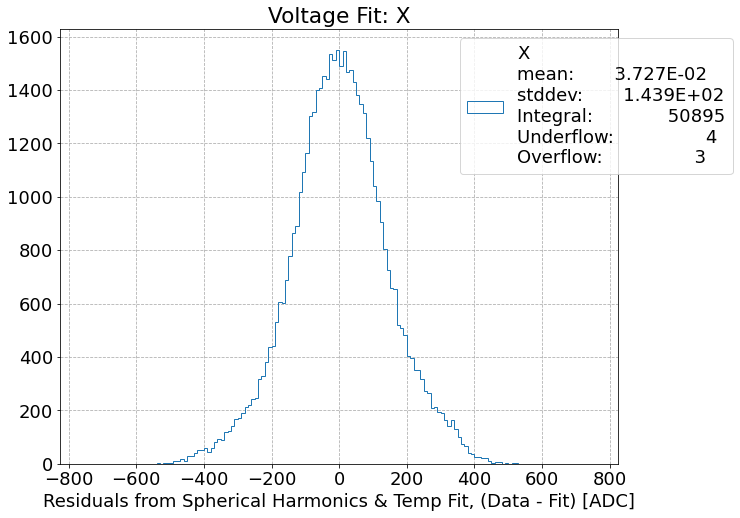

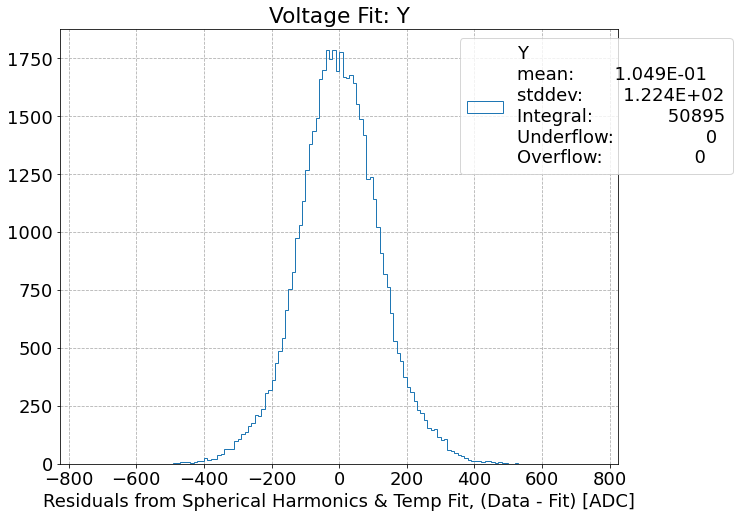

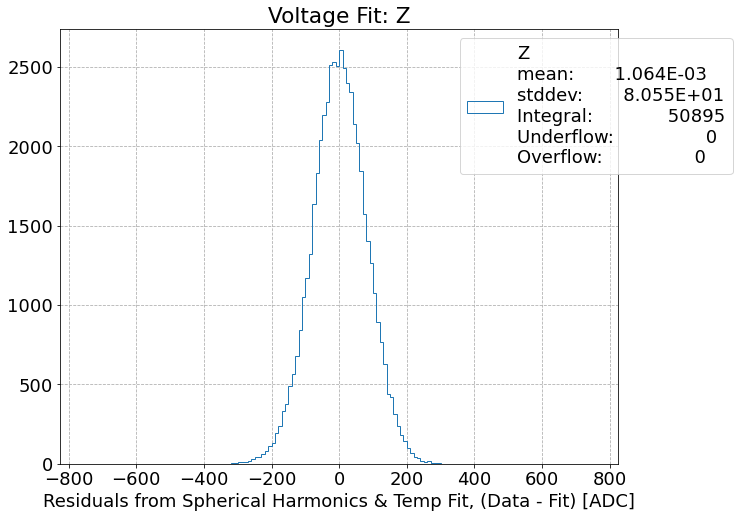

In [78]:
for comp in comps:
    fig, ax = plt.subplots()

    # bins=np.arange(-500, 510, 10)
    bins=np.arange(-750, 760, 10)
    # bins=np.arange(-1000, 1050, 50)

    ax.hist(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], bins=bins, histtype='step', label=f'{comp}\n'+get_label(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], bins))

    ax.set_xlabel('Residuals from Spherical Harmonics & Temp Fit, (Data - Fit) [ADC]');
    ax.set_title(f"Voltage Fit: {comp}")
    ax.legend(loc='upper left', bbox_to_anchor=(0.7, 1.0));

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

    ax.set_xlabel(r'$\theta$ [deg]')
    ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit')
    ax.set_title(f"Voltage Fit: {comp}");

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    ax.scatter(df_.phi_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

    ax.set_xlabel(r'$\phi$ [deg]')
    ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');
    ax.set_title(f"Voltage Fit: {comp}");

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    ax.scatter(df_[f'{probe}_Cal_T'], df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

    ax.set_xlabel(f'{probe}_Cal_T [deg C]')
    ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');
    ax.set_title(f"Voltage Fit: {comp}");

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    ax.scatter(df_[f'{probe}_Raw_{comp}'], df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

    ax.set_xlabel(f'Raw {comp}')
    ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');
    ax.set_title(f"Voltage Fit: {comp}");

## Simultaneous Fit, with Temperature & Field Strength

In [79]:
# rescale temperature
# tmax = 40.
# tmin = 10.
tmax = df[f'{probe}_Cal_T'].max()
tmin = df[f'{probe}_Cal_T'].min()
t_sub = (tmax + tmin) / 2
t_div = (tmax - tmin) / 2
ts_scaled = (df[f'{probe}_Cal_T'].values - t_sub) / t_div
df.loc[:, f'{probe}_Cal_T_rescaled'] = ts_scaled
# field
bmax = df['B_Hall_NMR'].max()
bmin = df['B_Hall_NMR'].min()
b_sub = (bmax + bmin) / 2
b_div = (bmax - bmin) / 2
bs_scaled = (df['B_Hall_NMR'].values - b_sub) / b_div
df.loc[:, 'B_Hall_NMR_rescaled'] = bs_scaled

In [80]:
df_ = df.copy()

In [81]:
tmax, tmin

(34.902, 11.303)

In [82]:
bmax, bmin, bmax-bmin

(1.00227150809336, 1.0013881144294534, 0.0008833936639065509)

In [83]:
# expected change from field strength
(bmax-bmin) * 2.863e6

2529.156059764455

In [84]:
def simultaneous_fit_rot_temp_B(theta, phi, temp_rescaled, B_rescaled, **params):
    # how many B terms to include?
    kmax = params['kmax']
    # how many temperature terms to include?
    nmax = params['nmax']
    # angular info
    B_n_vec = np.array([np.sin(theta) * np.cos(phi), np.sin(theta) * np.sin(phi), np.cos(theta)]).T
    rot = Rotation.from_euler('XYZ', angles=np.array([params['alpha'], params['beta'], params['gamma']]), degrees=False)
    B_n_vec_rot = rot.apply(B_n_vec)
    B_n_T = np.linalg.norm(B_n_vec_rot[:,:2], axis=1)
    B_n = np.linalg.norm(B_n_vec_rot, axis=1)
    costheta = B_n_vec_rot[:, 2] / B_n
    sintheta = B_n_T / B_n
    cosphi = B_n_vec_rot[:, 0] / B_n_T
#     sinphi = B_n_vec_rot[:, 1] / B_n_T
    
    result = np.zeros_like(theta)
    # loop through B Chebyshev
    for k in range(kmax+1):
        # turn on appropriate Chebyshev term
        coeffs_k = np.zeros(kmax+1)
        coeffs_k[k] = 1.
        T_k = np.polynomial.chebyshev.chebval(B_rescaled, coeffs_k)
        # loop through Temp Chebyshev
        for n in range(nmax+1):
            # turn on appropriate Chebyshev term
            coeffs_n = np.zeros(nmax+1)
            coeffs_n[n] = 1.
            T_n = np.polynomial.chebyshev.chebval(temp_rescaled, coeffs_n)
            # angular encodes the coefficient values
            # coeff "CNLM" -- C_nlm
            angular = params[f'C{k}{n}00'] + params[f'C{k}{n}10'] * costheta + params[f'C{k}{n}20'] * (3*costheta**2 - 1) + params[f'C{k}{n}22'] * (2*cosphi**2 - 1)*(sintheta**2) \
            + params[f'C{k}{n}30'] * (5*costheta**3 - 3*costheta) + params[f'C{k}{n}32'] * (2*cosphi**2 - 1)*(sintheta**2)*costheta
            result += T_k * T_n * angular
    
    return result

In [85]:
Vm = df_[f'{probe}_Raw_Z'].abs().max()
if abs(df_[f'{probe}_Raw_Z'].max()) > abs(df_[f'{probe}_Raw_Z'].min()):
    pass
else:
    Vm = -1 * Vm
Vm

-2816400.0

### One Component

- RESULTS FROM ANGULAR + TEMP FIT

alpha	1.77403701	0.01432254	(0.81%)	-1.55	-3.14159265	3.14159265	True

beta	-1.55454189	6.2355e-05	(0.00%)	2.25	-3.14159265	3.14159265	True

gamma	-3.14159265	0.02662969	(0.85%)	-3.08	-3.14159265	3.14159265	True

In [56]:
result_dict[comp].params['alpha'].value

NameError: name 'result_dict' is not defined

In [57]:
Bdata.min(), Bdata.max()

NameError: name 'Bdata' is not defined

In [58]:
# which component?
# comp = 'X'
# comp = 'Y'
comp = 'Z'
# rescale data?
data = deepcopy(df_[f'{probe}_Raw_{comp}'].values)
# data = data / np.max(np.abs(data))
tempdata = df_[f'{probe}_Cal_T_rescaled'].values
Bdata = df_['B_Hall_NMR_rescaled'].values
###
# uncertainty
sigma_est = 100 # 100 / 3e-6 ~ 3e-5
# sigma_est = 3e-5
###
model = lm.Model(simultaneous_fit_rot_temp_B, independent_vars=['theta', 'phi', 'temp_rescaled', 'B_rescaled'])
params = lm.Parameters()

params.add('kmax', value=1, vary=False)
params.add('nmax', value=2, vary=False)

# params.add('alpha', value=-1.55, vary=True, min=-np.pi, max=np.pi)
# params.add('beta', value=2.25, vary=True, min=-np.pi, max=np.pi)
# params.add('gamma', value=-3.08, vary=True, min=-np.pi, max=np.pi)

# Z
# params.add('alpha', value=1.77403701, vary=False, min=-np.pi, max=np.pi)
# params.add('beta', value=-1.55454189, vary=False, min=-np.pi, max=np.pi)
# params.add('gamma', value=-3.14159265, vary=False, min=-np.pi, max=np.pi)

# var_rot = True # takes a long time...not sure if fit will converge.
var_rot = False

params.add('alpha', value=result_dict[comp].params['alpha'].value, vary=var_rot, min=-np.pi, max=np.pi)
params.add('beta', value=result_dict[comp].params['beta'].value, vary=var_rot, min=-np.pi, max=np.pi)
params.add('gamma', value=result_dict[comp].params['gamma'].value, vary=var_rot, min=-np.pi, max=np.pi)

# spherical
# min_ = 0. # use 0 min?
min_ = None # or allow negative?
# max_ = 1.0
max_ = None

for k in range(params['kmax'] + 1):
    for n in range(params['nmax'] + 1):
        params.add(f'C{k}{n}00', value=0.5, vary=True, min=min_, max=max_)
        params.add(f'C{k}{n}10', value=0.5, vary=True, min=min_, max=max_)
#         params.add(f'C{k}{n}10', value=Vm, vary=True, min=min_, max=max_)
        params.add(f'C{k}{n}20', value=0.5, vary=True, min=min_, max=max_)
        params.add(f'C{k}{n}22', value=0.5, vary=True, min=min_, max=max_) # PHE
        params.add(f'C{k}{n}30', value=0.5, vary=True, min=min_, max=max_)
        params.add(f'C{k}{n}32', value=0.5, vary=True, min=min_, max=max_) # 3D Hall effect
    #     params.add(f'C{n}32', value=0.0, vary=False, min=min_, max=max_) # 3D Hall effect

result_simul_rot_temp_B = model.fit(data, theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, 
                                    temp_rescaled=tempdata, B_rescaled=Bdata, params=params,
                                    weights=1/(sigma_est*np.ones_like(df_[f'{probe}_Raw_{comp}'].values)), scale_covar=False)
# subtract off cos(theta)
df_.loc[:, f'simul_rot_temp_B_fit'] = result_simul_rot_temp_B.best_fit
df_.loc[:, f'{probe}_Raw_{comp}_min_simul_rot_temp_B'] = data - result_simul_rot_temp_B.best_fit

NameError: name 'result_dict' is not defined

In [ ]:
result_dict['X']

In [ ]:
# scan 3-5, using orientation from scan 3-5 fit, angles float
# X
result_simul_rot_temp_B

In [ ]:
# scan 3-5, using orientation from scan 3-5 fit, angles fixed
# X
result_simul_rot_temp_B

In [ ]:
# scan 3-5, using orientation from scan 3-5 fit, angles fixed
# Y
result_simul_rot_temp_B

In [ ]:
# scan 3-5, using orientation from scan 3-5 fit, angles fixed
# Z
result_simul_rot_temp_B

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=[df_.phi_B_true_deg], theta_list=[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_{comp}_min_simul_rot_temp']],
                          units_list=None, absval=True, colors_list=None, opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

In [ ]:
df_.columns

In [ ]:
fig, ax = plt.subplots()

# bins=np.arange(-500, 510, 10)
bins=np.arange(-750, 760, 10)
# bins=np.arange(-1000, 1050, 50)

ax.hist(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp_B'], bins=bins, histtype='step', label=get_label(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp_B'], bins))

ax.set_xlabel('Residuals from Spherical Harmonic & Temp Fit');
ax.set_title(f"Voltage Fit: {comp}")
ax.legend(loc='upper left', bbox_to_anchor=(0.7, 1.0));

In [ ]:
150 / 100  * 3e-5

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_.phi_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

ax.set_xlabel(r'$\phi$ [deg]')
ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_[f'{probe}_Cal_T'], df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

ax.set_xlabel(f'{probe}_Cal_T [deg C]')
ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df_[f'{probe}_Raw_{comp}'], df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

ax.set_xlabel(f'Raw {comp}')
ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');

In [ ]:
# REMEMBER! phi & theta expected to be passed in as degrees.
fig = spherical_scatter3d(phi_list=2*[df_.phi_B_true_deg], theta_list=2*[df_.theta_B_true_deg], r_list=[df_[f'{probe}_Raw_{comp}'], df_['simul_rot_temp_fit']],
                          units_list=['adc', 'adc'], absval=True, colors_list=['viridis', 'hot'], opacity_list=None, size_list=None,
                          inline=True, title=None, filename=None)

### All components (collect results)

In [86]:
comps = ['X', 'Y', 'Z']
result_dict_B = dict()

for comp in comps:
    print(f'Fitting {comp}')
    # rescale data?
    data = deepcopy(df_[f'{probe}_Raw_{comp}'].values)
    # data = data / np.max(np.abs(data))
    tempdata = df_[f'{probe}_Cal_T_rescaled'].values
    Bdata = df_['B_Hall_NMR_rescaled'].values
    ###
    # uncertainty
    sigma_est = 100 # 100 / 3e-6 ~ 3e-5
    # sigma_est = 3e-5
    ###
    model = lm.Model(simultaneous_fit_rot_temp_B, independent_vars=['theta', 'phi', 'temp_rescaled', 'B_rescaled'])
    params = lm.Parameters()

    params.add('kmax', value=1, vary=False)
    params.add('nmax', value=2, vary=False)

    # var_rot = True # takes a long time...not sure if fit will converge.
    var_rot = False

    params.add('alpha', value=result_dict[comp].params['alpha'].value, vary=var_rot, min=-np.pi, max=np.pi)
    params.add('beta', value=result_dict[comp].params['beta'].value, vary=var_rot, min=-np.pi, max=np.pi)
    params.add('gamma', value=result_dict[comp].params['gamma'].value, vary=var_rot, min=-np.pi, max=np.pi)

    # spherical
    # min_ = 0. # use 0 min?
    min_ = None # or allow negative?
    # max_ = 1.0
    max_ = None

    for k in range(params['kmax'] + 1):
        for n in range(params['nmax'] + 1):
            params.add(f'C{k}{n}00', value=0.5, vary=True, min=min_, max=max_)
            params.add(f'C{k}{n}10', value=0.5, vary=True, min=min_, max=max_)
    #         params.add(f'C{k}{n}10', value=Vm, vary=True, min=min_, max=max_)
            params.add(f'C{k}{n}20', value=0.5, vary=True, min=min_, max=max_)
            params.add(f'C{k}{n}22', value=0.5, vary=True, min=min_, max=max_) # PHE
            params.add(f'C{k}{n}30', value=0.5, vary=True, min=min_, max=max_)
            params.add(f'C{k}{n}32', value=0.5, vary=True, min=min_, max=max_) # 3D Hall effect
        #     params.add(f'C{n}32', value=0.0, vary=False, min=min_, max=max_) # 3D Hall effect

    result_simul_rot_temp_B = model.fit(data, theta=df_['theta_B_true'].values, phi=df_['phi_B_true'].values, 
                                        temp_rescaled=tempdata, B_rescaled=Bdata, params=params,
                                        weights=1/(sigma_est*np.ones_like(df_[f'{probe}_Raw_{comp}'].values)), scale_covar=False)
    # subtract off cos(theta)
    df_.loc[:, f'simul_rot_temp_B_fit'] = result_simul_rot_temp_B.best_fit
    df_.loc[:, f'{probe}_Raw_{comp}_min_simul_rot_temp_B'] = data - result_simul_rot_temp_B.best_fit
    result_dict_B[comp] = result_simul_rot_temp_B

Fitting X
Fitting Y
Fitting Z


In [87]:
result_dict_B['X']

In [88]:
result_dict_B['Y']

In [89]:
result_dict_B['Z']

In [97]:
z_dict = {k: result_dict_B['Z'].params[k].value for k in result_dict_B['Z'].params.keys() if k[0] == 'C'}

In [98]:
z_dict

{'C0000': -1881380.8449812671,
 'C0010': -466926.07726273214,
 'C0020': 191913.64964856106,
 'C0022': -726273.3617769319,
 'C0030': -206788.66407728312,
 'C0032': -123593.86607010859,
 'C0100': 35888.5863340367,
 'C0110': -241086.2456066586,
 'C0120': 76739.26794736736,
 'C0122': 54352.230949207915,
 'C0130': 288548.18921048514,
 'C0132': 1111881.7015990668,
 'C0200': -54269.76109876385,
 'C0210': -458383.81512703386,
 'C0220': -76597.37017137928,
 'C0222': -20914.549855356112,
 'C0230': -329931.729810944,
 'C0232': -522203.2193979804,
 'C1000': -2464.3618363920905,
 'C1010': -586460.5913436033,
 'C1020': 83532.65163570429,
 'C1022': 85697.73078014643,
 'C1030': 315256.302741876,
 'C1032': 1544760.144693295,
 'C1100': -88732.5894765991,
 'C1110': -896316.2101119664,
 'C1120': -118801.29073794554,
 'C1122': -26909.808292788835,
 'C1130': -526983.0007473563,
 'C1132': -666096.5213122327,
 'C1200': 35026.32367991641,
 'C1210': 403737.7727530774,
 'C1220': -6315.276428702903,
 'C1222': -42

In [101]:
sorted_values_z_dict = sorted(z_dict.items(), key=lambda x:abs(x[1]))

In [102]:
sorted_values_z_dict

[('C1000', -2464.3618363920905),
 ('C1220', -6315.276428702903),
 ('C0222', -20914.549855356112),
 ('C1122', -26909.808292788835),
 ('C1230', -30040.80373983374),
 ('C1200', 35026.32367991641),
 ('C0100', 35888.5863340367),
 ('C1222', -42539.44639390976),
 ('C0200', -54269.76109876385),
 ('C0122', 54352.230949207915),
 ('C0220', -76597.37017137928),
 ('C0120', 76739.26794736736),
 ('C1020', 83532.65163570429),
 ('C1022', 85697.73078014643),
 ('C1100', -88732.5894765991),
 ('C1120', -118801.29073794554),
 ('C0032', -123593.86607010859),
 ('C0020', 191913.64964856106),
 ('C0030', -206788.66407728312),
 ('C0110', -241086.2456066586),
 ('C0130', 288548.18921048514),
 ('C1030', 315256.302741876),
 ('C0230', -329931.729810944),
 ('C1210', 403737.7727530774),
 ('C0210', -458383.81512703386),
 ('C0010', -466926.07726273214),
 ('C1232', -500472.4110009191),
 ('C0232', -522203.2193979804),
 ('C1130', -526983.0007473563),
 ('C1010', -586460.5913436033),
 ('C1132', -666096.5213122327),
 ('C0022', 

In [ ]:
# re-add previous results
for comp in comps:
    data = deepcopy(df_[f'{probe}_Raw_{comp}'].values)
    df_.loc[:, f'{probe}_Raw_{comp}_min_simul_rot_temp'] = data - result_dict[comp].best_fit

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    # bins=np.arange(-500, 510, 10)
    bins=np.arange(-750, 760, 10)
    # bins=np.arange(-1000, 1050, 50)

    ax.hist(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], bins=bins, histtype='step', label=f'Fit 1 (no B): {comp}\n'+get_label(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], bins))
    ax.hist(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp_B'], bins=bins, histtype='step', label=f'Fit 2 (with B): {comp}\n'+get_label(df_[f'{probe}_Raw_{comp}_min_simul_rot_temp_B'], bins))

    ax.set_xlabel('Residuals from Spherical Harmonics & Temp Fit, (Data - Fit) [ADC]');
    ax.set_title(f"Voltage Fit: {comp}")
    ax.legend(loc='upper left', bbox_to_anchor=(0.7, 1.0));

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    ax.scatter(df_.theta_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot_temp_B'], s=2)

    ax.set_xlabel(r'$\theta$ [deg]')
    ax.set_ylabel('Residuals from Spherical Harmonic & Temp & B Fit')
    ax.set_title(f"Voltage Fit: {comp}");

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    ax.scatter(df_.phi_B_true_deg, df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

    ax.set_xlabel(r'$\phi$ [deg]')
    ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');
    ax.set_title(f"Voltage Fit: {comp}");

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    ax.scatter(df_[f'{probe}_Cal_T'], df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

    ax.set_xlabel(f'{probe}_Cal_T [deg C]')
    ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');
    ax.set_title(f"Voltage Fit: {comp}");

In [ ]:
for comp in comps:
    fig, ax = plt.subplots()

    ax.scatter(df_[f'{probe}_Raw_{comp}'], df_[f'{probe}_Raw_{comp}_min_simul_rot_temp'], s=2)

    ax.set_xlabel(f'Raw {comp}')
    ax.set_ylabel('Residuals from Spherical Harmonic & Temp Fit');
    ax.set_title(f"Voltage Fit: {comp}");